**Authors:**  Viktor Domazetoski<br>
**Copyright:** 2022 Viktor Domazetoski<br>
**License:** Apache License 2.0

<div class="alert alert-block alert-success">
This notebook takes the created files from the <em>Calculate CIOTs</em> notebook and calculates the aggregations and visualizations discussed in the paper  <strong>Sensitivity Analysis of Shock Distributions in the World Economy</strong>. 

# Imports

In [1]:
"""Numerical and statistical libraries"""
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.preprocessing import StandardScaler

"""Visualization libraries"""
from matplotlib import pyplot as plt
import seaborn as sns
import matplotlib.patches as ptc
import plotly.express as px

"""Other libraries"""
import pickle
import os

# CIOT Class

In [2]:
class CIOT:
    def __init__(self,
                 excel_dataframe=None,
                 year=None,
                 N_sectors=56,
                 N_countries=44):
        """Initialize Country Input Output class.
        
        Input: 
            excel_dataframe (pd.DataFrame): World Input Output Data, currently configured for data from 2016 WIOT release
            year (str): Year of the WIOT table. For the 2016 WIOT release it ranges from 2000 to 2014
            N_sectors (int): Number of sectors in the WIOT table. For the 2016 WIOT release it is 56
            N_countries (int): Number of countries in the WIOT table. For the 2016 WIOT release it is 44
        """

        self.excel_dataframe = excel_dataframe  # World Input Output Table Data
        self.year = year  # Year of the WIOT table
        self.N_sectors = N_sectors  # Number of sectors
        self.N_countries = N_countries  # Number of countries
        self.N = N_countries * N_sectors  # Number of sectors * countries in the WIOT table
        self.country_names = None  # Country names of the WIOT table

        self.z = None  # Z matrix
        self.x = None  # x vector
        self.f = None  # f vector

        self.beta = None  # beta vector
        self.eps = None  # eps vector

        self.A = None  # A matrix
        self.L = None  # L matrix

        self.delta_A = None  # delta A matrix
        self.dL = None  # dL matrix - derivative of L
        self.delta_L = None  # delta L matrix - deltaA * dL

        self.P = None  # shock matrix P

    def get_country_names(self):
        """Set and return country names from the Input Data"""
        country_names = []
        for i in range(self.N_countries):
            country_names.append(
                self.excel_dataframe.columns[i * self.N_sectors][2])
        self.country_names = country_names
        return country_names

    def calculate_country_Z_matrix(self):
        """Calculate the country-aggregated Z matrix from the Input Data"""
        Z = np.zeros((self.N_countries, self.N_countries))
        for i in range(self.N_countries):
            for j in range(self.N_countries):
                Z[i, j] += np.sum(
                    self.excel_dataframe.values[i * self.N_sectors:(i + 1) *
                                                self.N_sectors,
                                                j * self.N_sectors:(j + 1) *
                                                self.N_sectors])
        self.Z = Z
        return Z

    def calculate_country_x(self):
        """Calculate the country-aggregated x vector from the Input Data - Equation (2)"""
        x = np.zeros(self.N_countries)
        for i in range(self.N_countries):
            x[i] += np.sum(
                self.excel_dataframe.values[-1][i * self.N_sectors:(i + 1) *
                                                self.N_sectors])
        self.x = x
        return x

    def calculate_country_f(self):
        """Calculate the country-aggregated f vector from the Input Data - Equation (1)"""
        f = np.zeros(self.N_countries)
        for i in range(self.N_countries):
            tmp = self.excel_dataframe.values[i * self.N_sectors:(i + 1) *
                                              self.N_sectors,
                                              self.N_countries *
                                              self.N_sectors:-1]
            f[i] = np.sum(tmp[tmp > 0])
        self.f = f
        return f

    def calculate_beta(self):
        """Calculate the country-aggregated beta vector as a normalized f vector - Equation (3)"""
        beta = np.abs(self.f) / np.sum(np.abs(self.f))
        self.beta = beta
        return beta

    def calculate_eps(self,
                      TFP_file=None,
                      standardize=True,
                      normalize=True,
                      log=True):
        """
        Calculate the country-aggregated eps vector from the Total Factor Productivity data
        
        Input:
            TFP_file (pd.DataFrame): DataFrame containing information on Total Factor Productivity 
            standardize (bool): Whether to standardize the eps vector
            normalize (bool): Whether to normalize the eps vector
            log (bool): Whether to log-transform the eps vector. This means we are doing the transformations on eps instead of zeta 
         """

        if (TFP_file is None):
            eps = np.ones(self.N_countries)

        else:
            eps = np.ones(self.N_countries) * 100
            for delta_year in range(self.year - 1990):
                eps += TFP_file[1990 + delta_year].values

        if (log):
            eps = np.log(eps)

        if (standardize):
            scaler = StandardScaler(with_mean=False)
            eps = scaler.fit_transform(eps.reshape(-1, 1)).reshape(-1)

        if (normalize):
            eps = eps / np.sum(eps)

        self.eps = eps
        return eps

    def calculate_A(self):
        """Calculate the country-aggregated A matrix as the Z matrix normalized by the x vector - Equation (5)"""
        A = np.zeros(self.Z.shape)
        for i in range(A.shape[0]):
            for j in range(A.shape[1]):
                A[i, j] = self.Z[i, j] / self.x[j]
        self.A = A
        return A

    def calculate_L(self):
        """Calculate the country-aggregated inverse Leontief L matrix as the the inverse of I-A - Equation (7)"""
        L = np.linalg.inv(np.identity(self.A.shape[0]) - self.A)
        self.L = L
        return L

    def fixed_matrix_derivative(self, matrix, country_i, country_j):
        """
        Calculate the matrix derivative for a specific link of the network - Equation (8)
        
        Input:
            matrix (np.array(N,N)): Input matrix
            country_i (int): Index of input country
            country_j (int): Index of output country
         """
        dM_ij = np.zeros((self.N_countries, self.N_countries))
        for p in range(self.N_countries):
            for q in range(N_countries):
                dM_ij[p, q] = matrix[country_j, p] * matrix[q, country_i]
        return dM_ij

    def whole_matrix_derivative(self, matrix):
        """
        Calculate the matrix derivative for the entire matrix  - Equation (10)
        
        Input: 
            matrix (np.array(N,N)): Input matrix
         """
        dM = np.kron(matrix.T, matrix)
        return dM

    def calculate_L_matrix_derivative(self):
        """Calculate the whole matrix derivative of L  - Equation (10)"""
        dL = self.whole_matrix_derivative(self.L)
        self.dL = dL
        return dL

    def calculate_delta_A(self, scalar=0.01, change_type="additive"):
        """
        Calculate the change in A.
        
        Input:
            scalar (float): Amount of change. Depends on change_type.
            change_type (str): "multiplicative" or "additive" Type of change. 
                                If additive then each element of the change is equal to the scalar and equal for all links. 
                                If multiplicative then each element of the change is equal to the scalar multiplied with A.
         """
        if (change_type == "multiplicative"):
            delta_A = scalar * self.A
        elif (change_type == "additive"):
            delta_A = np.ones(self.A.shape) * scalar
        self.delta_A = delta_A
        return delta_A

    def calculate_delta_L(self):
        """Calculate the change in L as the derivative of L times the change in A: delta_L = dL * delta_A  - Equation (9)"""
        delta_L = self.dL * self.delta_A.reshape(-1)[:, None].T
        self.delta_L = delta_L
        return delta_L

    def calculate_full_P_matrix(self):
        """Calculate the full P matrix based on delta_L, eps and beta - Equation (12)"""
        beta_matrix = np.array([self.beta for j in range(self.N_countries)])
        beta_vec = beta_matrix.flatten()

        eps_matrix = np.array([self.eps for i in range(self.N_countries)])
        eps_vec = eps_matrix.T.flatten()

        p = np.zeros((self.N_countries**2, self.N_countries**2),
                     dtype=np.double)
        for u in range(self.N_countries):
            for v in range(self.N_countries):
                p[:, u * self.N_countries + v] = np.exp(
                    eps_vec * self.delta_L[:, u * self.N_countries + v] *
                    beta_vec)
        self.P = p
        return p

# Load CIOT classes

In [3]:
CIOT_data = dict()

In [4]:
# Read CIOT data for years 2000-2014
input_dir = "CIOT-Final-Additive/"
for year in np.arange(2000,2015):
    with open(input_dir + 'CIOT_'+str(year)+'.pkl', 'rb') as input:
        CIOT_data[str(year)] = pickle.load(input)

## Define parameters and color schemes

In [5]:
countries = np.array(CIOT_data["2000"].country_names)
N_countries = len(countries)

In [6]:
fig_save_dir = "Figures-Final/"  # Directory to save the images
col_dark = sns.color_palette("dark").as_hex() # Color palette used for the countries of interest
col_list = sns.color_palette("deep").as_hex() # Color palette used for remaining countries
top_country_colors = { # Colorscheme for the countries of interest
    "CHN": col_dark[3], 
    "DEU": col_dark[1],
    "RUS": col_dark[4],
    "JPN": col_dark[2],
    "USA": col_dark[0],
    "ROW": "#5F6510",
    "WLD": col_dark[5],
    "WLD2":col_dark[9]
}

countries_OI = [np.where(countries == country)[0][0] for country in list(top_country_colors.keys())[:6]] # The indices of the countries of interest
eps = 0.000000000000001 # We use log(log(x+eps)) since the lowest value of x can be 1 which may lead to log(log(1)) which is undefined

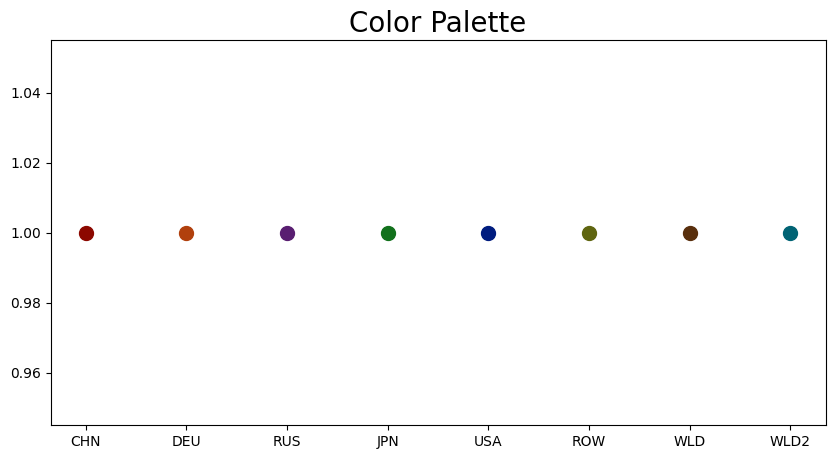

In [7]:
# Visualize the color palette used for the countries of interest
plt.figure(figsize=(10,5))
plt.title("Color Palette", fontsize=20)
for i, col in enumerate(top_country_colors.values()): 
    plt.plot(i, 1, "o", markersize = 10, color=col)
plt.xticks(np.arange(len(top_country_colors)), top_country_colors.keys())
plt.show()

## Helper Functions

In [8]:
def calculate_min_max_values_CIOT(CIOT_data, matrix="P"):
    """
    Calculate min and max values of a specific CIOT matrix across all years. Used to keep the same scale in visualizations. 

    Input:
        matrix (str): Input matrix such as "p", "Z", "A"
    
    Returns:
        The minimum and maximum values of the matrix across time. 
    """
    min_val = +np.inf
    max_val = -np.inf
    for year in CIOT_data.keys():
        if (matrix == "Z"):
            tmp_min = np.min(CIOT_data[year].Z)
            tmp_max = np.max(CIOT_data[year].Z)

        if (matrix == "A"):
            tmp_min = np.min(CIOT_data[year].A)
            tmp_max = np.max(CIOT_data[year].A)

        if (matrix == "P"):
            tmp_min = np.min(CIOT_data[year].P)
            tmp_max = np.max(CIOT_data[year].P)

        if (tmp_min < min_val):
            min_val = tmp_min

        if (tmp_max > max_val):
            max_val = tmp_max

    return min_val, max_val

def calculate_min_max_values(matrices):
    """
    Calculate min and max values of an array of matrices across all years. Used to keep the same scale in visualizations. 

    Input:
        matrix (np.array(t, N, N)): Array of matrices
    
    Returns:
        The minimum and maximum values of the input matrices. 
    """
    min_val = +np.inf
    max_val = -np.inf

    for t in range(matrices.shape[0]):
        tmp_min = np.min(matrices[t])
        tmp_max = np.max(matrices[t])

        if (tmp_min < min_val):
            min_val = tmp_min

        if (tmp_max > max_val):
            max_val = tmp_max

    return min_val, max_val

def visualize_matrix(fig,
                     ax,
                     mat,
                     title,
                     x_countries=countries,
                     y_countries=countries,
                     vmin=None,
                     vmax=None,
                     cmap="inferno"):
    """
    Visualize a NxN matrix. 

    Input:
        fig   (plt.figure)   
        ax    (plt.axes)
        mat   (np.array(N,N)): Input matrix
        title (str) : Title of matrix
        x_countries (np.array(N)): List of countries 
        y_countries (np.array(N)): List of countries
        vmin (float): Smallest value to visualize
        vmax (float): Largest value to visualize
        cmap (string): pyplot colormap
    """

    plt.title(title, fontsize=18)
    plt.imshow(mat, cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, N_countries))
    ax.set_xticklabels(x_countries, rotation='vertical', fontsize=14)
    ax.set_yticks(np.arange(0, N_countries))
    ax.set_yticklabels(y_countries, rotation='horizontal', fontsize=14)
    ax.xaxis.tick_top()

def visualize_sorted_matrix(fig,
                            ax,
                            mat,
                            title,
                            x_countries=countries,
                            y_countries=countries,
                            vmin=None,
                            vmax=None,
                            cmap="inferno"):
    """
    Sort NxN matrix by columns and rows and visualize it. 

    Input:
        fig   (plt.figure)   
        ax    (plt.axes)
        mat   (np.array(N,N)): Input matrix
        title (str) : Title of matrix
        x_countries (np.array(N)): List of countries 
        y_countries (np.array(N)): List of countries
        vmin (float): Smallest value to visualize
        vmax (float): Largest value to visualize
        cmap (string): pyplot colormap
    """
    
    # Calculate matrix column and row averages to sort by
    Aggregated_Input_values = np.sum(mat, axis=1) 
    Aggregated_Output_values = np.sum(mat, axis=0)

    # Sort matrix by rows
    input_inds = Aggregated_Input_values.argsort()[::-1]
    mat_tmp = mat[input_inds]
    y_countries = np.array(y_countries)[input_inds]

    # Sort matrix by columns
    output_inds = Aggregated_Output_values.argsort()[::-1]
    mat_final = mat_tmp[:, output_inds]
    x_countries = np.array(x_countries)[output_inds]

    plt.title(title, fontsize=18)
    plt.imshow(mat_final, cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_xticks(np.arange(0, N_countries))
    ax.set_xticklabels(x_countries, rotation='vertical', fontsize=14)
    ax.set_yticks(np.arange(0, N_countries))
    ax.set_yticklabels(y_countries, rotation='horizontal', fontsize=14)
    ax.xaxis.tick_top()

def visualize_rankings(fig, ax, data_1, data_2, title_1, title_2):
    """
    Visualize ranking over time.  

    Input:
        fig   (plt.figure)   
        ax    (plt.axes)
        data_1   (np.array(t, N)): First input vector for a given time period  (Left side of plot)
        data_1   (np.array(t, N)): Second input vector for a given time period (Right side of plot)
        title_1 (str) : Title for first given input vector
        title_2 (str) : Title for second given input vector
    """
    sns.set_theme(style="white", palette="pastel")
    plt.subplot(121)
    
    # Calculate rankings of the first input vector of each country for each year in the time period
    country_ranks = np.zeros((len(CIOT_data.keys()), len(countries)), int)
    for year_i, year in enumerate(CIOT_data.keys()):
        input_rankings = data_1[year_i].argsort()[::-1]
        for country_i in range(len(countries)):
            country_ranks[year_i, country_i] = N_countries - np.where(
                input_rankings == country_i)[0][0]

    input_rankings_2000 = data_1[0].argsort()
    country_ranks_2000 = countries[input_rankings_2000]
    input_rankings = data_1[-1].argsort()
    country_ranks_2014 = countries[input_rankings]
    
    plt.title(title_1, size=25)
    for i in range(country_ranks.shape[1]):
        if (countries[i] in top_country_colors.keys()):
            plt.plot(
                country_ranks.T[i],
                "-o",
                linewidth=5,
                markersize=12,
                alpha=0.9,
                color=top_country_colors[countries[i]]
            )
        else:
            plt.plot(
                country_ranks.T[i],
                "--",
                linewidth=4,
                markersize=12,
                alpha=0.6,
                color=col_list[i % len(col_list)]
            )
    plt.tight_layout()
    plt.ylim(0, 45)
    plt.xlim(-1, 15)

    ax[0].set_xticks(np.arange(15))
    ax[0].set_xticklabels(np.arange(2000, 2015), size=20, rotation=30)
    ax[0].set_yticks(np.arange(1, CIOT_data[year].Z.shape[0] + 1))
    ax[0].set_yticklabels(country_ranks_2000, rotation='horizontal', size=16)
    ax2 = ax[0].twinx()
    ax2.set_yticks(np.arange(1, CIOT_data[year].Z.shape[0] + 2))
    ax2.set_yticklabels(np.hstack((country_ranks_2014, "")),
                        rotation='horizontal',
                        size=16)

    plt.subplot(122)
    
    # Calculate rankings of the second input vector of each country for each year in the time period
    country_ranks = np.zeros((len(CIOT_data.keys()), len(countries)), int)
    for year_i, year in enumerate(CIOT_data.keys()):
        output_rankings = data_2[year_i].argsort()[::-1]
        for country_i in range(len(countries)):
            country_ranks[year_i, country_i] = N_countries - np.where(
                output_rankings == country_i)[0][0]

    output_rankings_2000 = data_2[0].argsort()  #[::-1]
    country_ranks_2000 = countries[output_rankings_2000]
    output_rankings = data_2[-1].argsort()  #[::-1]
    country_ranks_2014 = countries[output_rankings]

    plt.title(title_2, size=25)
    for i in range(country_ranks.shape[1]):
        if (countries[i] in top_country_colors.keys()):
            plt.plot(
                country_ranks.T[i],
                "-o",
                linewidth=5,
                markersize=12,
                alpha=0.9,
                color=top_country_colors[countries[i]]
            )
        else:
            plt.plot(
                country_ranks.T[i],
                "--",
                linewidth=4,
                markersize=12,
                alpha=0.6,
                color=col_list[i % len(col_list)]
            )
    plt.tight_layout()
    plt.ylim(0, 45)
    plt.xlim(-1, 15)

    ax[1].set_xticks(np.arange(15))
    ax[1].set_xticklabels(np.arange(2000, 2015), size=20, rotation=30)
    ax[1].set_yticks(np.arange(1, CIOT_data[year].Z.shape[0] + 1))
    ax[1].set_yticklabels(country_ranks_2000, rotation='horizontal', size=16)
    ax2 = ax[1].twinx()
    ax2.set_yticks(np.arange(1, CIOT_data[year].Z.shape[0] + 2))
    ax2.set_yticklabels(np.hstack((country_ranks_2014, "")),
                        rotation='horizontal',
                        size=16)

def visualize_time_series(fig, ax, data_1, data_2, title_1, title_2):
    """
    Visualize time series.  

    Input:
        fig   (plt.figure)   
        ax    (plt.axes)
        data_1   (np.array(t, N)): First input vector for a given time period  (Left side of plot)
        data_1   (np.array(t, N)): Second input vector for a given time period (Right side of plot)
        title_1 (str) : Title for first given input vector
        title_2 (str) : Title for second given input vector
    """
    plt.subplot(121)
    plt.title(title_1, size=30)
    for i in range(data_1.shape[1]):
        if i in countries_OI:
            plt.plot(data_1[:, i], # Visualize countries of interest with above specified color scheme
                     "-o",
                     label=countries[i],
                     linewidth=5,
                     markersize=12,
                     alpha=0.7,
                     color=top_country_colors[countries[i]]) 
        else:
            plt.plot(data_1[:, i], # Visualize rest of countries in grayscale
                     "--",
                     linewidth=4,
                     markersize=12,
                     alpha=0.2,
                     color="gray")
    plt.plot(np.exp(np.mean(np.log(data_1), axis=1)), # Visualize average country time series 
             "-o",
             linewidth=5,
             markersize=12,
             alpha=0.7,
             label="World",
             color=top_country_colors["WLD"])
    
    ax[0].set_xticks(np.arange(15))
    ax[0].set_xticklabels(np.arange(2000, 2015), size=20, rotation=30)
    plt.xlim(-1, 15)
    plt.legend()
    plt.tight_layout()

    plt.subplot(122)
    plt.title(title_2, size=30)
    for i in range(data_2.shape[1]):
        if i in countries_OI:
            plt.plot(data_2[:, i], # Visualize countries of interest with above specified color scheme
                     "-o",
                     label=countries[i],
                     linewidth=5,
                     markersize=12,
                     alpha=0.7,
                     color=top_country_colors[countries[i]])
        else:
            plt.plot(data_2[:, i], # Visualize rest of countries in grayscale
                     "--",
                     linewidth=4,
                     markersize=12,
                     alpha=0.2,
                     color="gray")
    plt.plot(np.exp(np.mean(np.log(data_2), axis=1)), # Visualize average country time series 
             "-o",
             label="World",
             linewidth=5,
             markersize=12,
             alpha=0.7,
             color=top_country_colors["WLD"])

    ax[1].set_xticks(np.arange(15))
    ax[1].set_xticklabels(np.arange(2000, 2015), size=22, rotation=30)
    plt.xlim(-1, 15)
    plt.tight_layout()
    plt.show()

def visualize_polar(fig,
                    ax,
                    title,
                    df,
                    split,
                    split_values,
                    data,
                    colors,
                    rmin=None,
                    rmax=None):
    """
    Visualize polar plot.  

    Input:
        fig   (plt.figure)   
        ax    (plt.axes): pyplot.PolarAxes
        df    (pd.DataFrame): DataFrame containing plot information
        split (str): column name to split the data on
        split_values (list): list of values to split the data on
        data  (str): column name with plot information
        colors (list): color scheme
        rmin (float) : Smallest value to visualize
        rmax (float) : Largest value to visualize
    """
    ax.set_title(title, fontsize=18)
    for i, value in enumerate(split_values):
        df_tmp = df[df[split] == value]
        theta = list(2 * np.pi * np.linspace(0, 1, N_countries)) + [0]
        r = list(df_tmp[data]) + [df_tmp[data].values[0]]
        c = ax.plot(theta,
                    r[::-1],
                    linewidth=3,
                    alpha=0.7,
                    color=colors[i],
                    label=value)

    if (rmin is not None):
        rticks = np.linspace(rmin, rmax, 5)[1:-1]
        ax.set_rticks(rticks, [])
        ax.set_rlim = (rmin, rmax)
    else:
        rticks = np.linspace(np.min(df[data]), np.max(df[data]), 5)[1:-1]
        ax.set_rticks(rticks, [])
    ax.set_theta_zero_location("N")
    ax.set_thetagrids(360 * np.linspace(0, 1, N_countries + 1)[1:],
                      countries[::-1])

# P Operation Analysis

## Shock Matrix $\mathcal{P}^{uv}_{ij}$

In [9]:
p_min_val, p_max_val = calculate_min_max_values_CIOT(CIOT_data, matrix = "P")
p_min_val, p_max_val

(1.0, 1.0003011959735144)

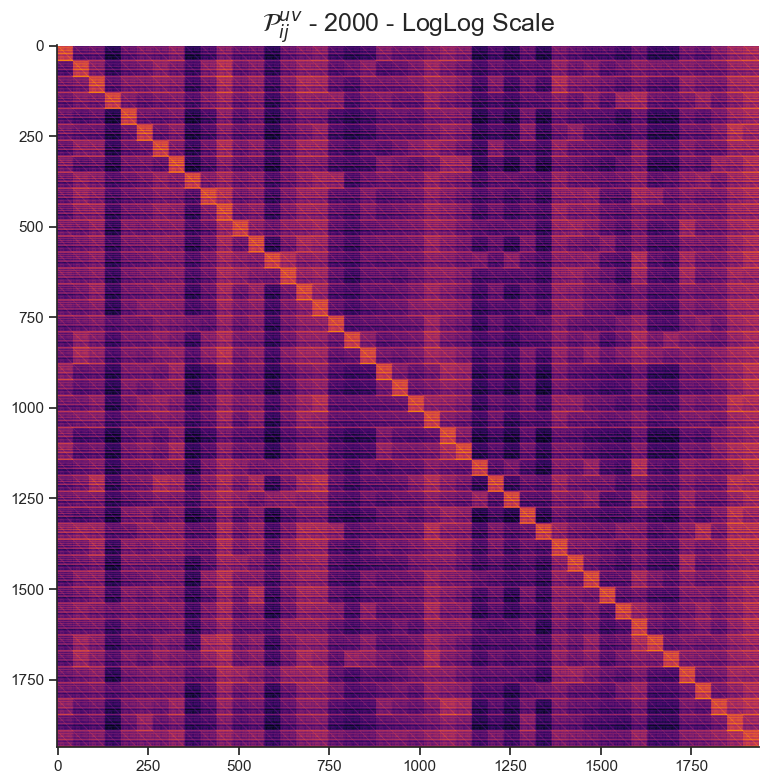

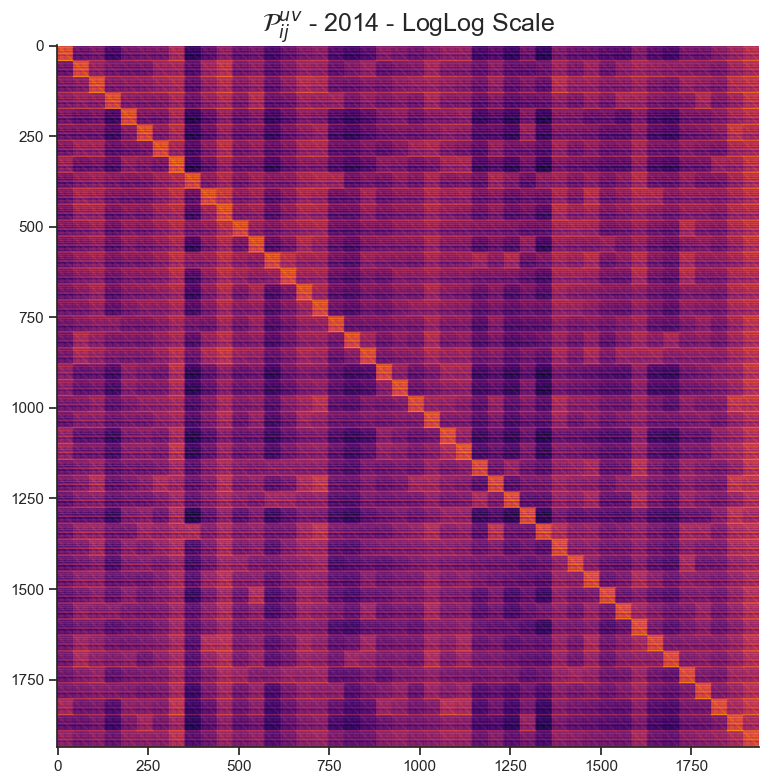

In [10]:
# Visualize the entire Shock Matrix P for the years 2000 and 2014
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)

for year in ["2000", "2014"]:
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    plt.title(r"$\mathcal{P}^{uv}_{ij}$ - "+year+" - LogLog Scale", fontsize=18)
    plt.imshow(np.log(np.log(CIOT_data[year].P+eps)), cmap = "inferno", vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

## Disturbance Start Matrix Sensitivity $\mathcal{P}^{uv}_{::}$

In [11]:
P_uv_agg = np.zeros((len(CIOT_data.keys()), N_countries, N_countries))
for t, year in enumerate(CIOT_data.keys()):
    for u in range(N_countries):
        for v in range(N_countries):
            log_p_uv = np.log(CIOT_data[year].P[:, u*N_countries + v])
            P_uv_agg[t,u,v] = np.exp(np.mean(log_p_uv))

In [12]:
p_min_val, p_max_val = calculate_min_max_values(P_uv_agg)
p_min_val, p_max_val

(1.0000000022072792, 1.0000002932515093)

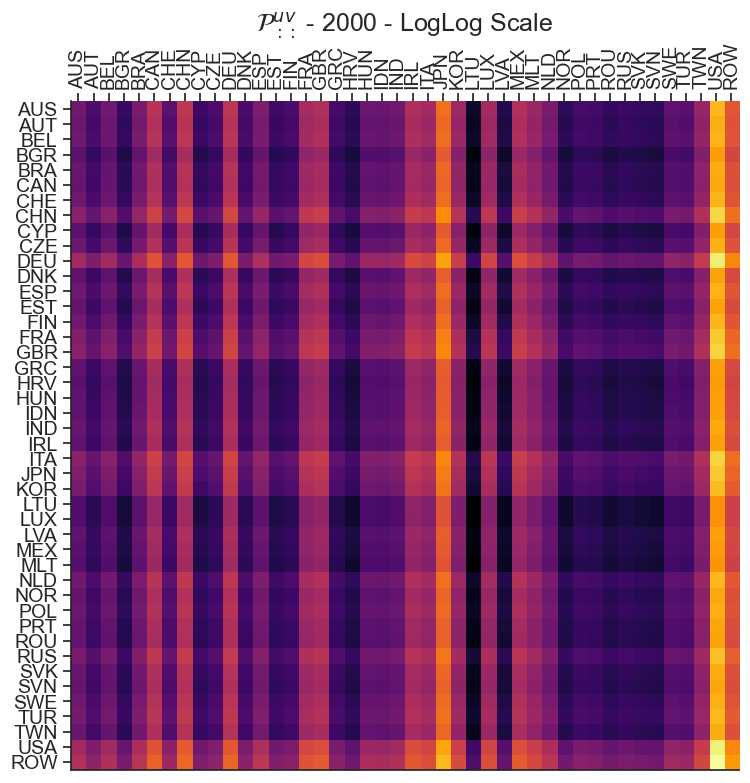

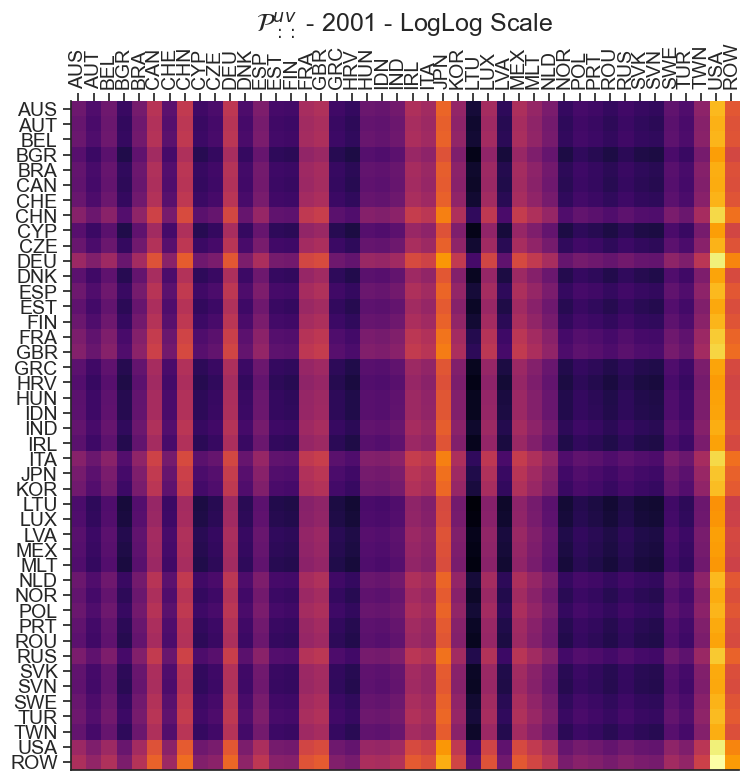

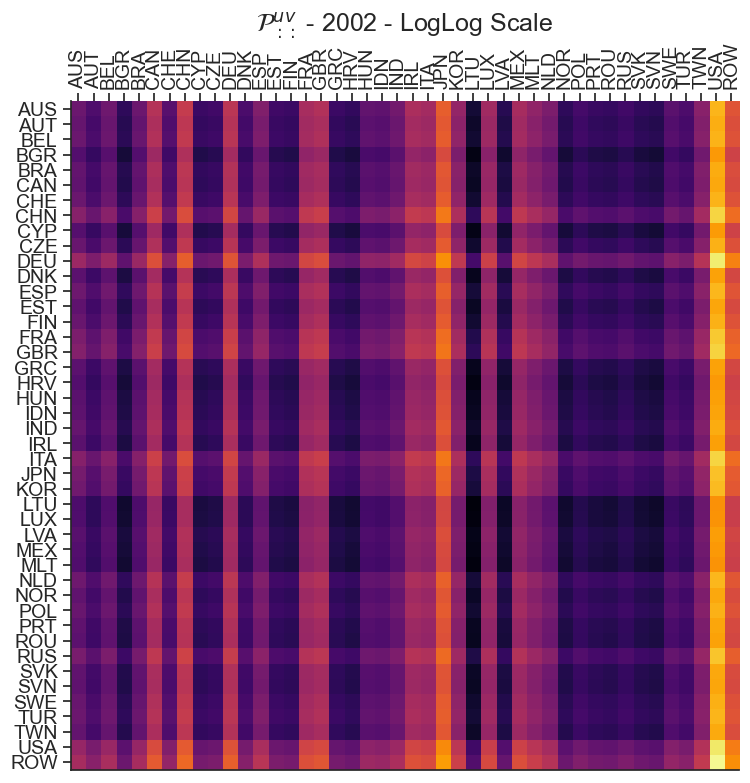

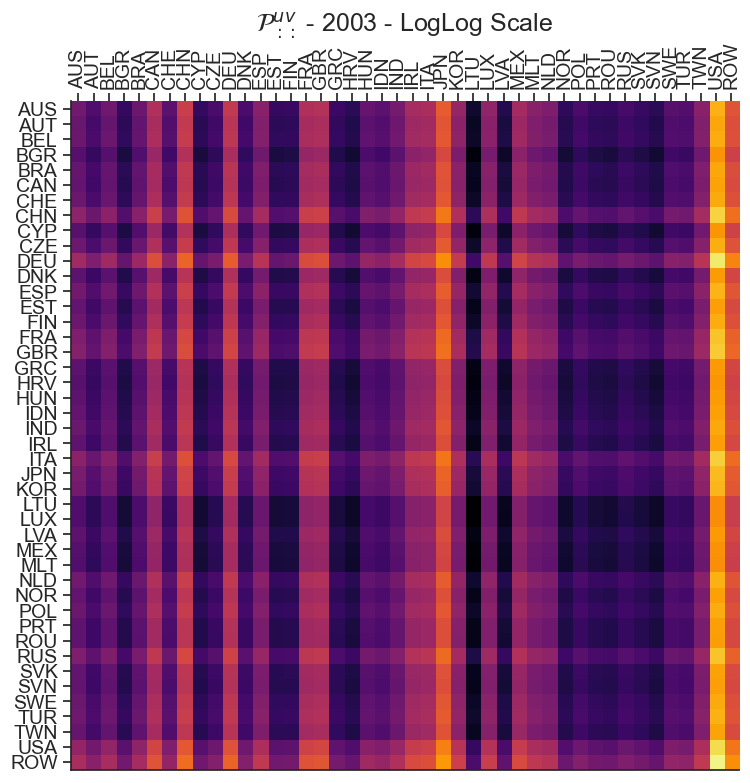

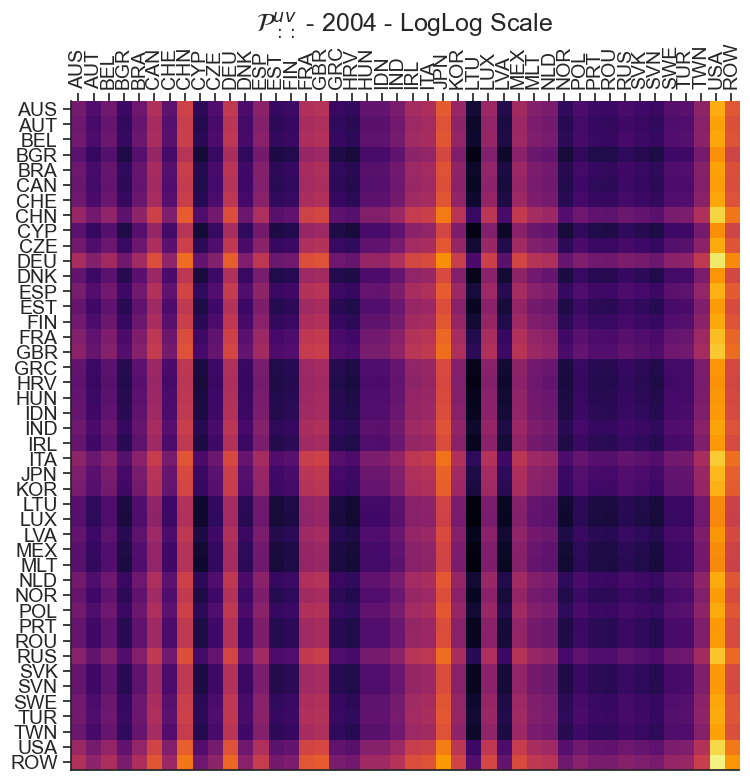

...

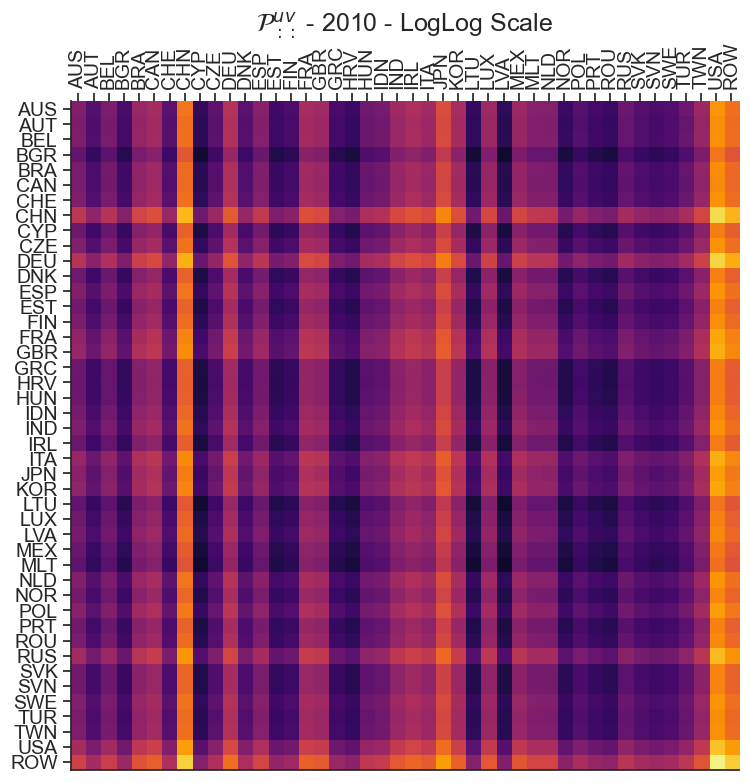

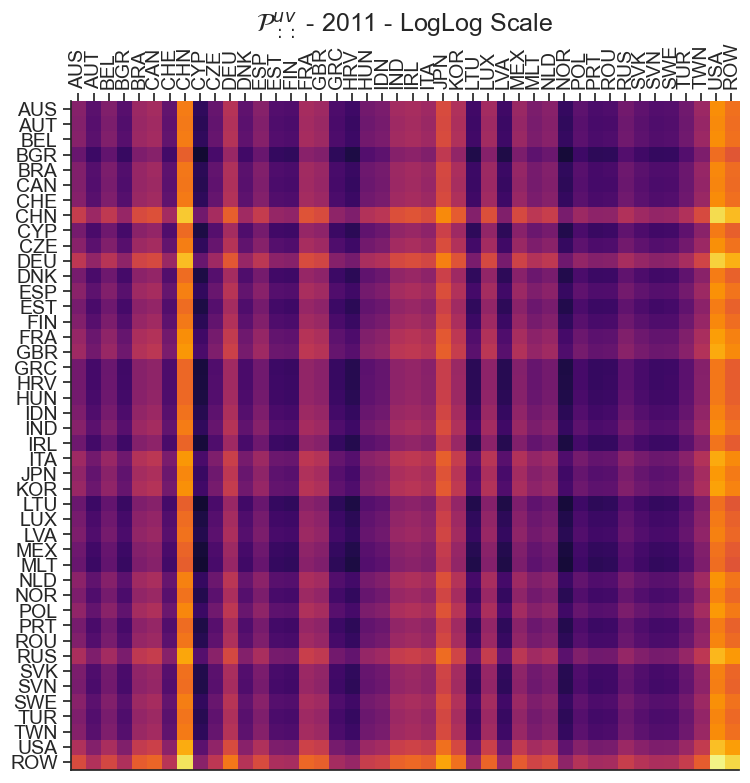

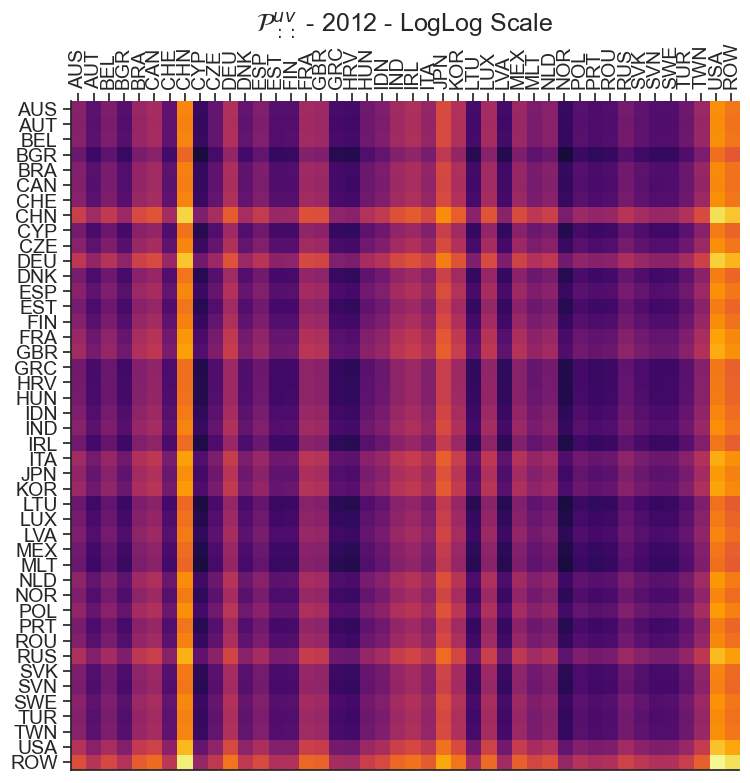

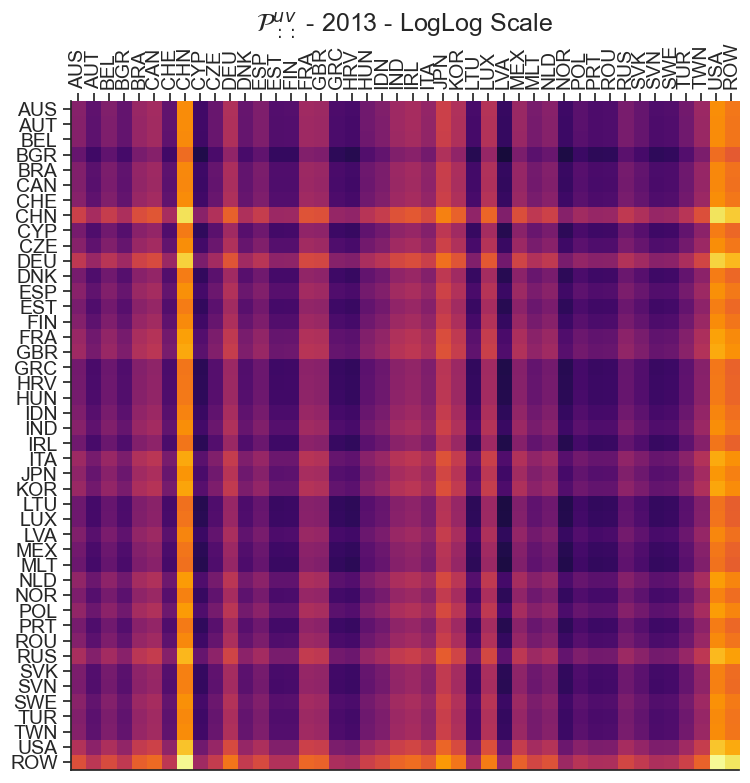

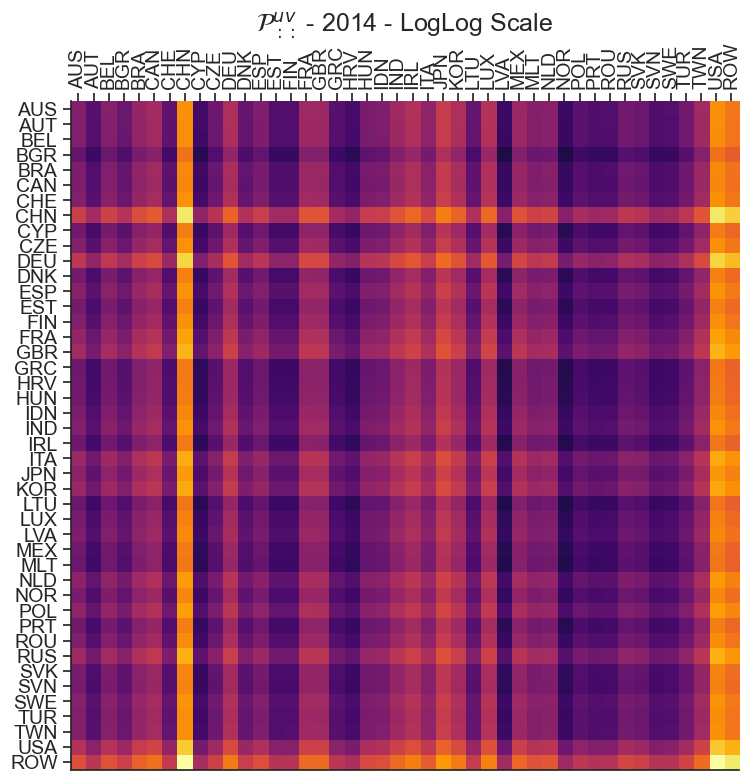

In [13]:
# Visualize the Disturbance Start Matrix Sensitivity P^{uv} for the period 2000-2014
for t, year in enumerate(CIOT_data.keys()):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    data = np.log(np.log(P_uv_agg[t]+eps))
    title = r"$\mathcal{P}^{uv}_{::}$ - "+year+" - LogLog Scale"
    visualize_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

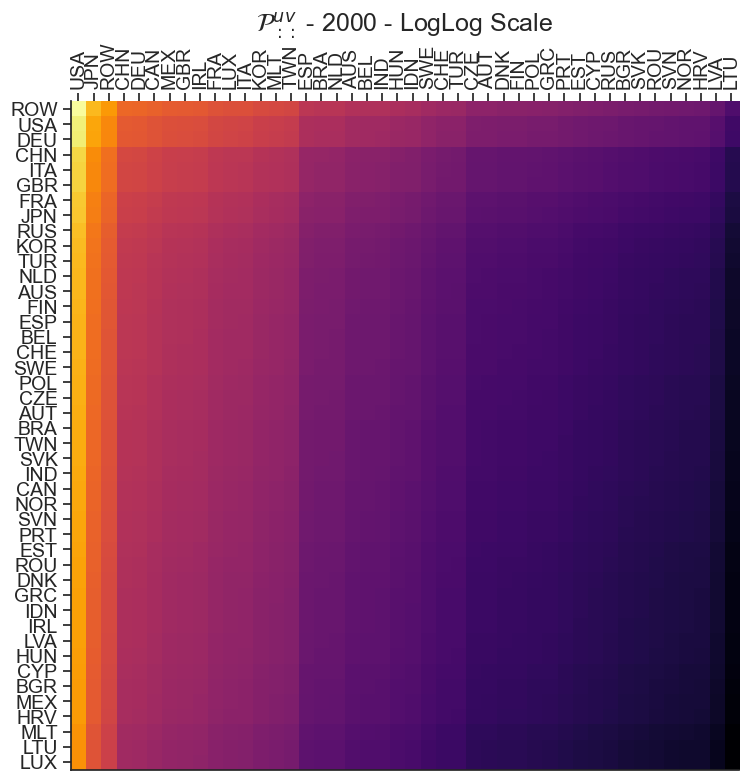

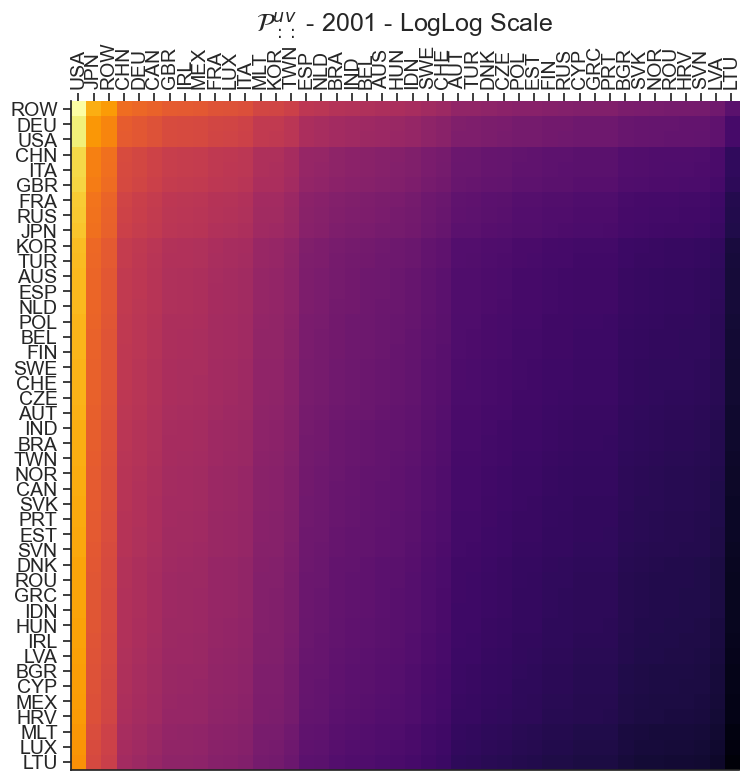

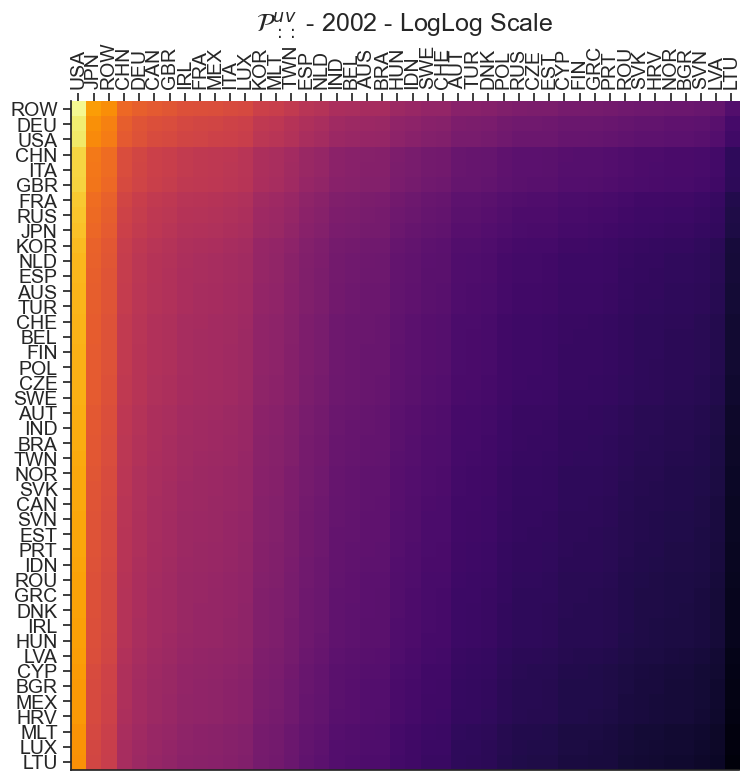

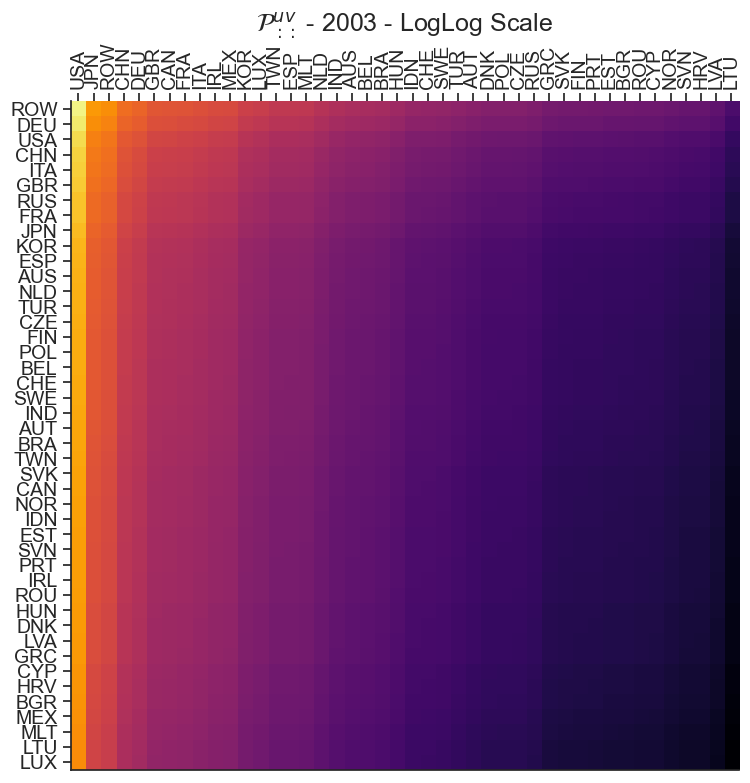

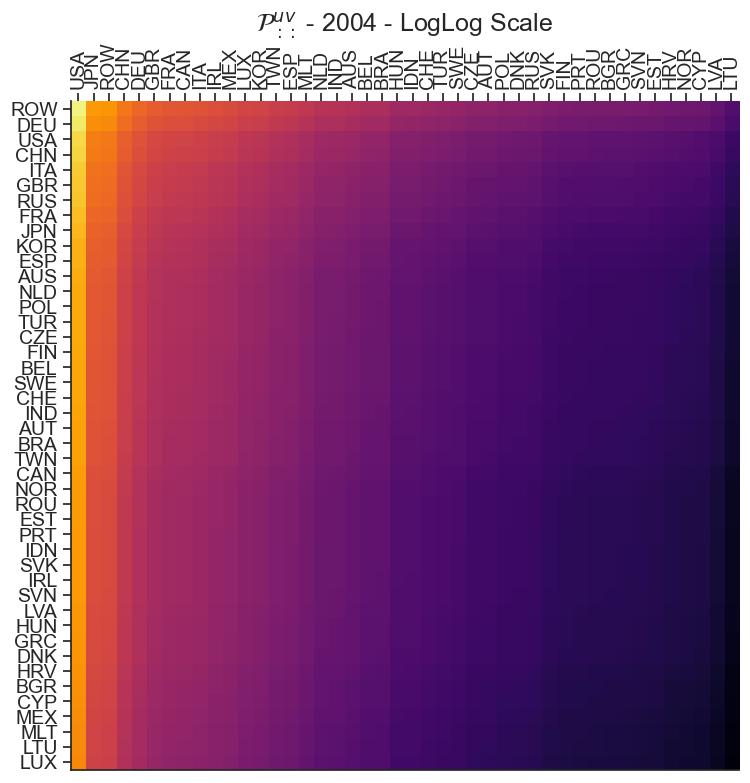

...

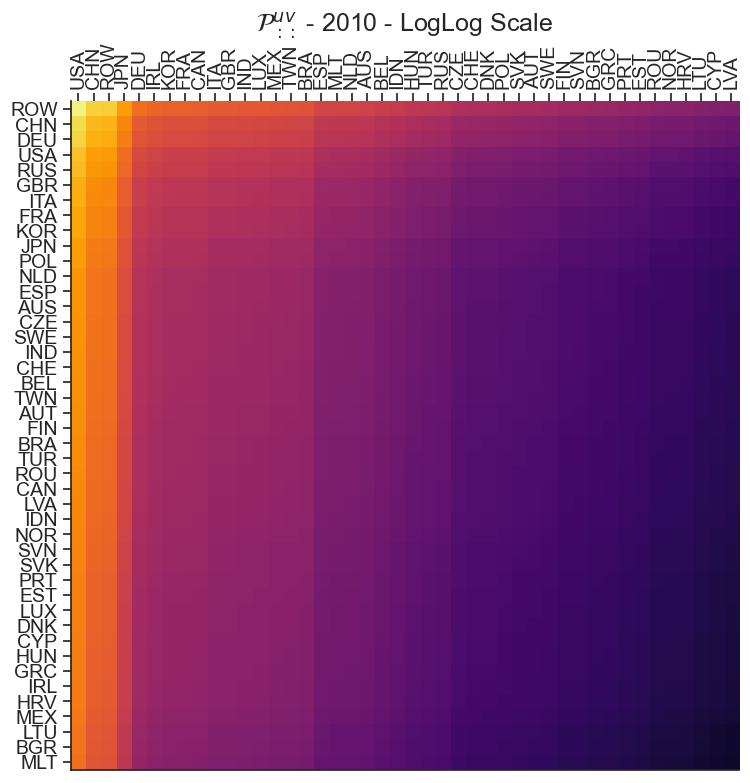

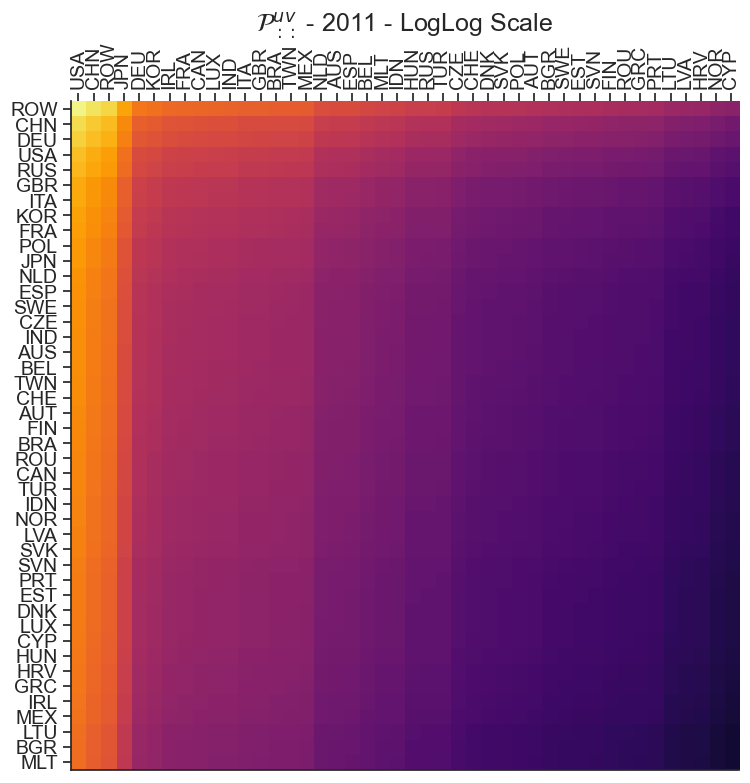

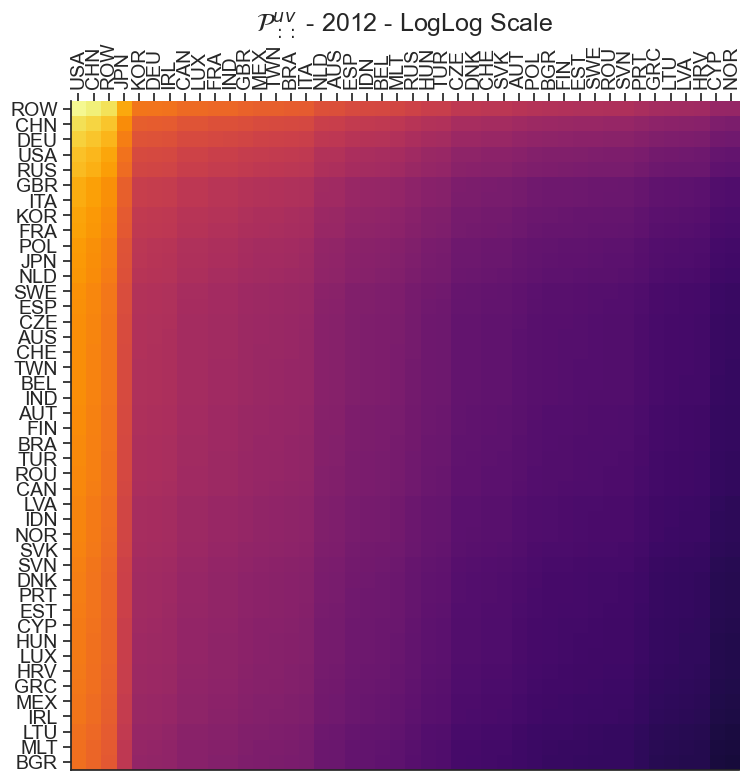

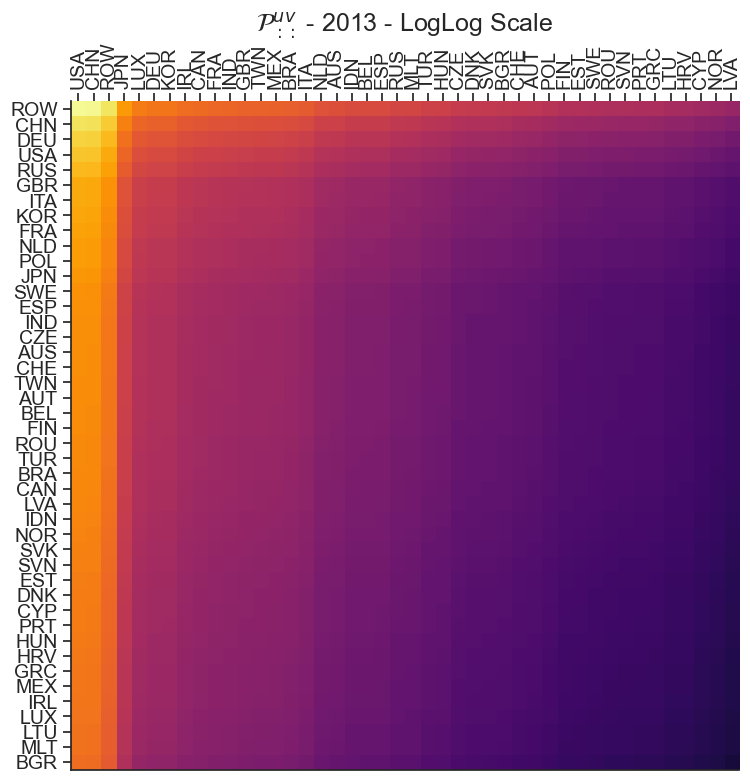

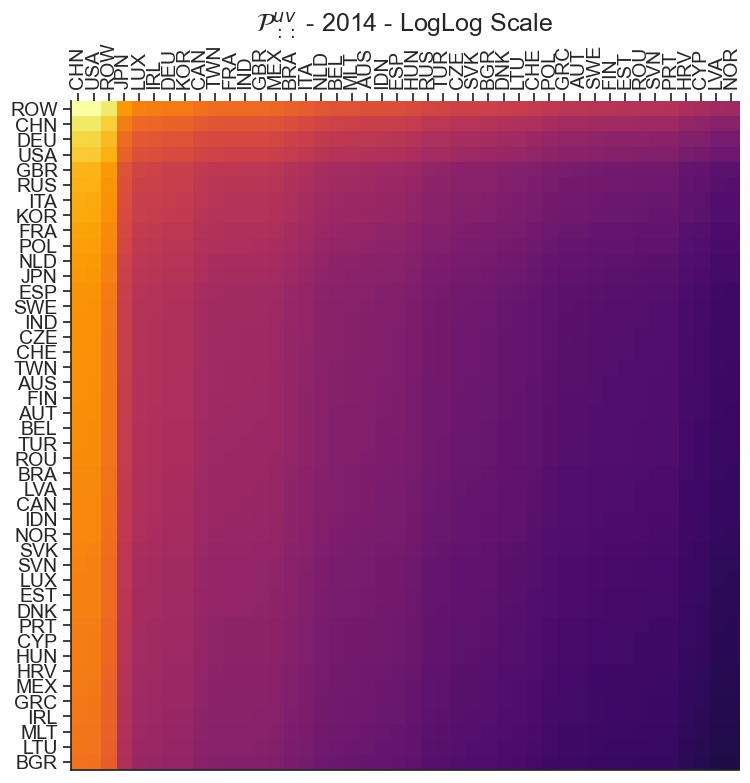

In [14]:
# Visualize the Disturbance Start Matrix Sensitivity P^{uv} for the period 2000-2014 (Sorted)
for t, year in enumerate(CIOT_data.keys()):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    data = np.log(np.log(P_uv_agg[t]+eps))
    title = r"$\mathcal{P}^{uv}_{::}$ - "+year+" - LogLog Scale"
    visualize_sorted_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

## Disturbance End Matrix Sensitivity $\mathcal{P}^{::}_{ij}$

In [15]:
P_agg_ij = np.zeros((len(CIOT_data.keys()), N_countries, N_countries))
for t, year in enumerate(CIOT_data.keys()):
    for i in range(N_countries):
        for j in range(N_countries):
            log_p_ij = np.log(CIOT_data[year].P[i*N_countries + j,:])
            P_agg_ij[t,i,j] = np.exp(np.mean(log_p_ij))

In [16]:
p_min_val, p_max_val = calculate_min_max_values(P_agg_ij)
p_min_val, p_max_val

(1.000000000039998, 1.0000003547879086)

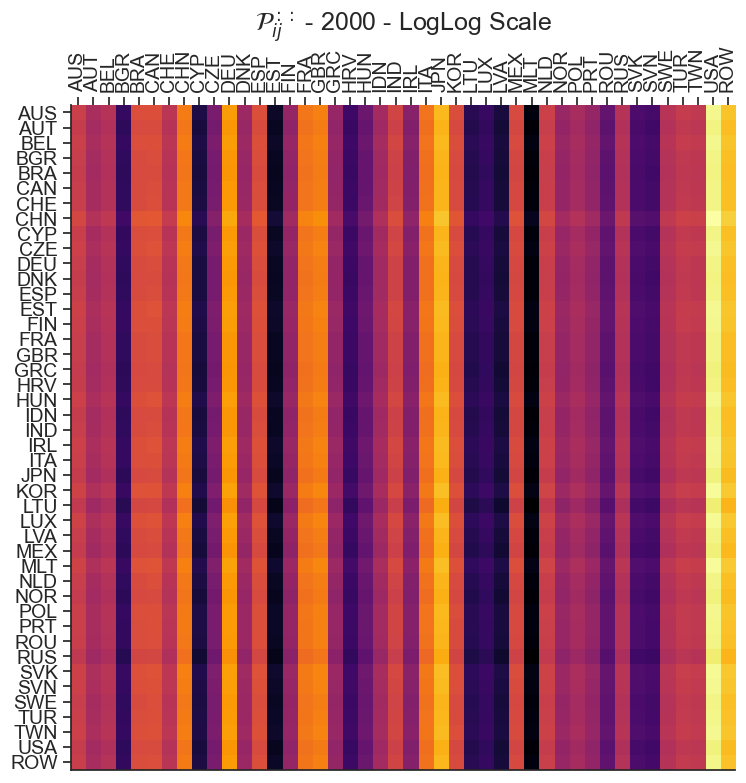

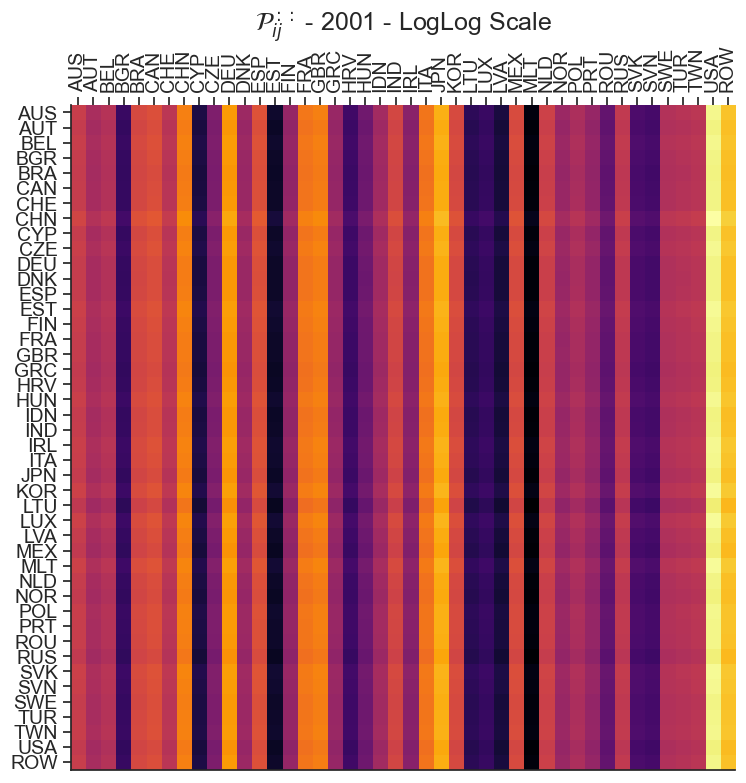

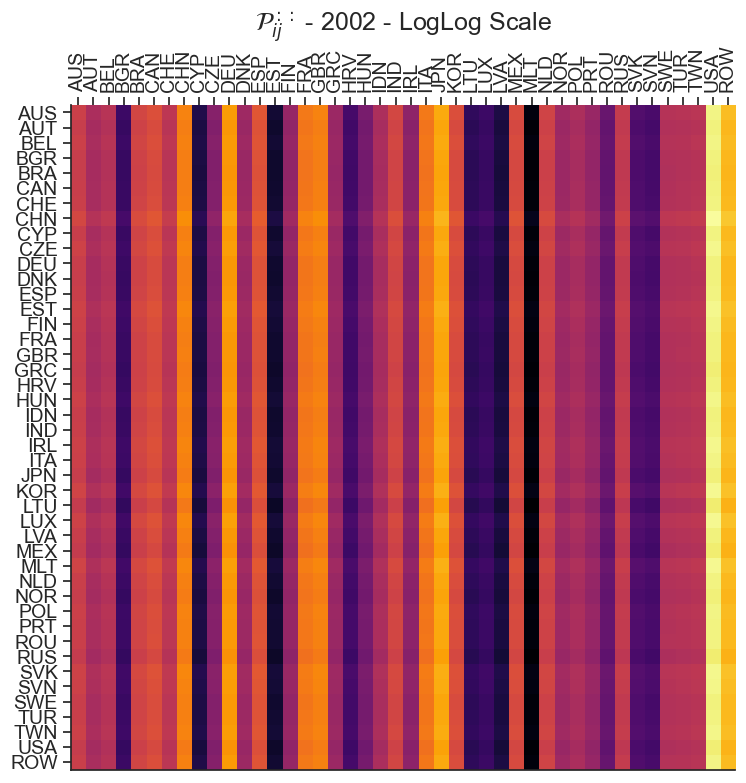

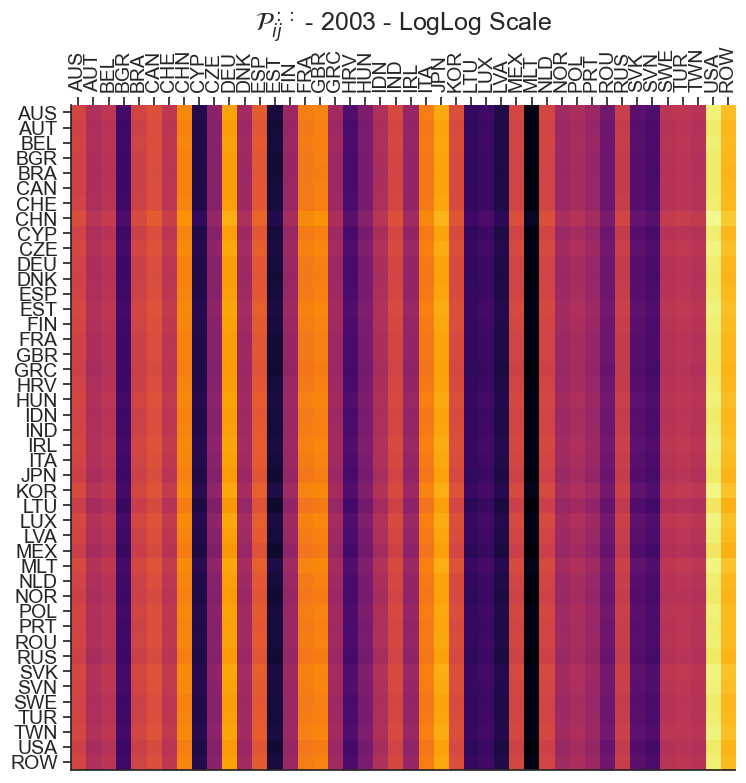

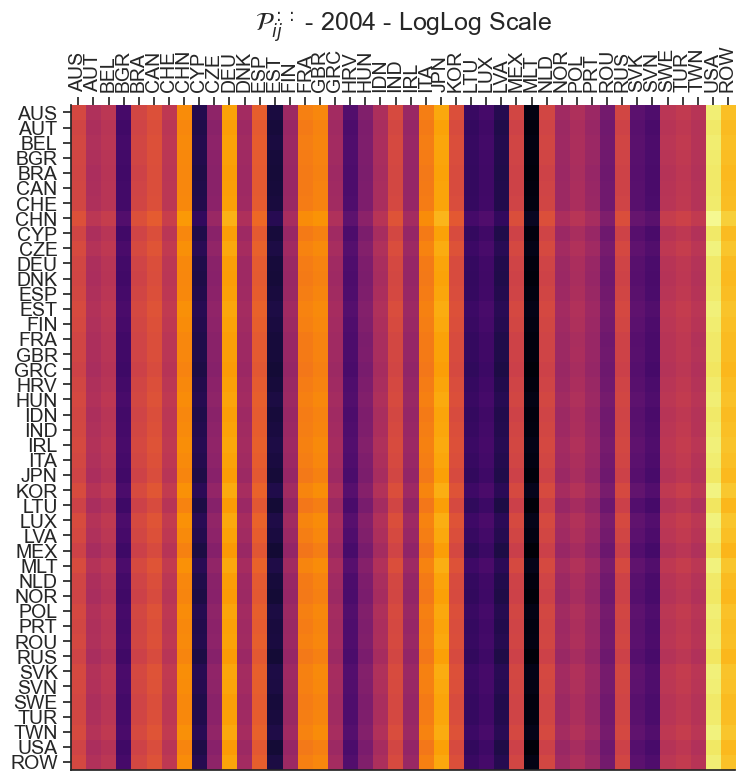

...

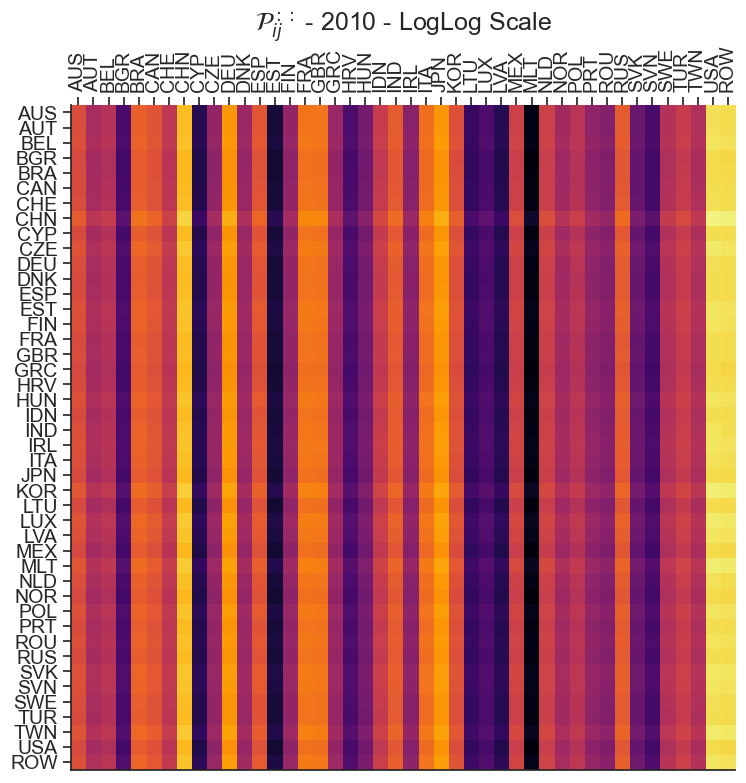

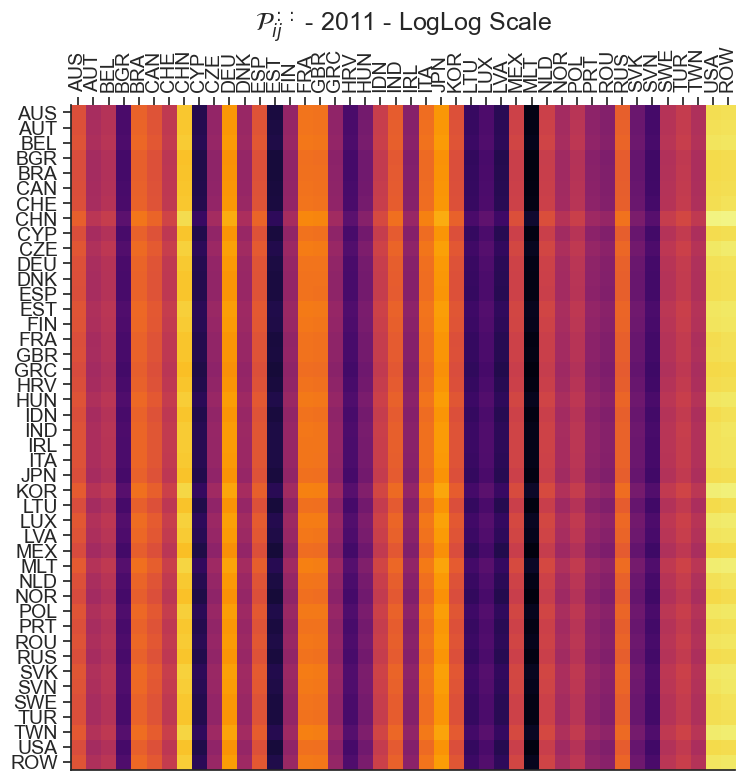

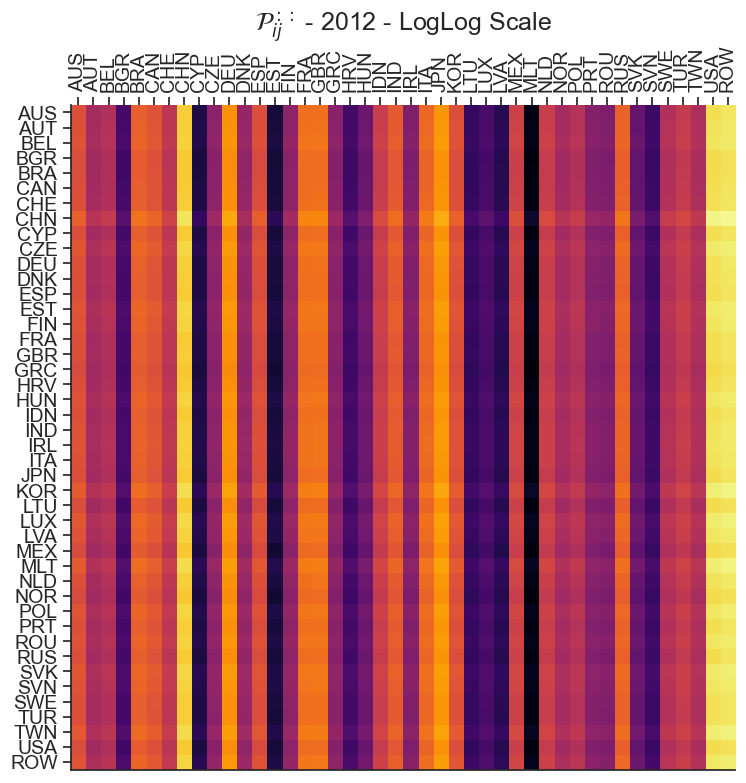

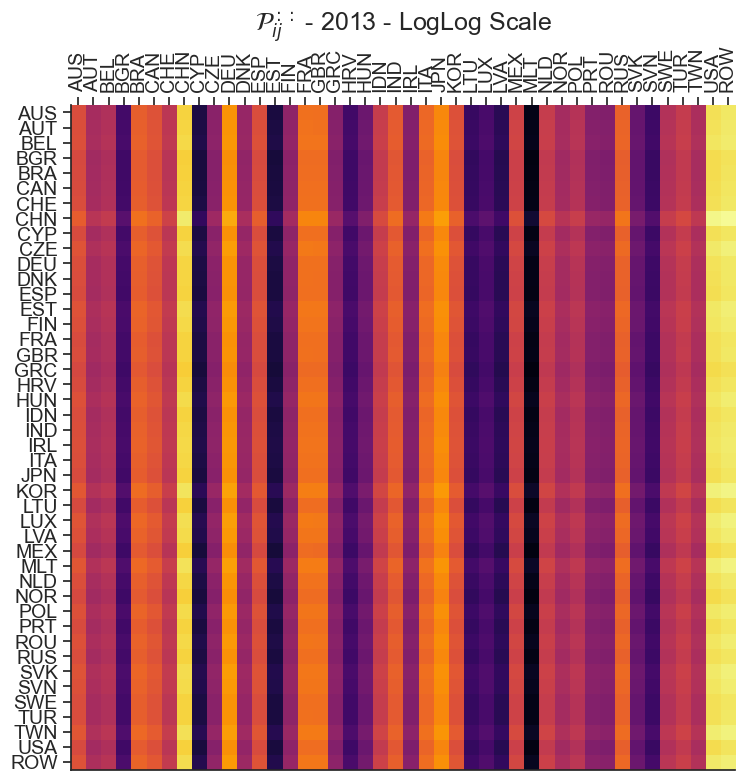

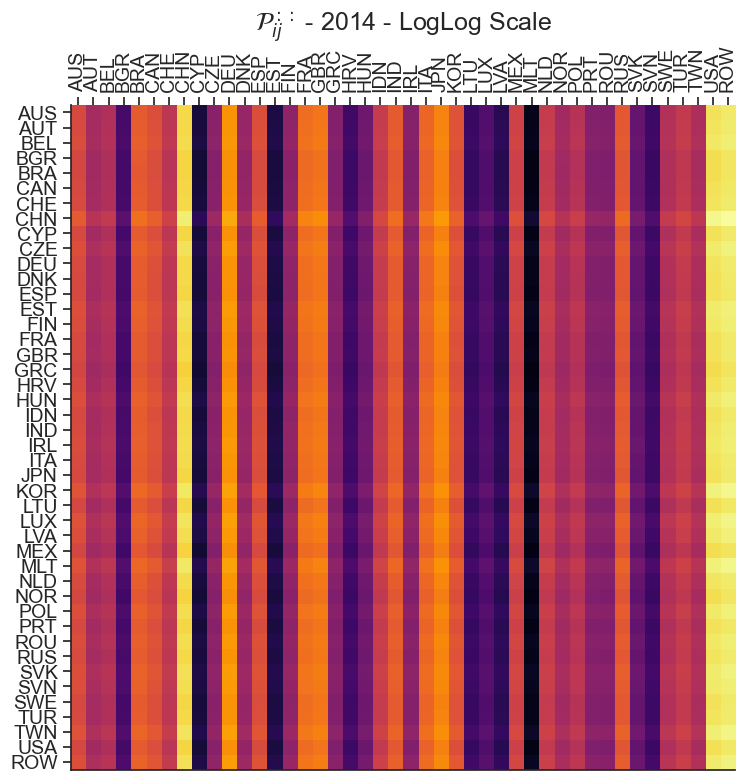

In [17]:
# Visualize the Disturbance End Matrix Sensitivity P_{ij} for the period 2000-2014
for t, year in enumerate(CIOT_data.keys()):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    data = np.log(np.log(P_agg_ij[t]+eps))
    title = r"$\mathcal{P}^{::}_{ij}$ - "+year+" - LogLog Scale"
    visualize_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

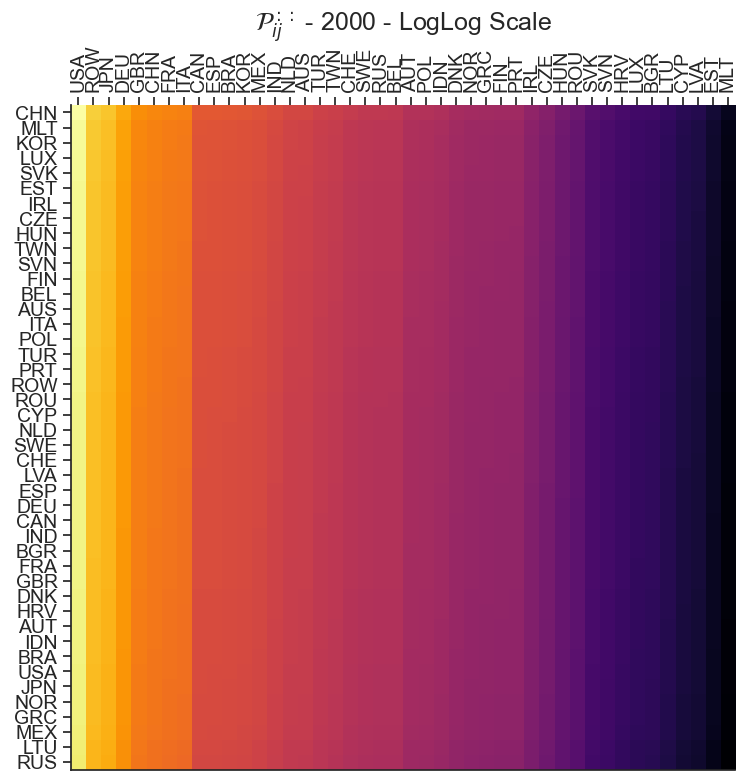

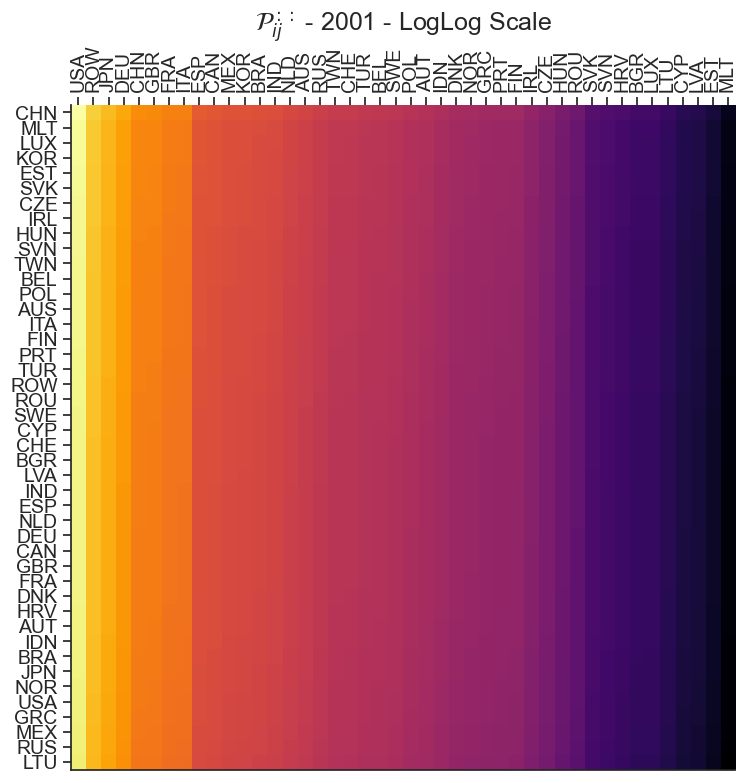

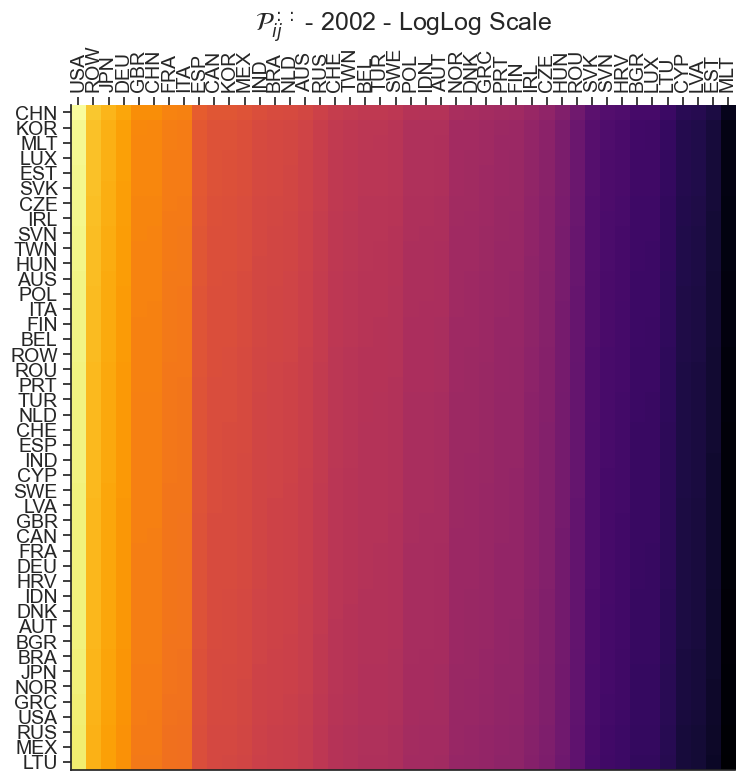

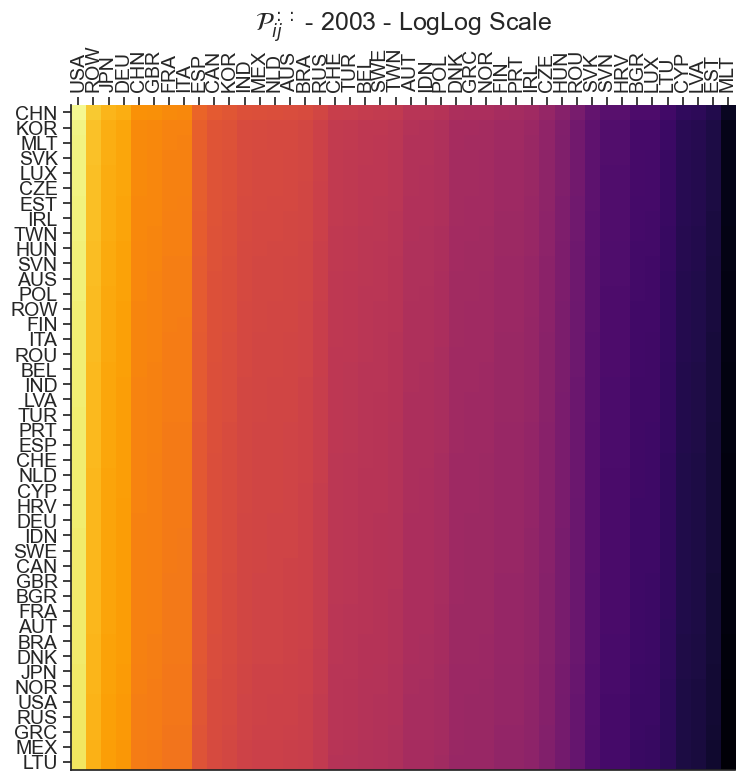

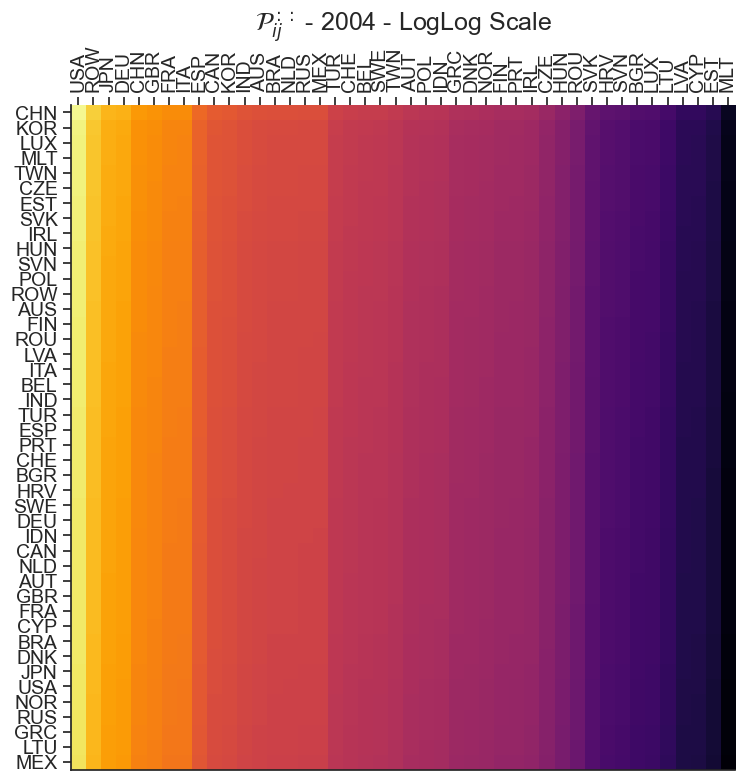

...

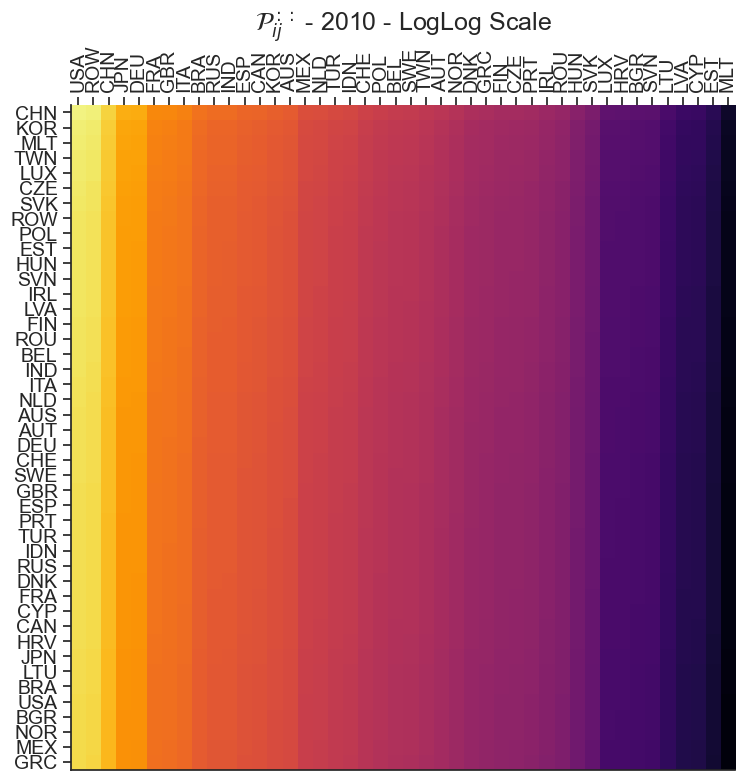

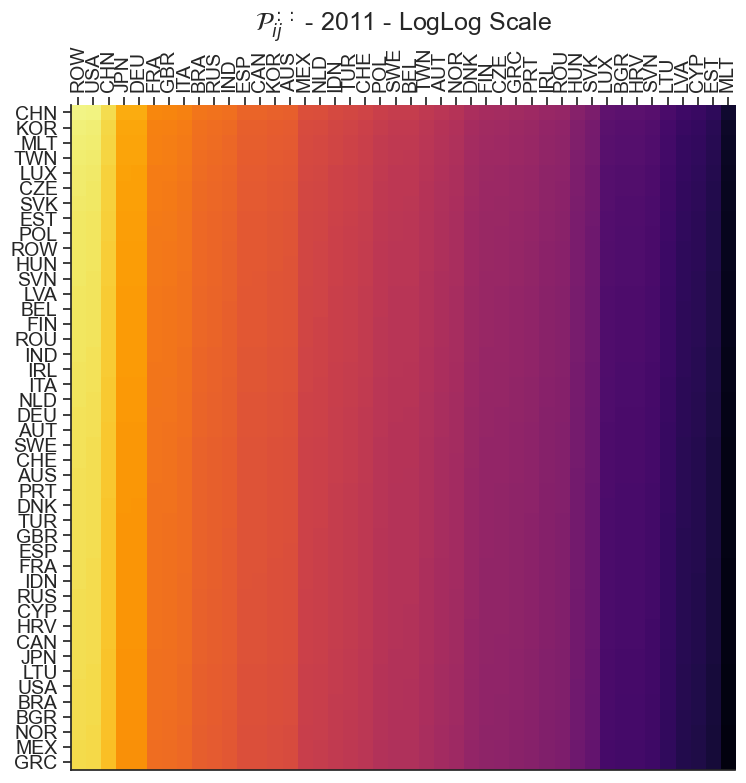

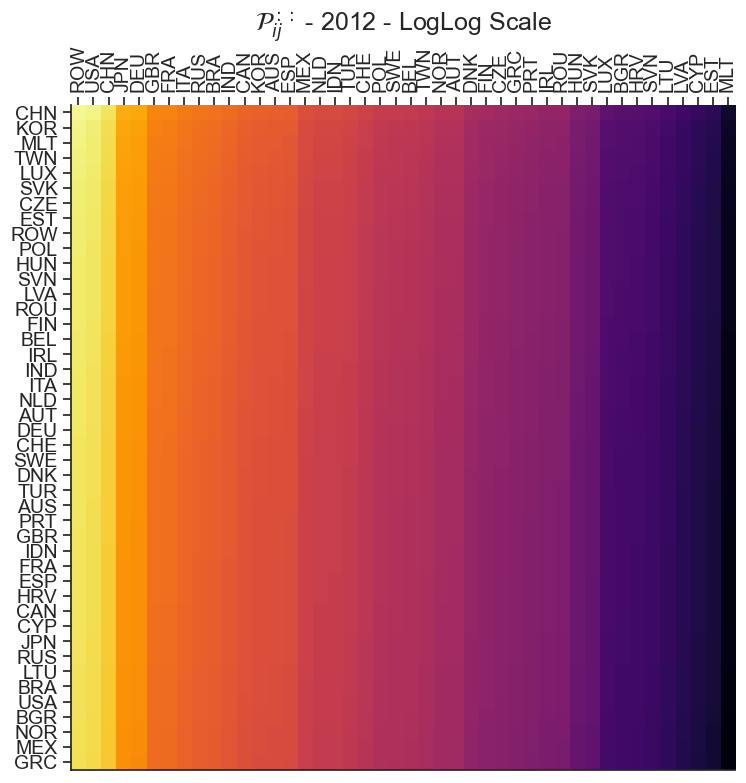

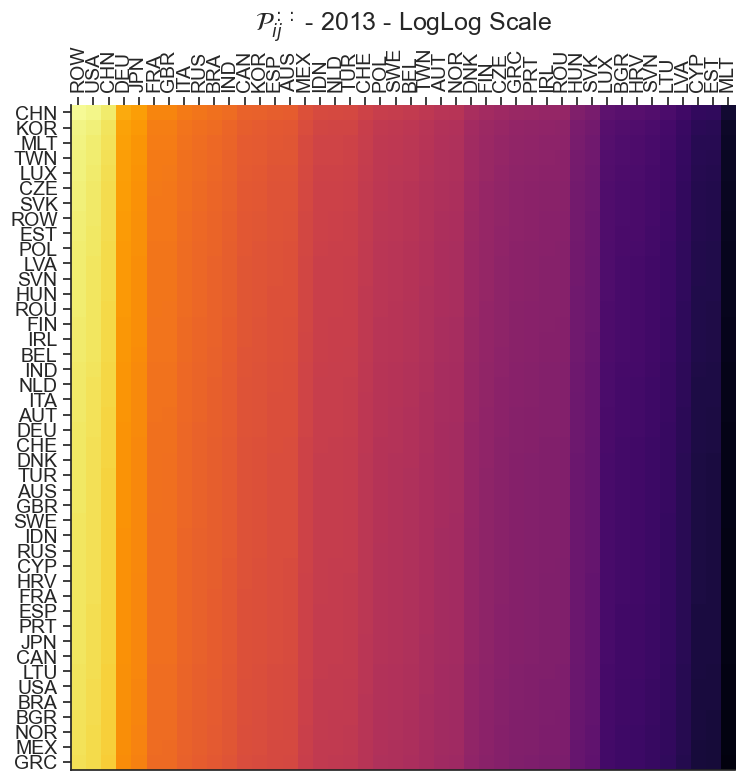

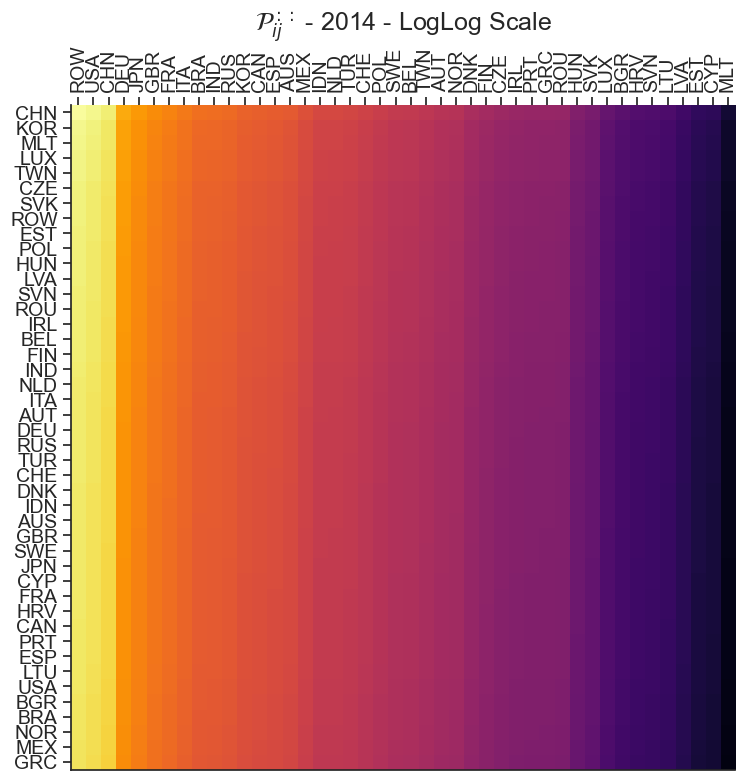

In [18]:
# Visualize the Disturbance End Matrix Sensitivity P_{ij} for the period 2000-2014 (Sorted)
for t, year in enumerate(CIOT_data.keys()):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    data = np.log(np.log(P_agg_ij[t]+eps))
    title = r"$\mathcal{P}^{::}_{ij}$ - "+year+" - LogLog Scale"
    visualize_sorted_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

## Disturbance Start Fixed Matrix Sensitivity $\mathcal{P}^{uv}_{\hat{i}\hat{i}}$

In [19]:
P_uv_ihatihat = np.zeros((2*len(countries_OI), N_countries, N_countries))

for t, year in enumerate(["2000", "2014"]):
    for ii, i in enumerate(countries_OI):
        P_uv_ihatihat[t*len(countries_OI)+ii] = CIOT_data[year].P[i*44+i,:].reshape((N_countries, N_countries))

In [20]:
p_min_val, p_max_val = calculate_min_max_values(P_uv_ihatihat)
p_min_val, p_max_val

(1.0000000000000204, 1.0002387535494537)

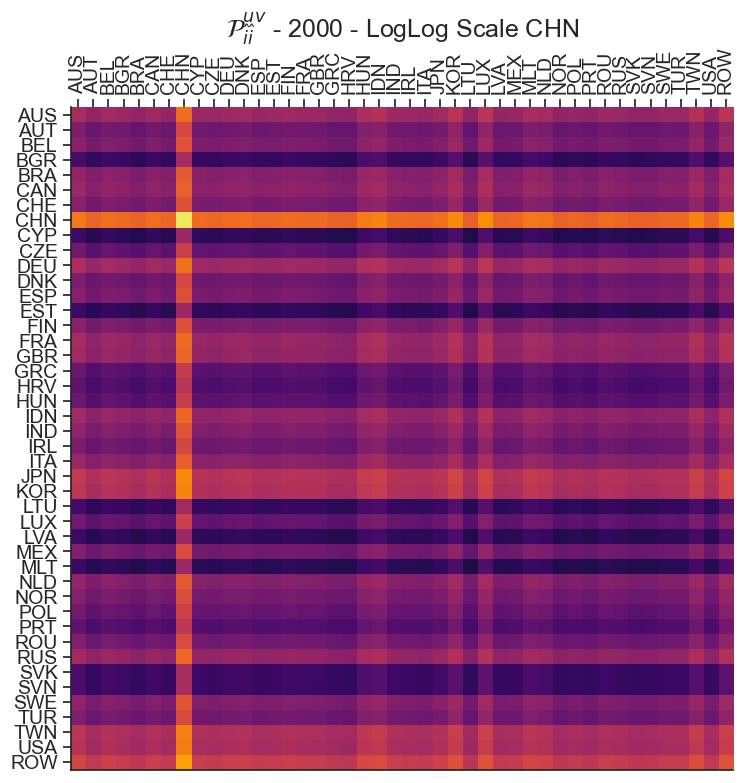

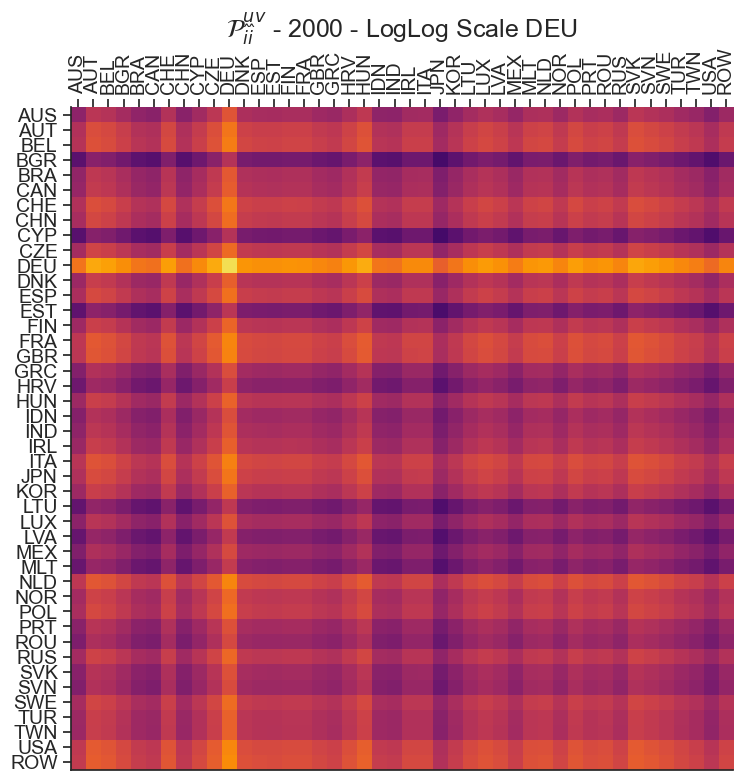

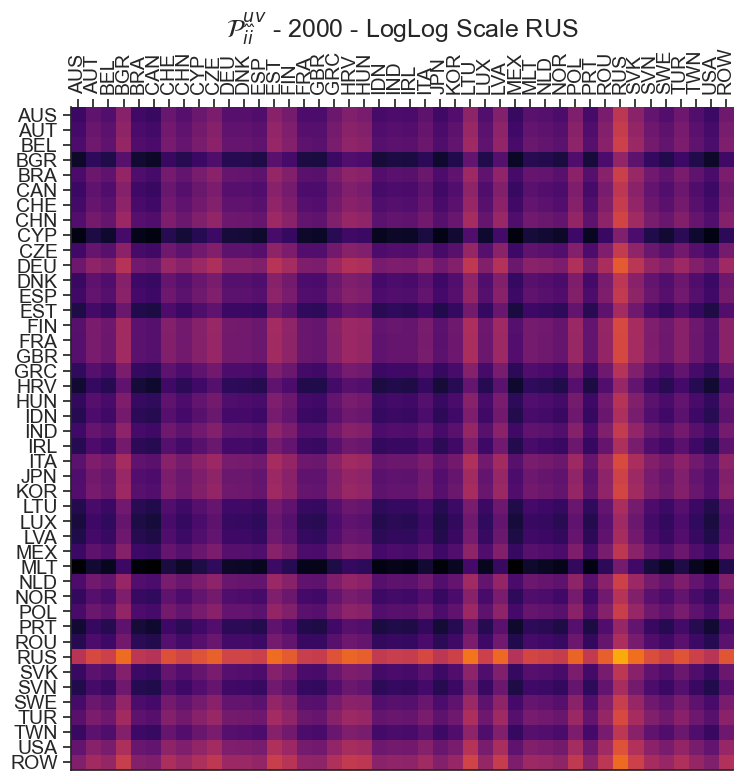

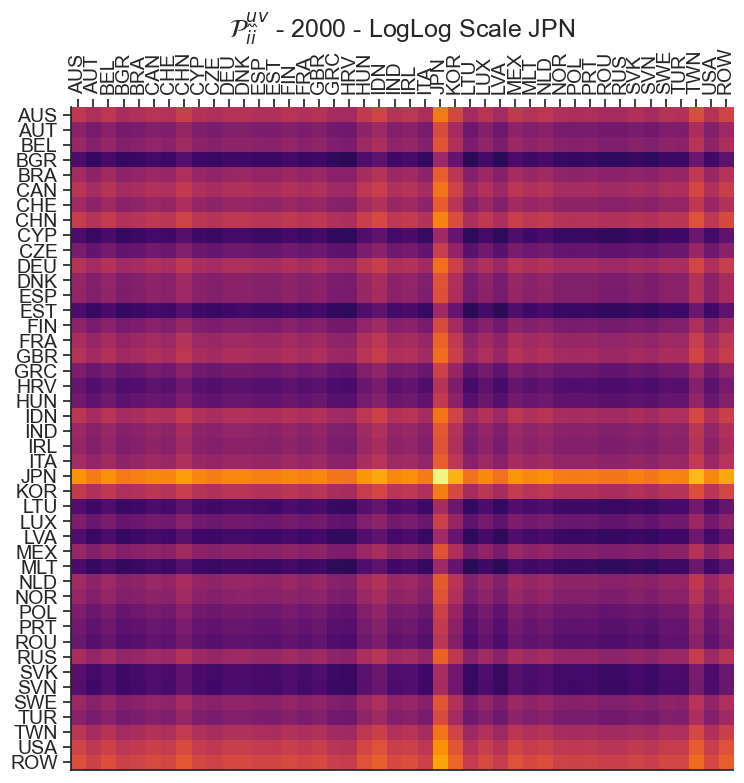

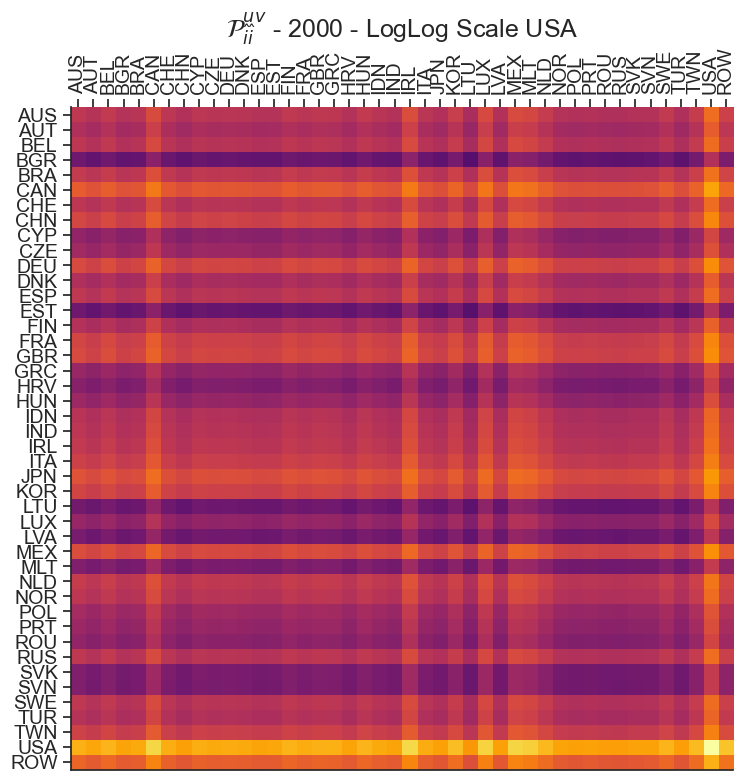

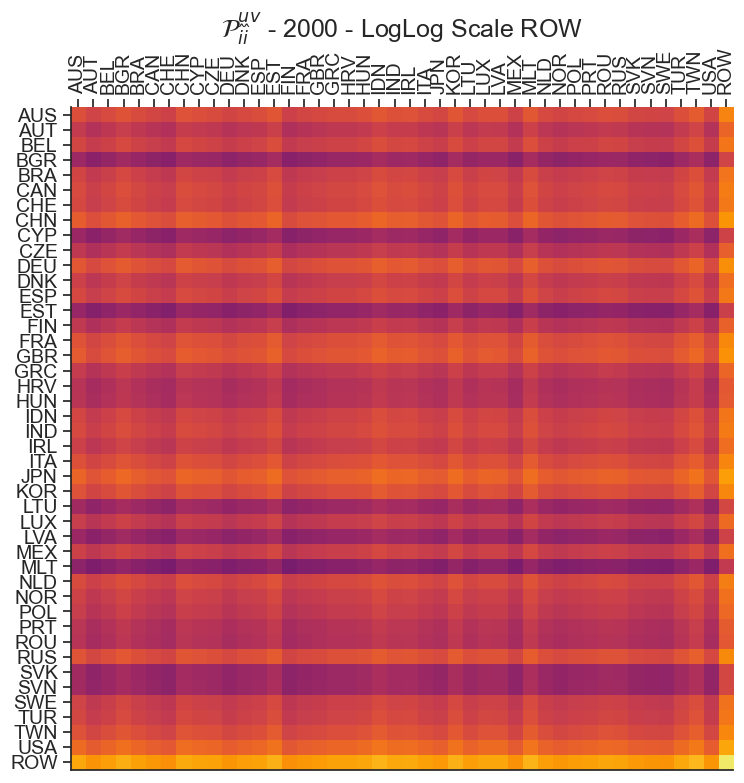

In [21]:
# Visualize the Disturbance Start Fixed Matrix Sensitivity P^{uv}_{iHat iHat} for the year 2000 
# for the countries China, Germany, Russia, Japan, USA, Rest Of World
for ii, i in enumerate(countries_OI):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    year = "2000"
    t = 0
    title = r"$\mathcal{P}^{uv}_{\hat{i}\hat{i}}$ - "+year+" - LogLog Scale " + countries[i]
    data = np.log(np.log(P_uv_ihatihat[t*len(countries_OI)+ii] + eps))
    visualize_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

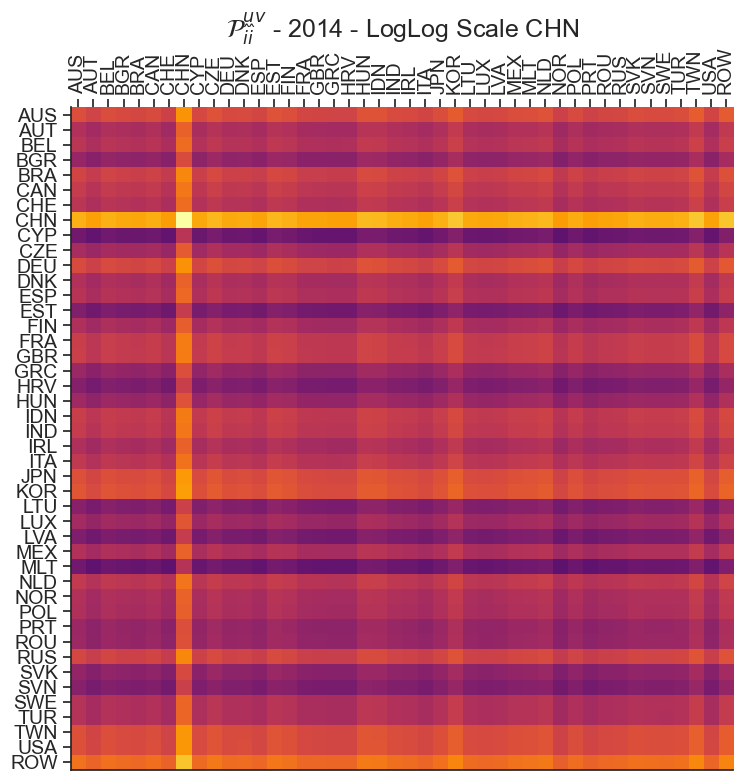

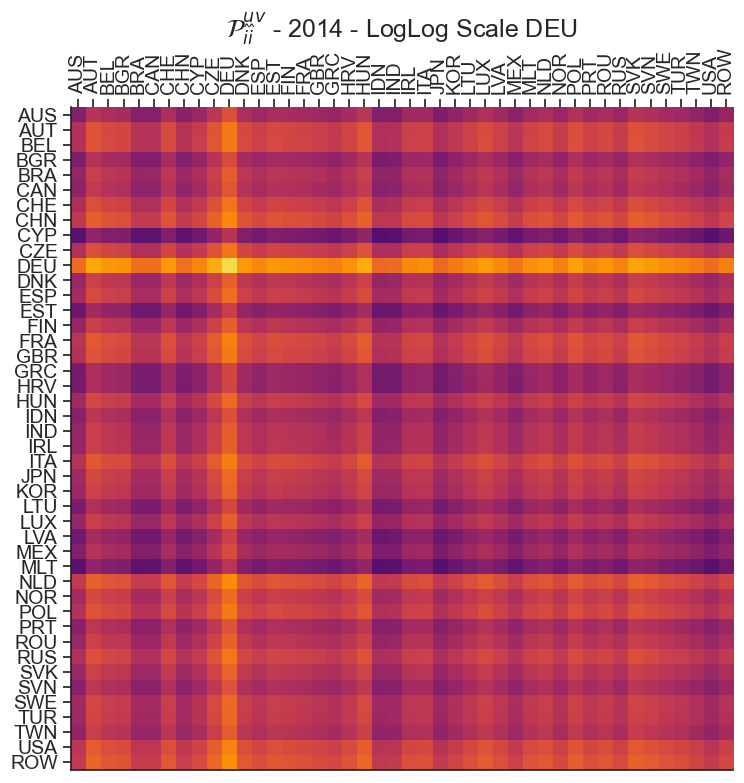

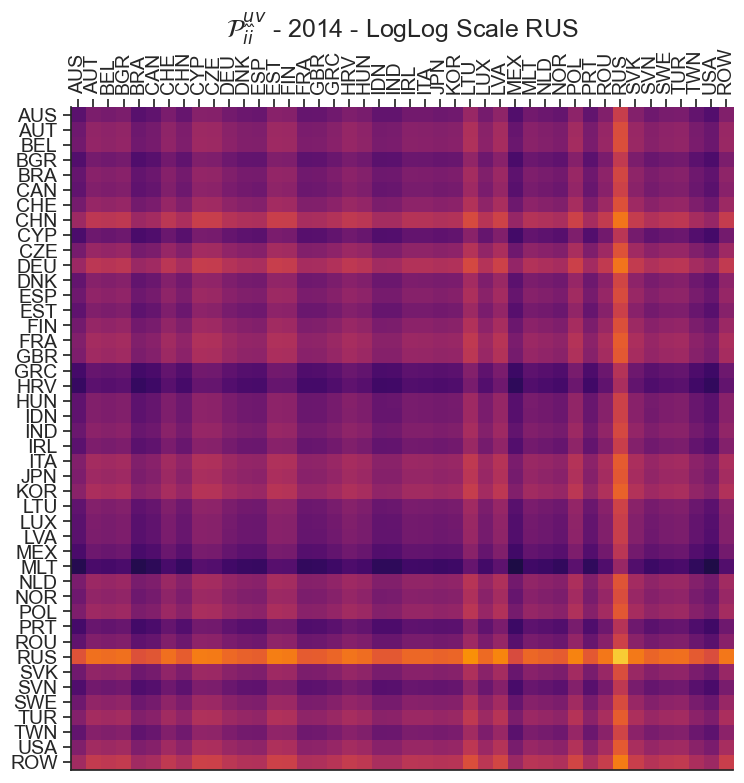

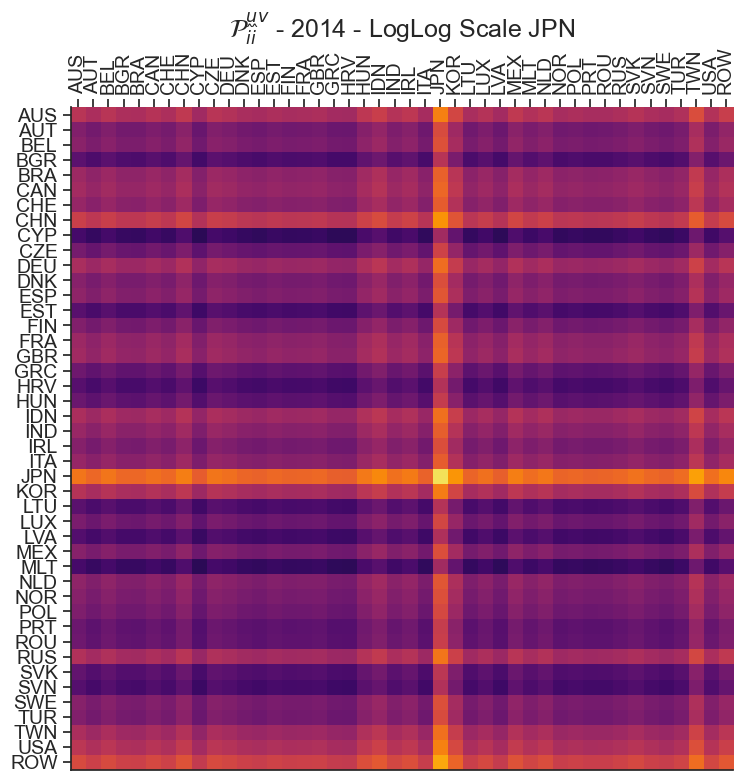

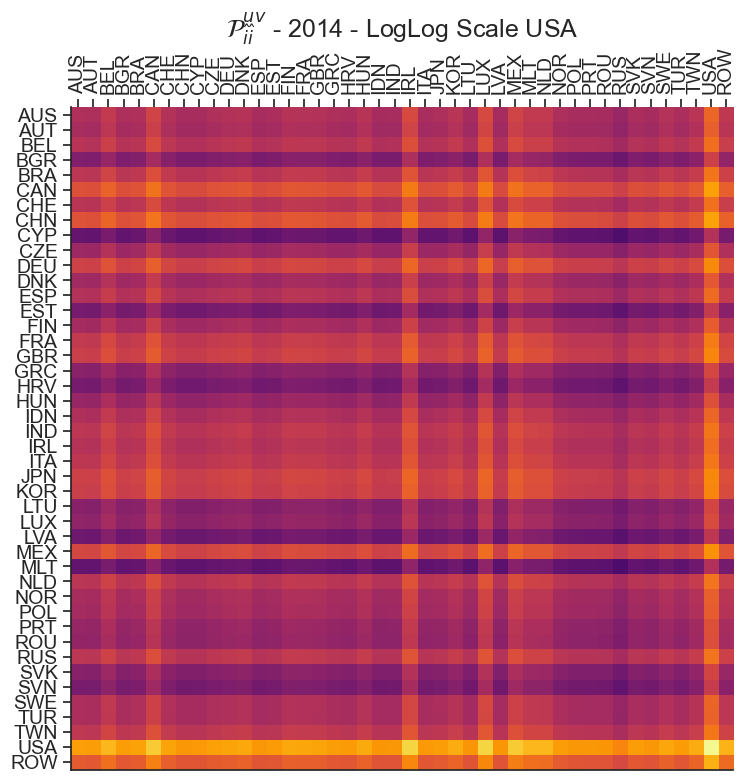

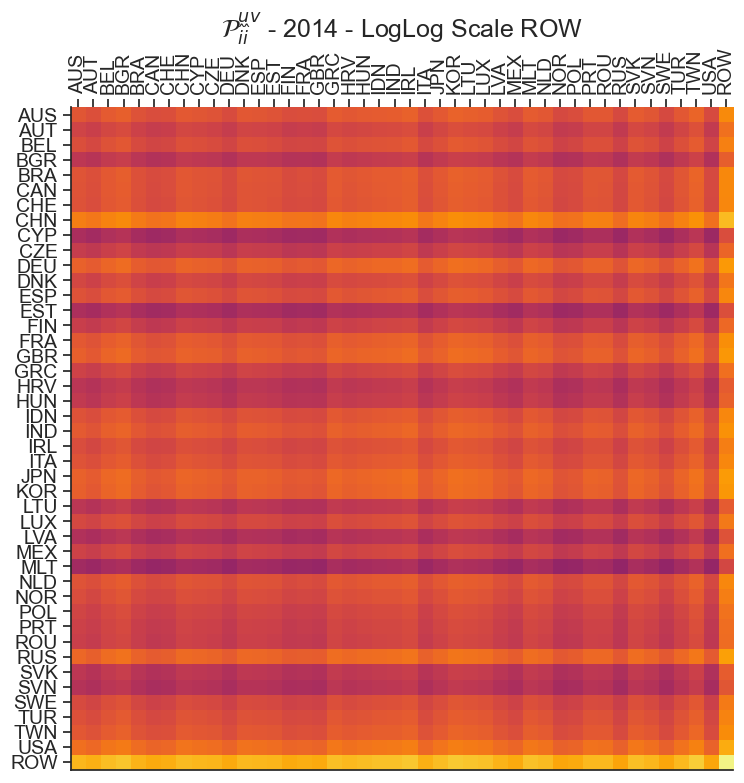

In [22]:
# Visualize the Disturbance Start Fixed Matrix Sensitivity P^{uv}_{iHat iHat} for the year 2014 
# for the countries China, Germany, Russia, Japan, USA, Rest Of World
for ii, i in enumerate(countries_OI):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    year = "2014"
    t = 1
    title = r"$\mathcal{P}^{uv}_{\hat{i}\hat{i}}$ - "+year+" - LogLog Scale " + countries[i]
    data = np.log(np.log(P_uv_ihatihat[t*len(countries_OI)+ii] + eps))
    visualize_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

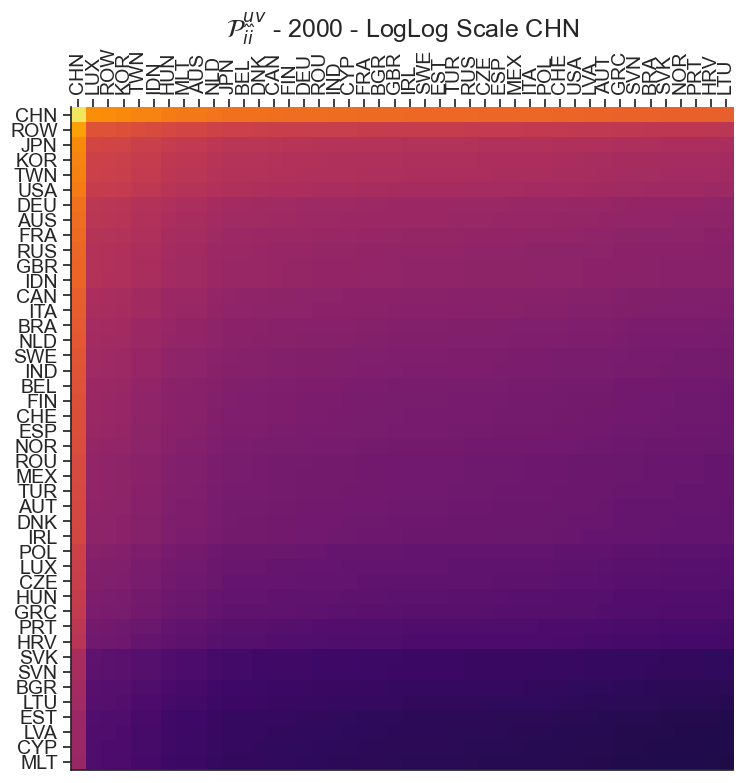

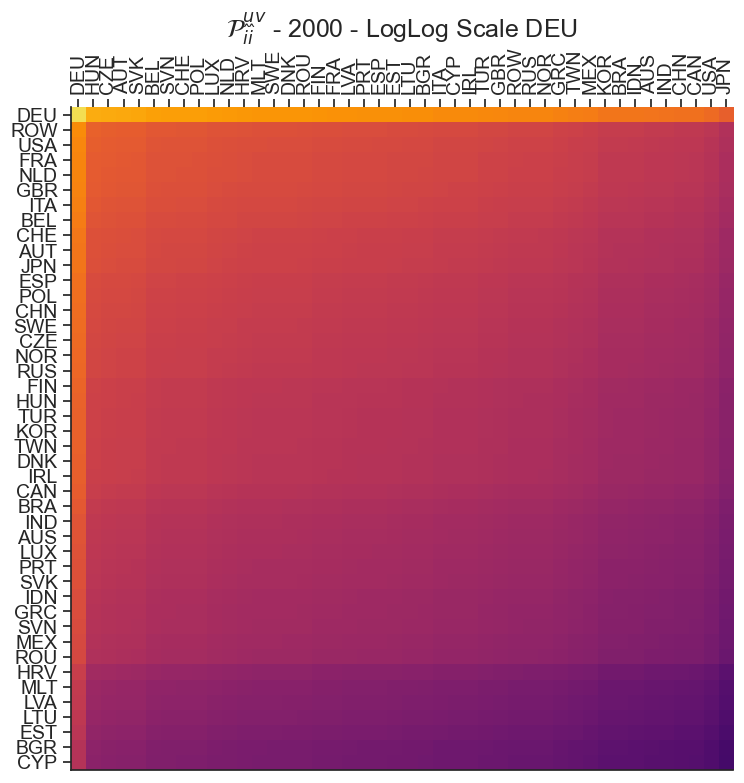

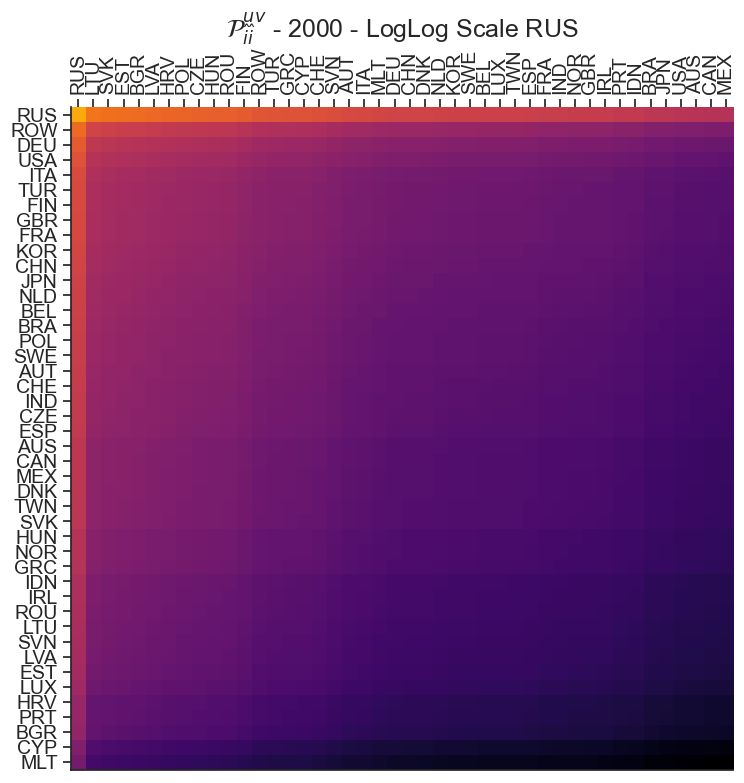

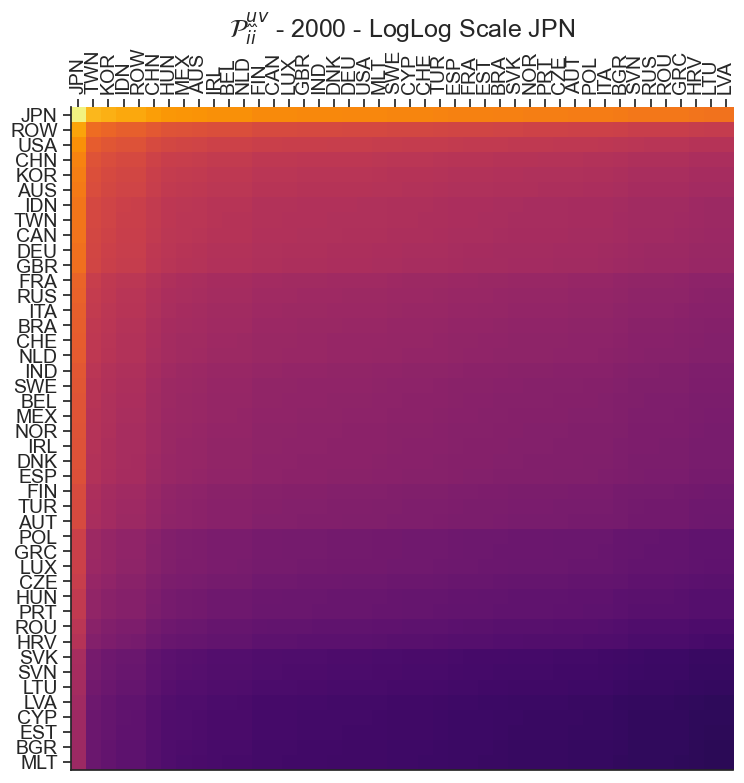

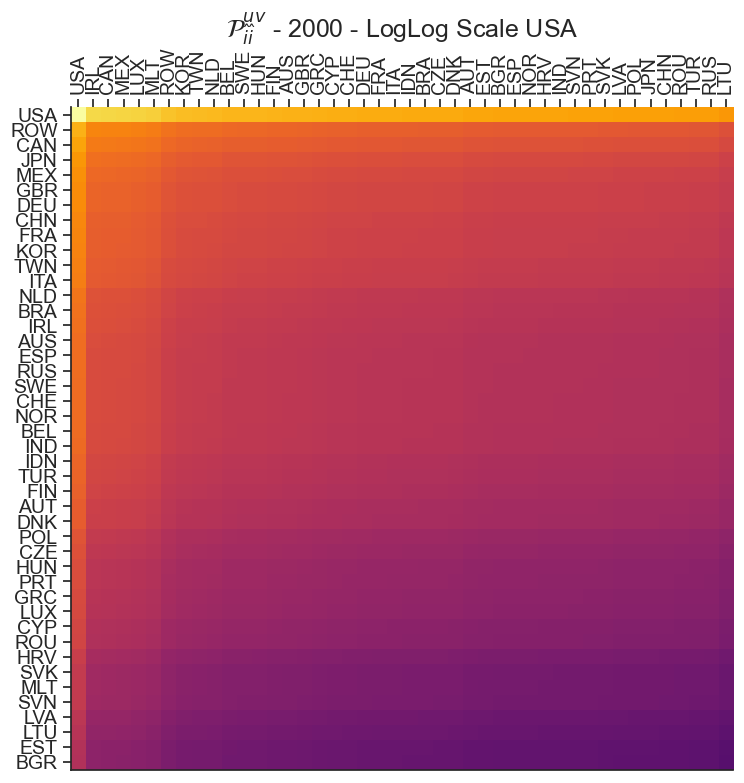

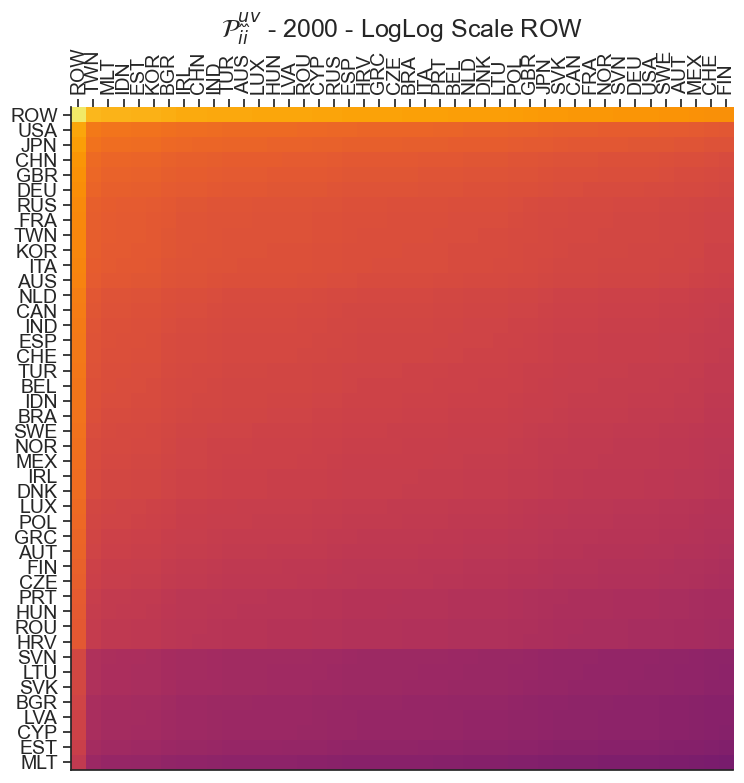

In [23]:
# Visualize the Disturbance Start Fixed Matrix Sensitivity P^{uv}_{iHat iHat} for the year 2000 
# for the countries China, Germany, Russia, Japan, USA, Rest Of World (Sorted)
for ii, i in enumerate(countries_OI):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    year = "2000"
    t = 0
    title = r"$\mathcal{P}^{uv}_{\hat{i}\hat{i}}$ - "+year+" - LogLog Scale " + countries[i]
    data = np.log(np.log(P_uv_ihatihat[t*len(countries_OI)+ii] + eps))
    visualize_sorted_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

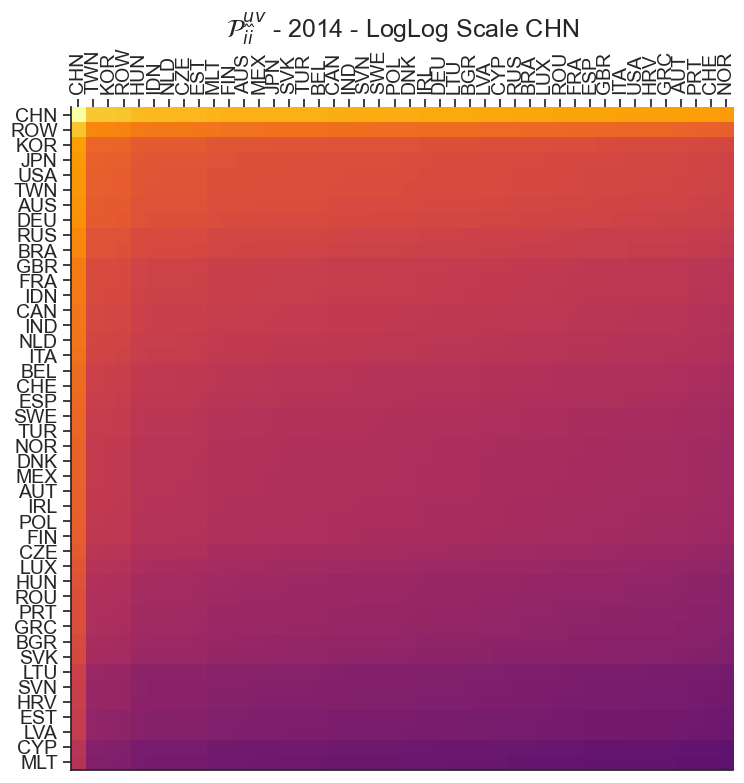

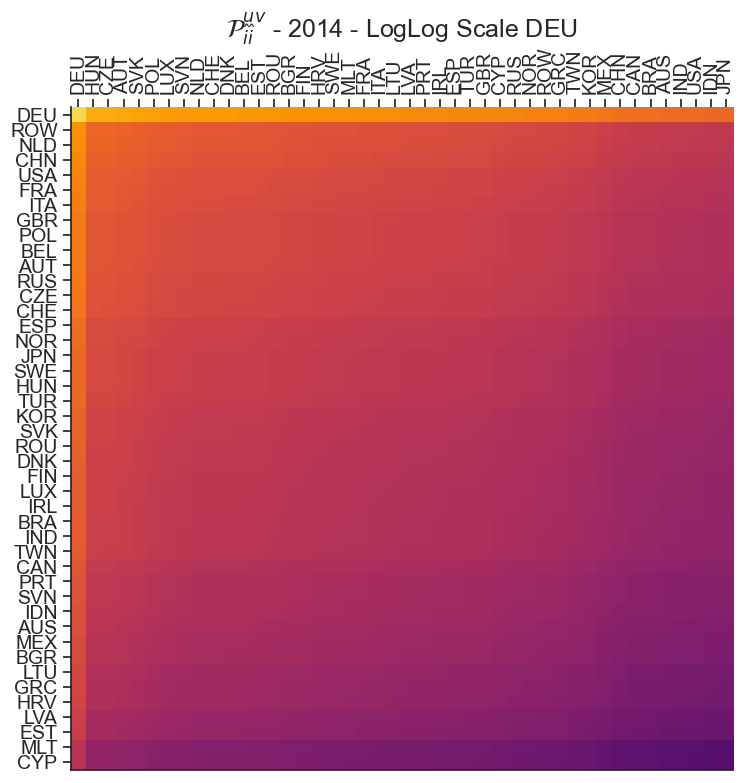

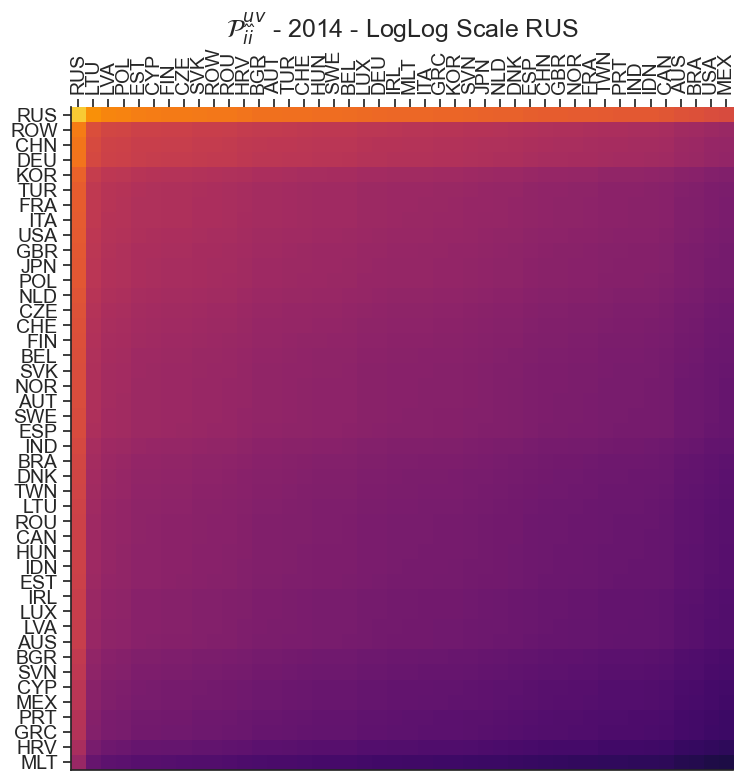

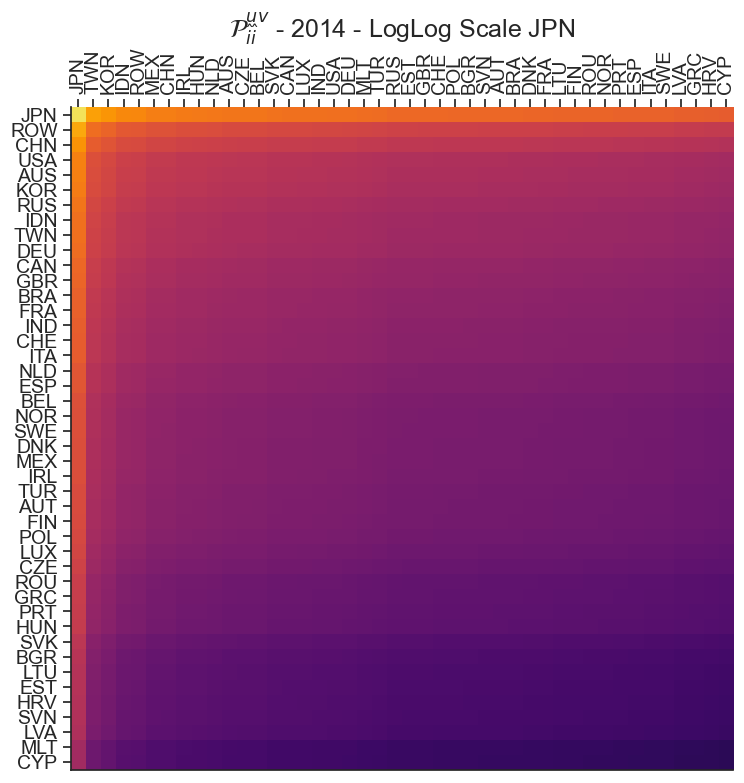

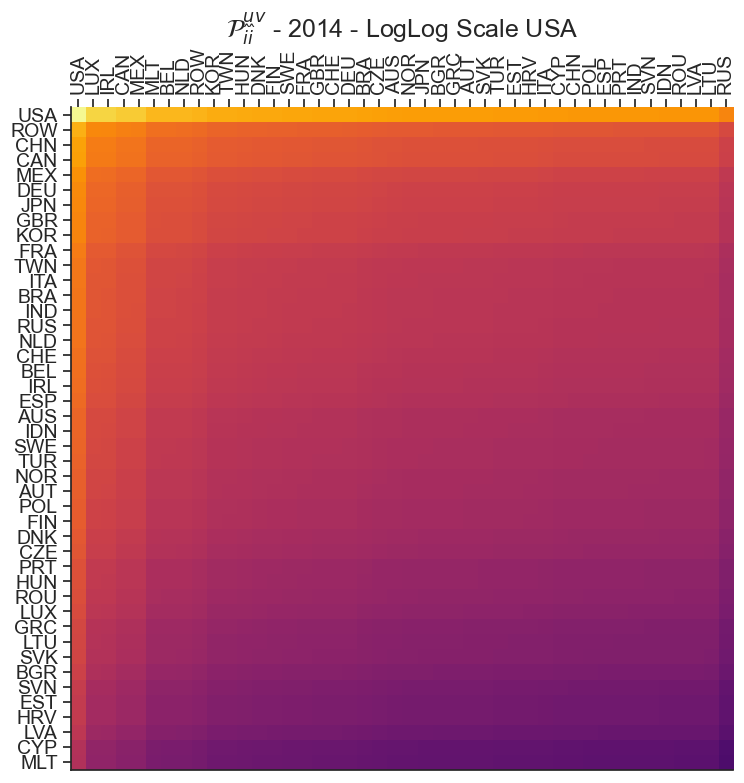

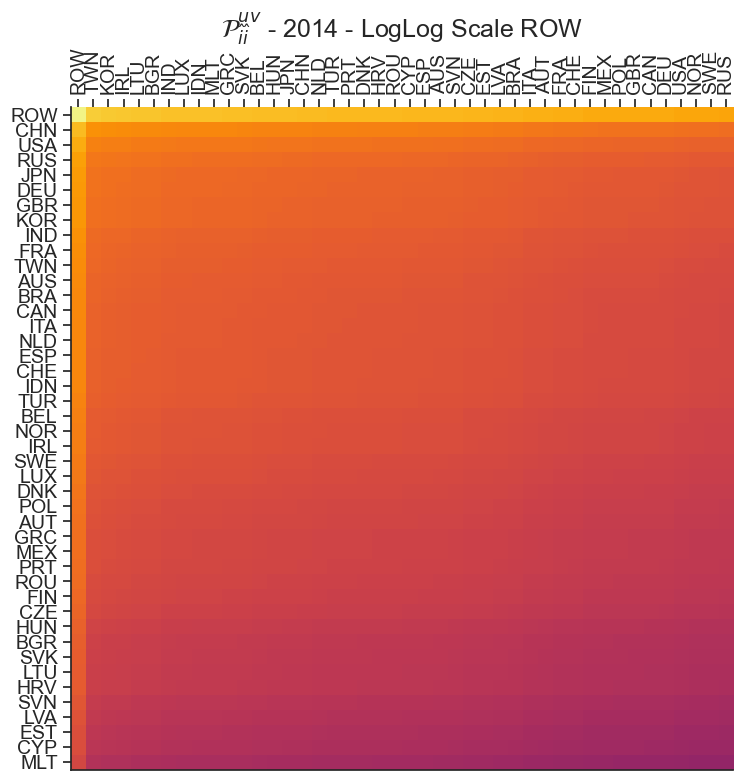

In [24]:
# Visualize the Disturbance Start Fixed Matrix Sensitivity P^{uv}_{iHat iHat} for the year 2014 
# for the countries China, Germany, Russia, Japan, USA, Rest Of World (Sorted)
for ii, i in enumerate(countries_OI):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    year = "2014"
    t = 1
    title = r"$\mathcal{P}^{uv}_{\hat{i}\hat{i}}$ - "+year+" - LogLog Scale " + countries[i]
    data = np.log(np.log(P_uv_ihatihat[t*len(countries_OI)+ii] + eps))
    visualize_sorted_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

## Disturbance End Fixed Matrix Sensitivity $\mathcal{P}^{\hat{u}\hat{v}}_{ij}$

In [25]:
P_uhatuhat_ij = np.zeros((2*len(countries_OI), N_countries, N_countries))
for t, year in enumerate(["2000", "2014"]):
    for ii, u in enumerate(countries_OI):
        P_uhatuhat_ij[t*len(countries_OI)+ii] = CIOT_data[year].P[:,u*44+u].reshape((N_countries, N_countries))

In [26]:
p_min_val, p_max_val = calculate_min_max_values(P_uhatuhat_ij)
p_min_val, p_max_val

(1.0000000000000007, 1.0002387535494537)

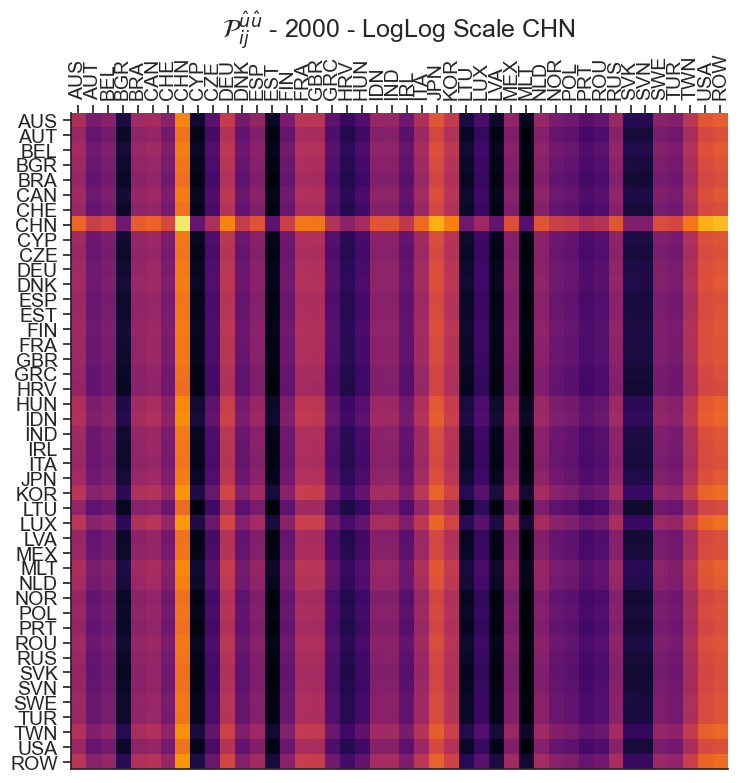

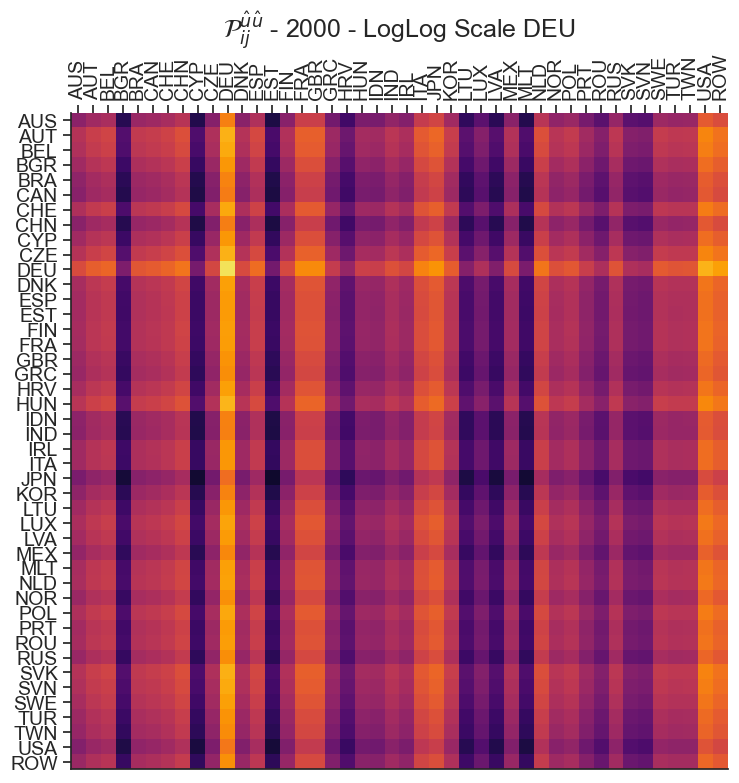

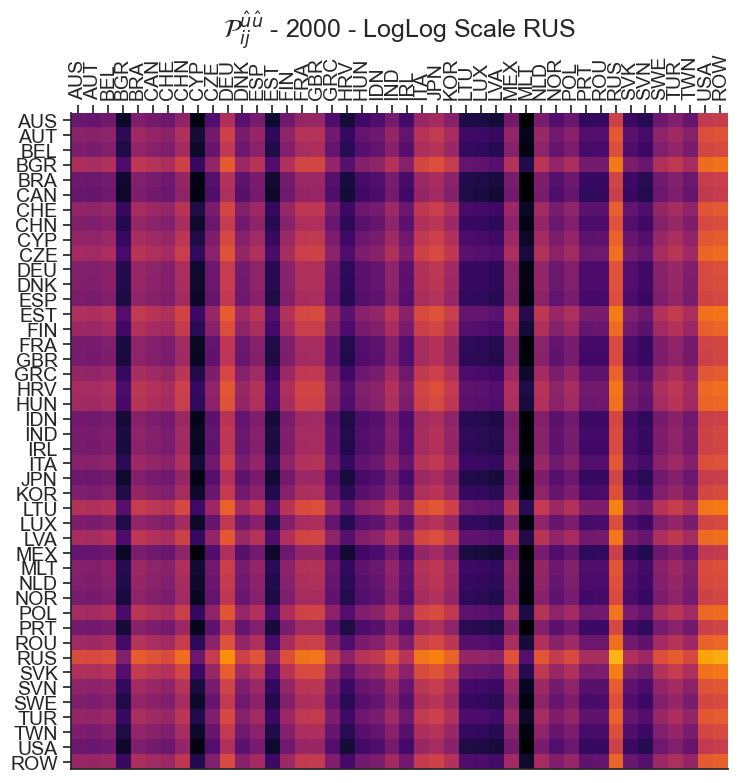

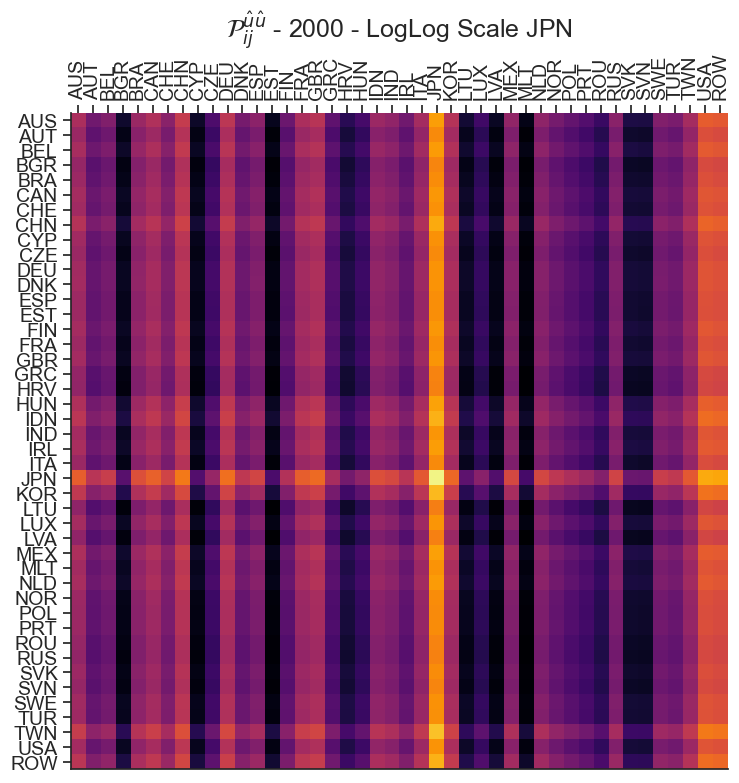

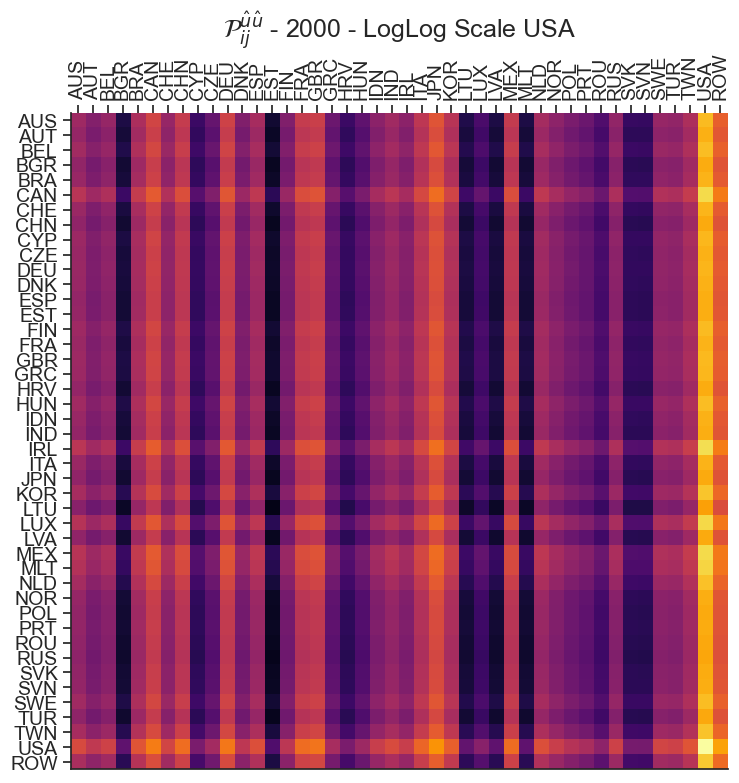

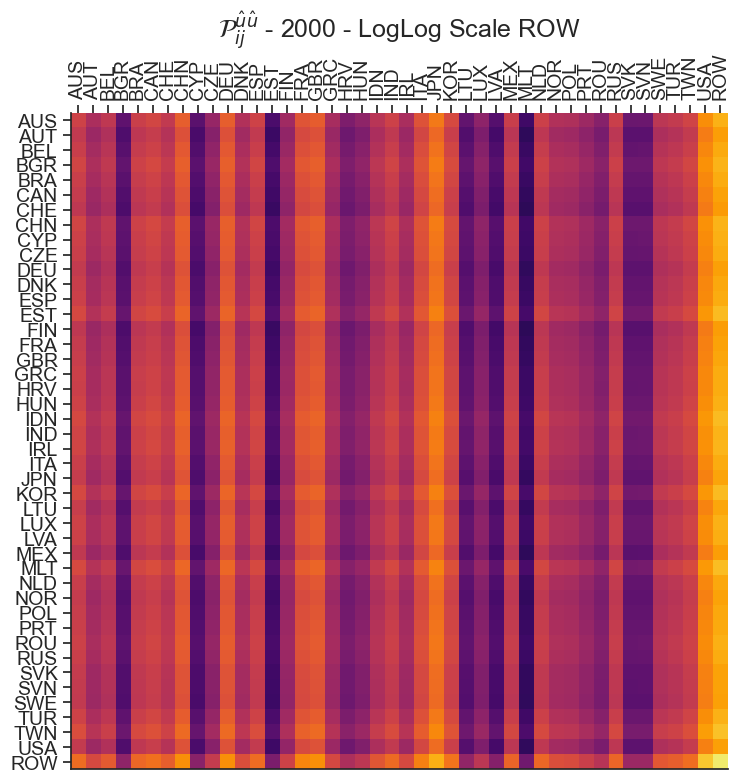

In [27]:
# Visualize the Disturbance End Fixed Matrix Sensitivity P^{uHat uHat}_{ij} for the year 2000 
# for the countries China, Germany, Russia, Japan, USA, Rest Of World
for ii, i in enumerate(countries_OI):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    year = "2000"
    t = 0
    title = r"$\mathcal{P}^{\hat{u}\hat{u}}_{ij}$ - "+year+" - LogLog Scale " + countries[i]
    data = np.log(np.log(P_uhatuhat_ij[t*len(countries_OI)+ii] + eps))    
    visualize_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

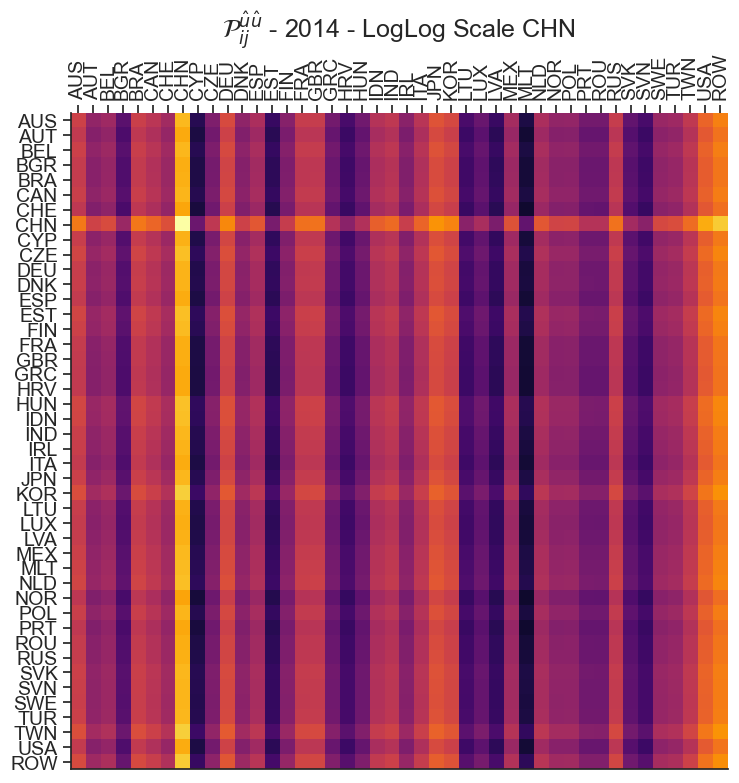

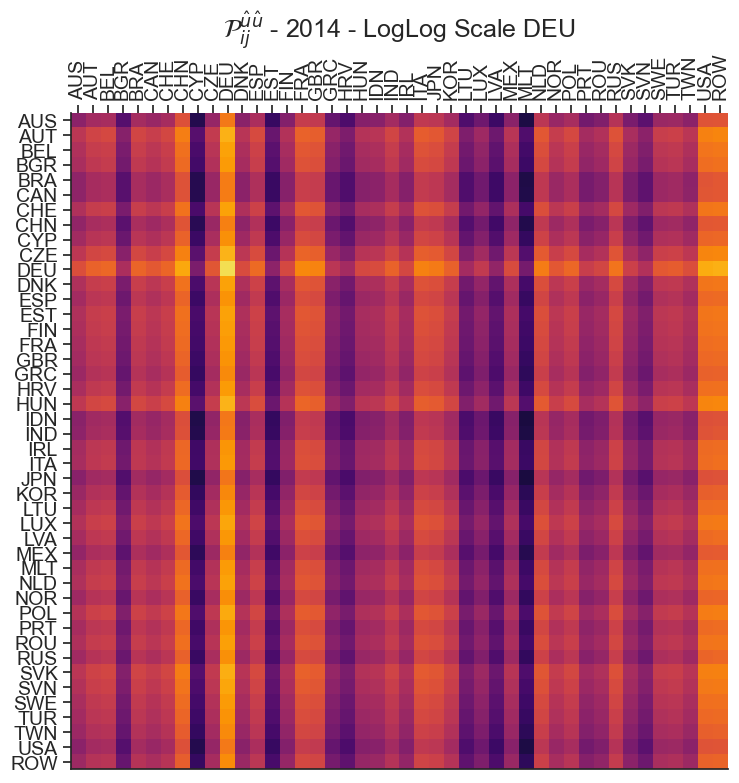

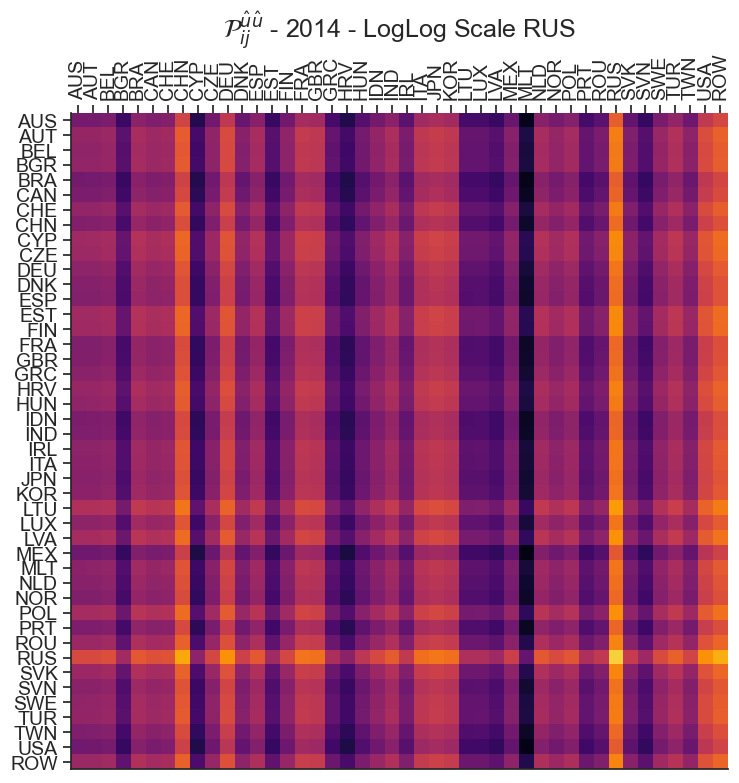

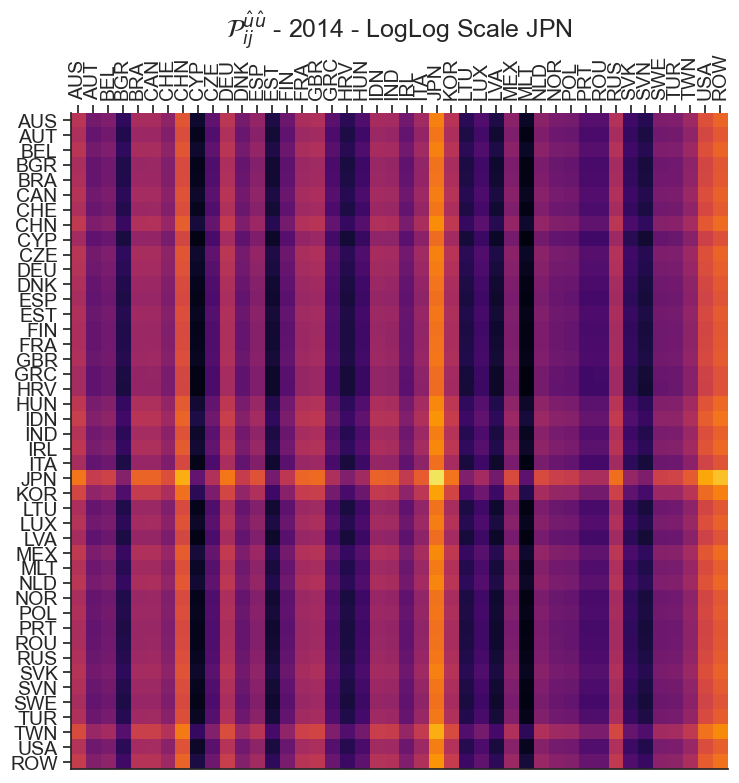

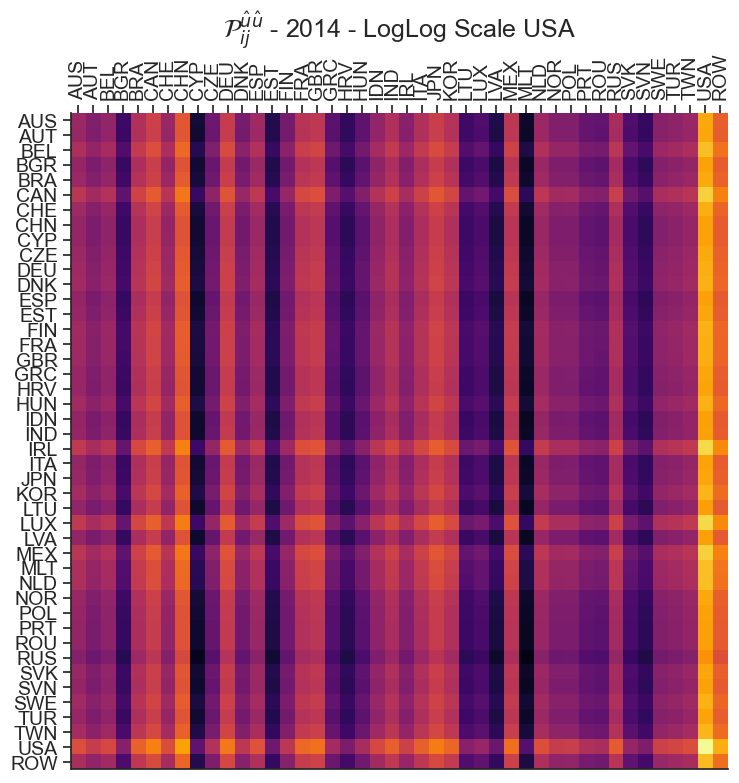

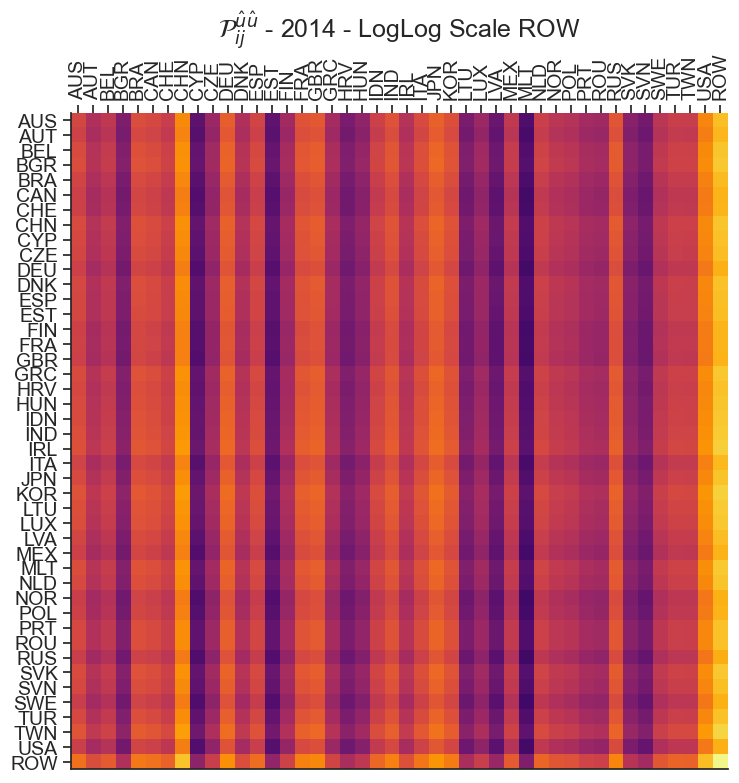

In [28]:
# Visualize the Disturbance End Fixed Matrix Sensitivity P^{uHat uHat}_{ij} for the year 2014 
# for the countries China, Germany, Russia, Japan, USA, Rest Of World
for ii, i in enumerate(countries_OI):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    year = "2014"
    t = 1
    title = r"$\mathcal{P}^{\hat{u}\hat{u}}_{ij}$ - "+year+" - LogLog Scale " + countries[i]
    data = np.log(np.log(P_uhatuhat_ij[t*len(countries_OI)+ii] + eps))    
    visualize_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

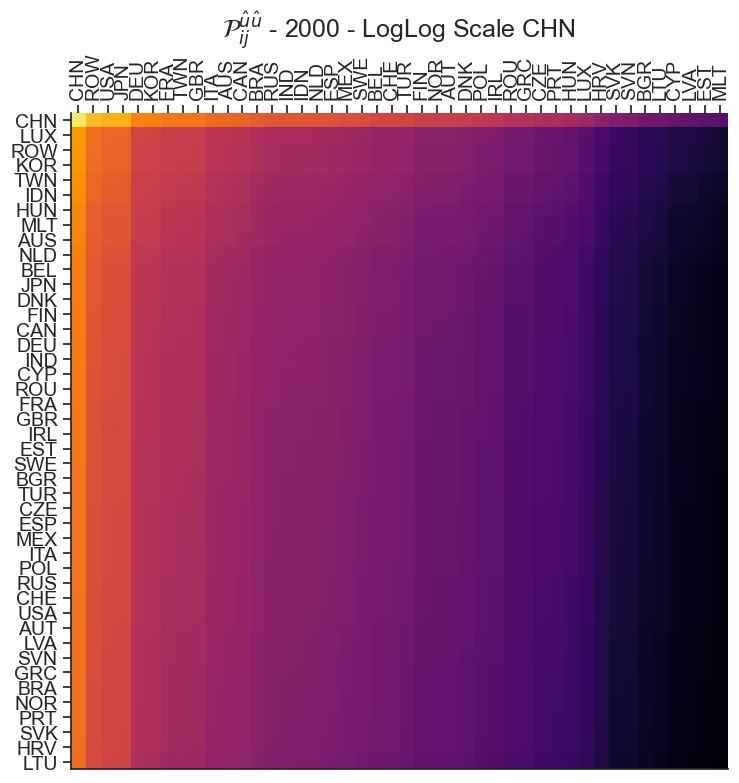

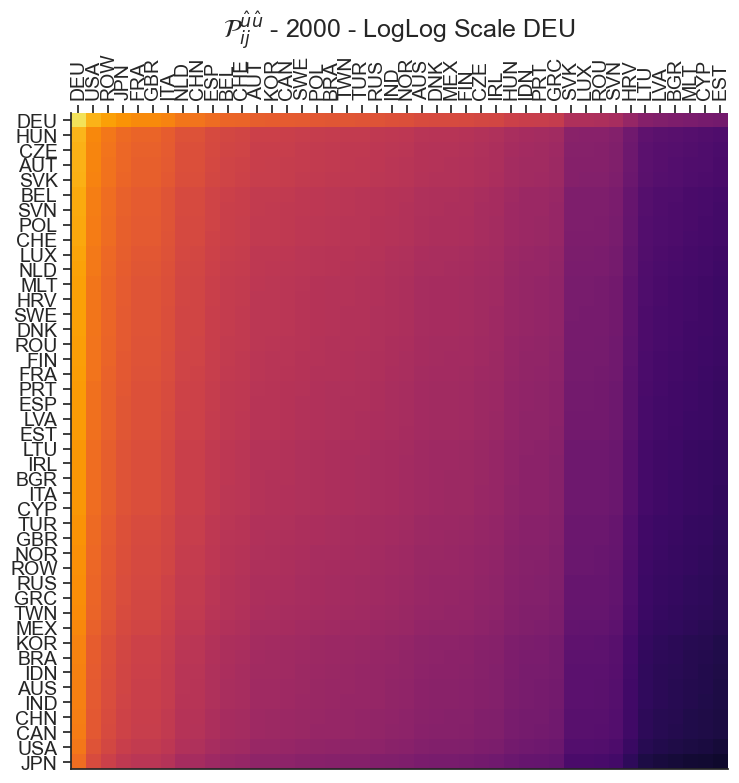

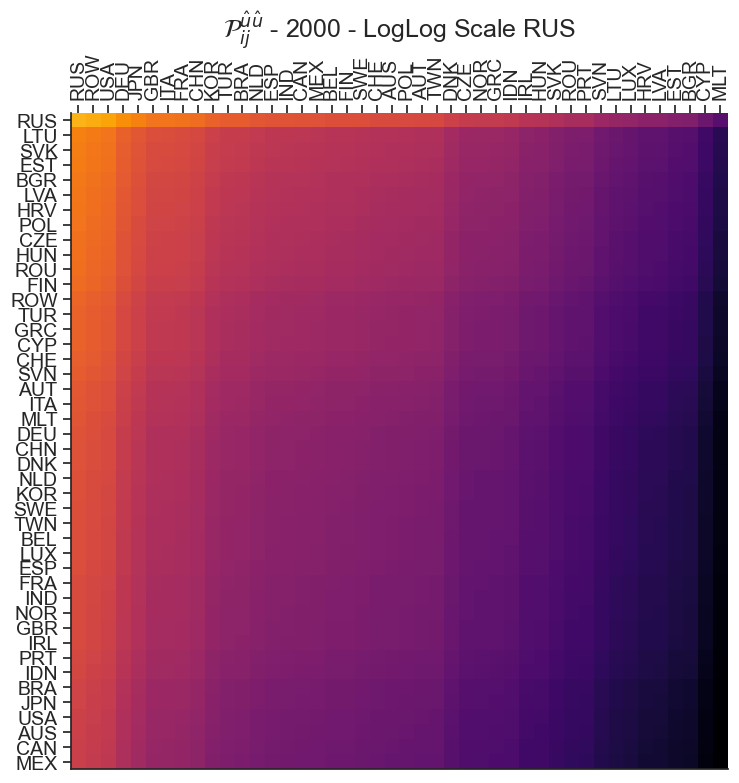

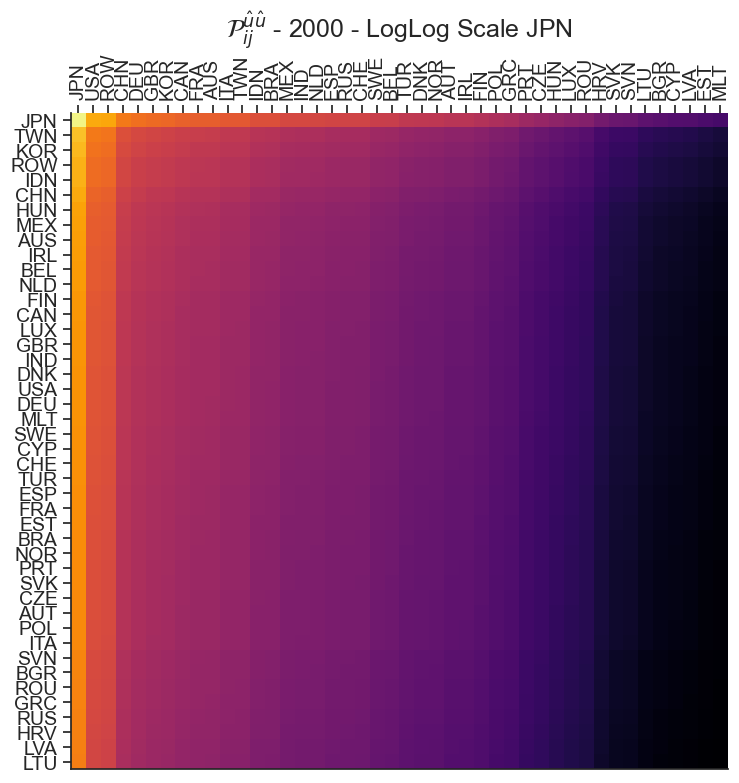

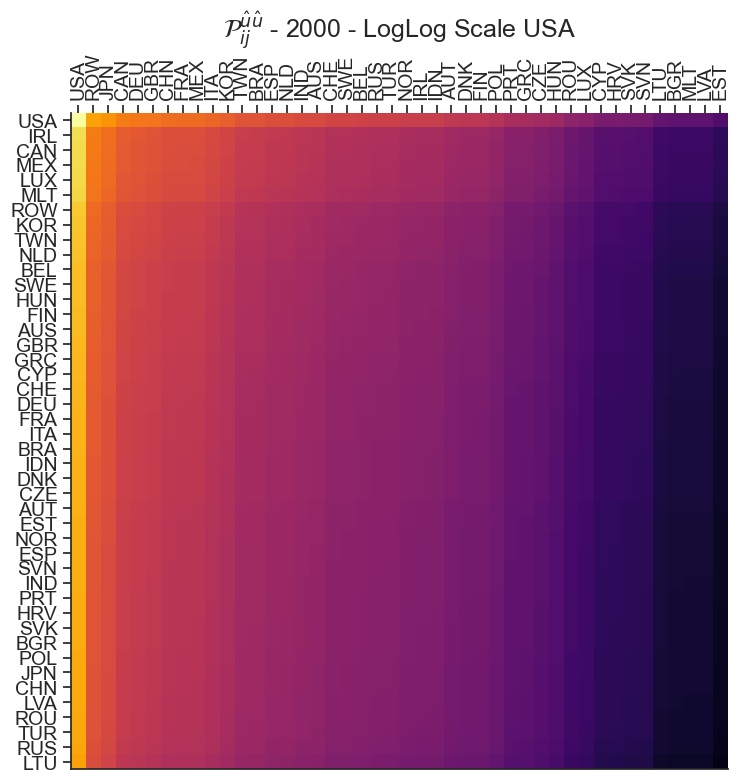

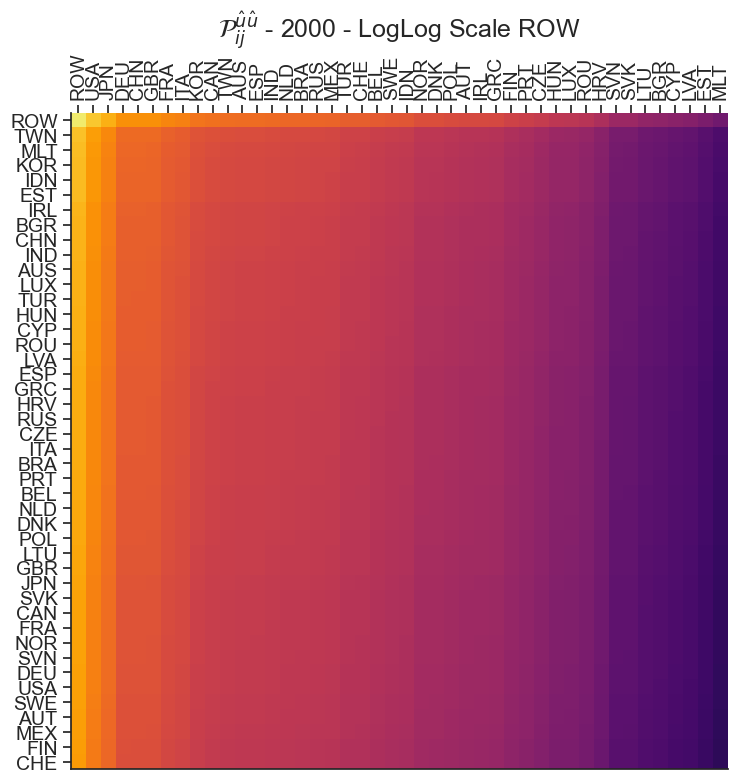

In [29]:
# Visualize the Disturbance End Fixed Matrix Sensitivity P^{uHat uHat}_{ij} for the year 2000 
# for the countries China, Germany, Russia, Japan, USA, Rest Of World (Sorted)
for ii, i in enumerate(countries_OI):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    year = "2000"
    t = 0
    title = r"$\mathcal{P}^{\hat{u}\hat{u}}_{ij}$ - "+year+" - LogLog Scale " + countries[i]
    data = np.log(np.log(P_uhatuhat_ij[t*len(countries_OI)+ii] + eps))    
    visualize_sorted_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

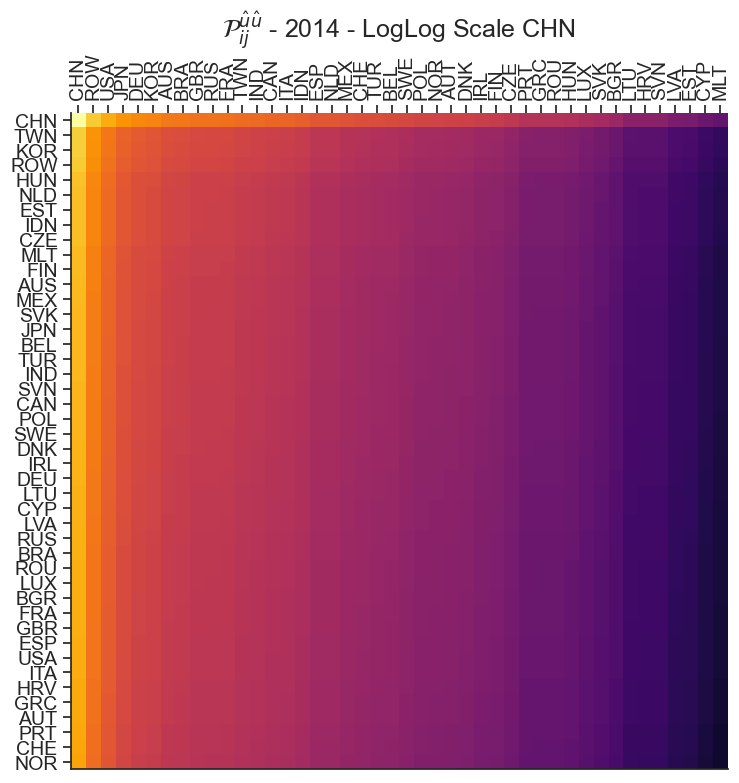

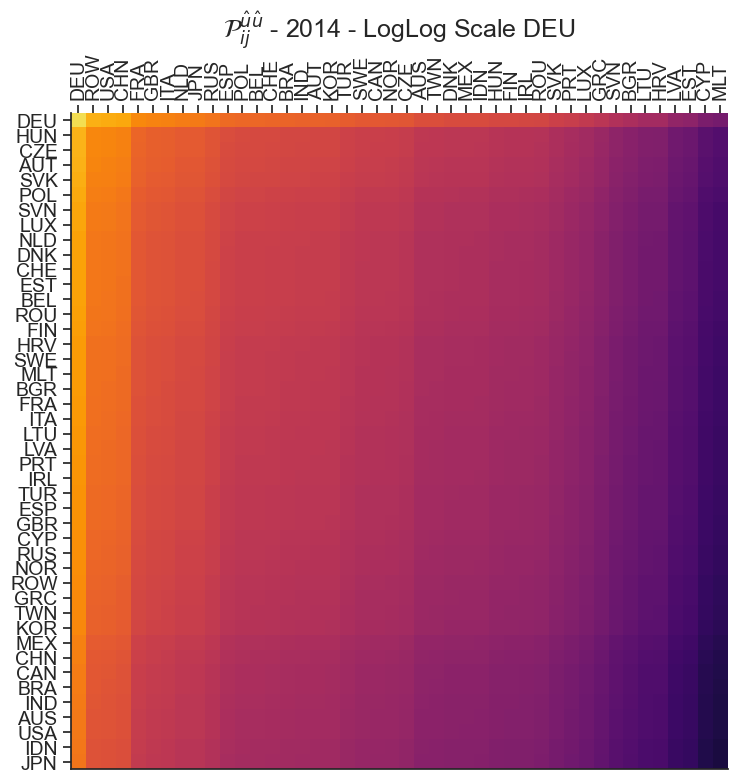

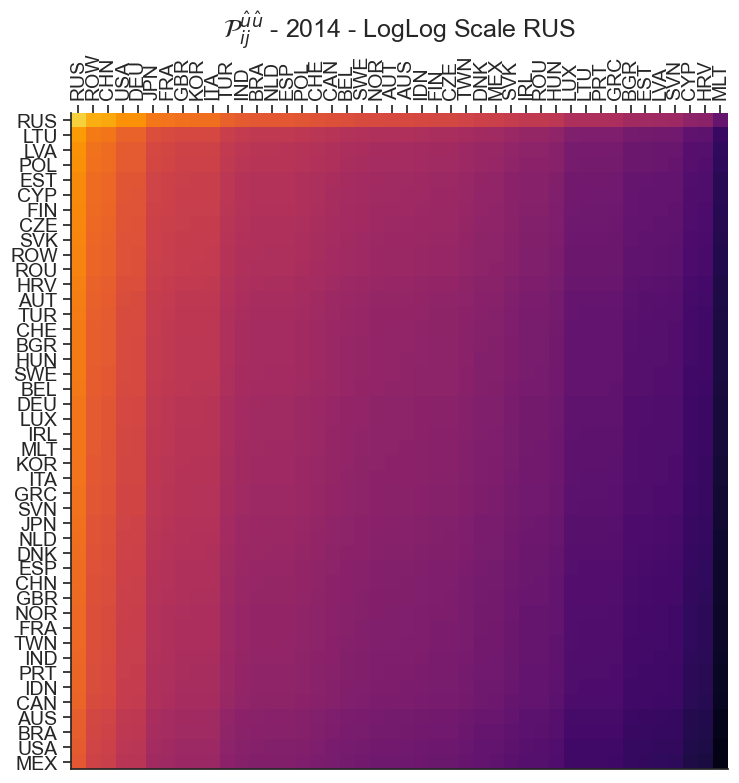

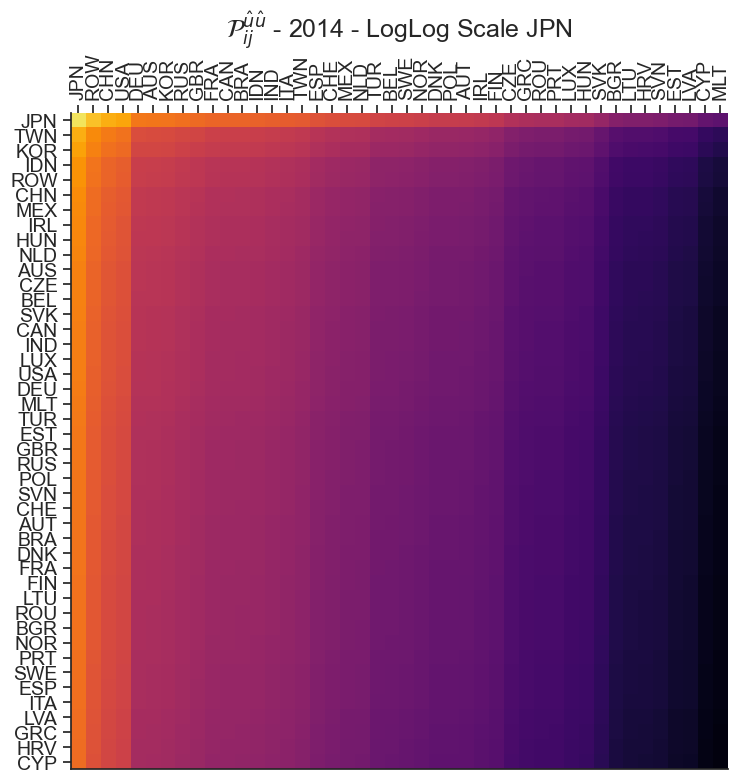

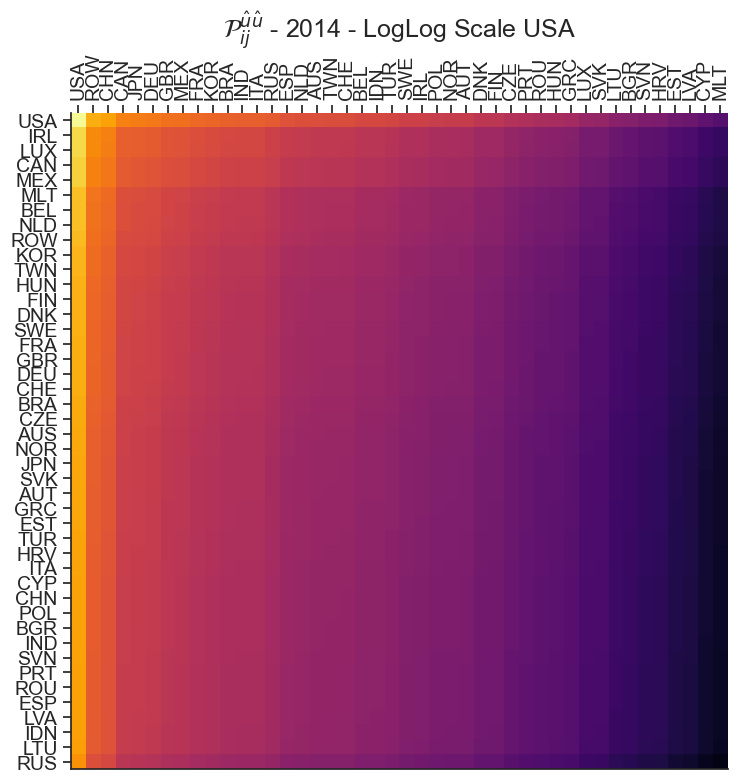

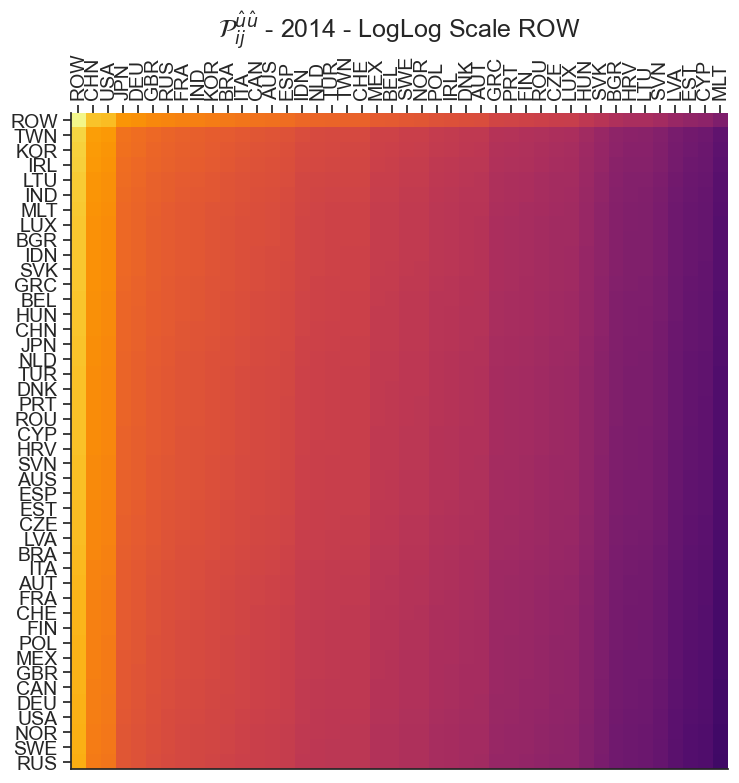

In [30]:
# Visualize the Disturbance End Fixed Matrix Sensitivity P^{uHat uHat}_{ij} for the year 2014 
# for the countries China, Germany, Russia, Japan, USA, Rest Of World (Sorted)
for ii, i in enumerate(countries_OI):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    year = "2014"
    t = 1
    title = r"$\mathcal{P}^{\hat{u}\hat{u}}_{ij}$ - "+year+" - LogLog Scale " + countries[i]
    data = np.log(np.log(P_uhatuhat_ij[t*len(countries_OI)+ii] + eps))    
    visualize_sorted_matrix(fig, ax, data, title, vmin = np.log(np.log(p_min_val+eps)), vmax = np.log(np.log(p_max_val+eps)))
    plt.tight_layout()

## Disturbance Start Input $\mathcal{P}^{u:}_{::}$ \& Output $\mathcal{P}^{:v}_{::}$ Sensitivity

In [31]:
P_u_agg = np.zeros((len(CIOT_data.keys()), N_countries))
P_v_agg = np.zeros((len(CIOT_data.keys()), N_countries))

for t, year in enumerate(CIOT_data.keys()):
    P_u_agg[t] = np.prod(P_uv_agg[t], axis=1)**(1/N_countries)
    P_v_agg[t] = np.prod(P_uv_agg[t], axis=0)**(1/N_countries)

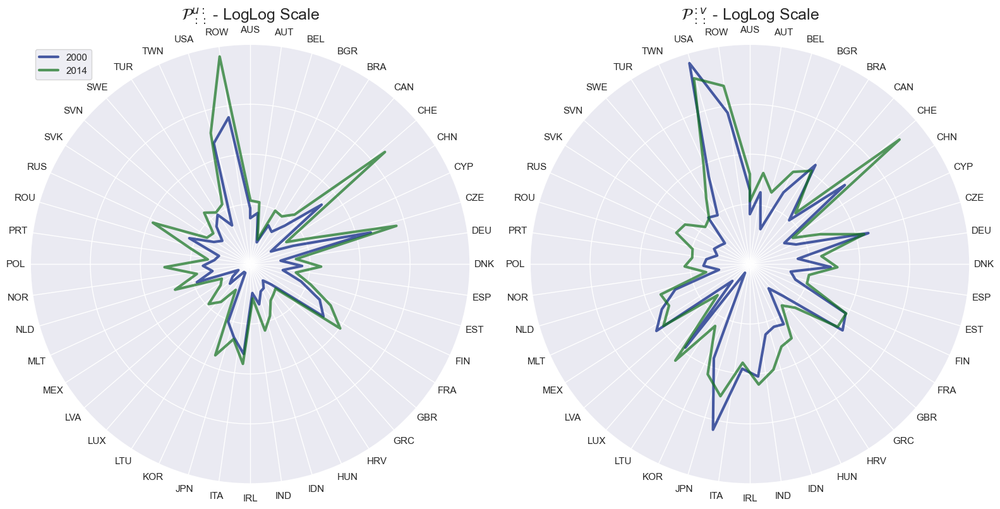

In [32]:
# Visualize the Disturbance Start Input and Output Sensitivity P^{u} and P^{v} for the years 2000 and 2014
sns.set_theme()
df_all = []
for year in ["2000", "2014"]:
    df = pd.DataFrame()
    df["year"] = np.repeat(year, 44)
    df["countries"] = countries
    df["input_sensitivity"] = np.log(np.log(P_u_agg[int(year) - 2000]))
    df["output_sensitivity"] = np.log(np.log(P_v_agg[int(year) - 2000]))
    df_all.append(df)
df = pd.concat(df_all)

fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1, projection='polar')
ax2 = fig.add_subplot(1, 2, 2, projection='polar')

for i, (sensitivity, title, ax) in enumerate(
        zip(["input_sensitivity", "output_sensitivity"], [
            r"$\mathcal{P}^{u:}_{::}$ - LogLog Scale",
            r"$\mathcal{P}^{:v}_{::}$ - LogLog Scale"
        ], [ax1, ax2])):
    visualize_polar(fig,
                    ax,
                    title,
                    df,
                    split="year",
                    split_values=["2000", "2014"],
                    data=sensitivity,
                    colors=np.array(col_dark)[[0, 2]])
    if(i==0):
        ax.legend(loc="upper left")
plt.tight_layout()
plt.show()

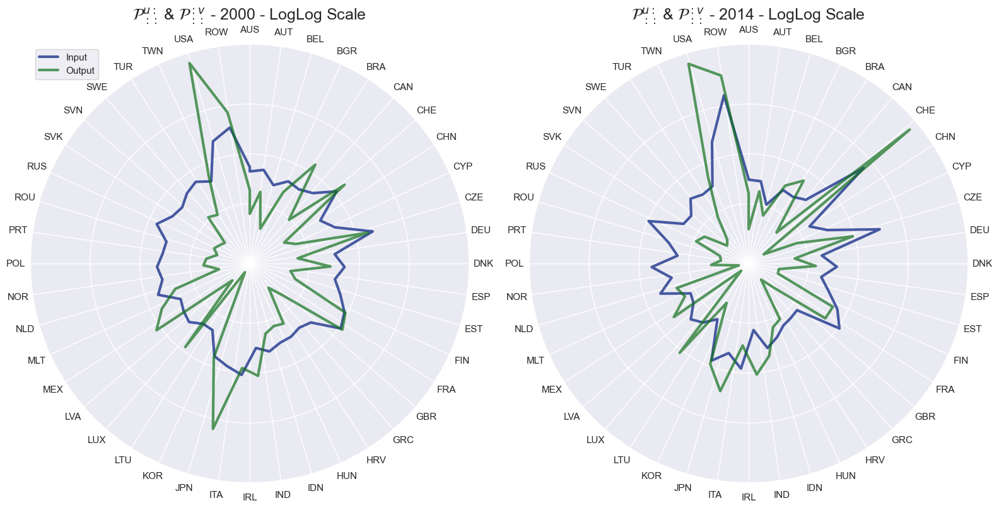

In [33]:
# Visualize the Disturbance Start Input and Output Sensitivity P^{u} and P^{v} for the years 2000 and 2014
sns.set_theme()
df_all  = []
for year in ["2000", "2014"]:
    df = pd.DataFrame()
    df["year"] = np.repeat(year, N_countries*2)
    df["countries"] = list(countries) + list(countries)
    df["I/O"] = np.hstack((np.repeat("Input",N_countries), np.repeat("Output",N_countries)))
    df["sensitivity"] = np.hstack((np.log(np.log(P_u_agg[int(year)-2000])), np.log(np.log(P_v_agg[int(year)-2000]))))
    df_all.append(df)
df = pd.concat(df_all)

fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1, projection='polar')
ax2 = fig.add_subplot(1, 2, 2, projection='polar')

for i, (year, ax) in enumerate(
    zip(["2000", "2014"], [ax1, ax2])):
    title = r"$\mathcal{P}^{u:}_{::}$ & " + r"$\mathcal{P}^{:v}_{::}$ - " + year + " - LogLog Scale "
    visualize_polar(fig,
                    ax,
                    title,
                    df[df["year"] == year],
                    split="I/O",
                    split_values=["Input", "Output"],
                    data="sensitivity",
                    colors=np.array(col_dark)[[0, 2]])
    if (i == 0):
        ax.legend(loc="upper left")
plt.tight_layout()
plt.show()

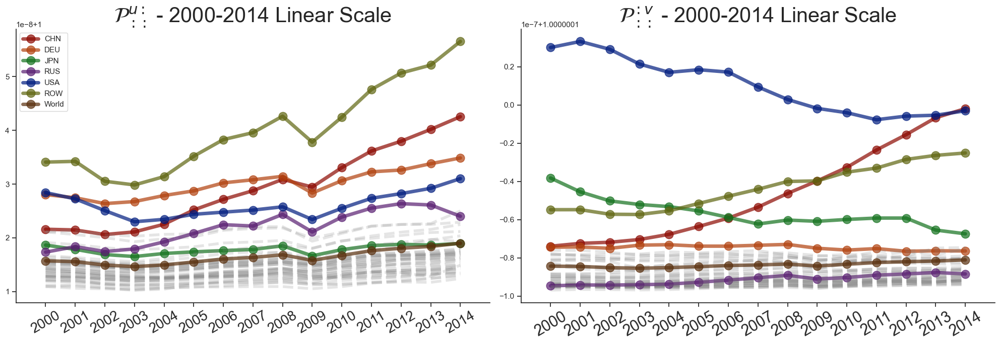

<Figure size 640x480 with 0 Axes>

In [34]:
# Visualize the Disturbance Start Input and Output Sensitivity P^{u} and P^{v} for the period 2000-2014
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
fig, ax = plt.subplots(1,2, figsize=(20,7))
visualize_time_series(fig, ax, P_u_agg, P_v_agg, title_1 = r"$\mathcal{P}^{u:}_{::}$ - 2000-2014 Linear Scale", title_2 = r"$\mathcal{P}^{:v}_{::}$ - 2000-2014 Linear Scale")
plt.tight_layout()
plt.show()

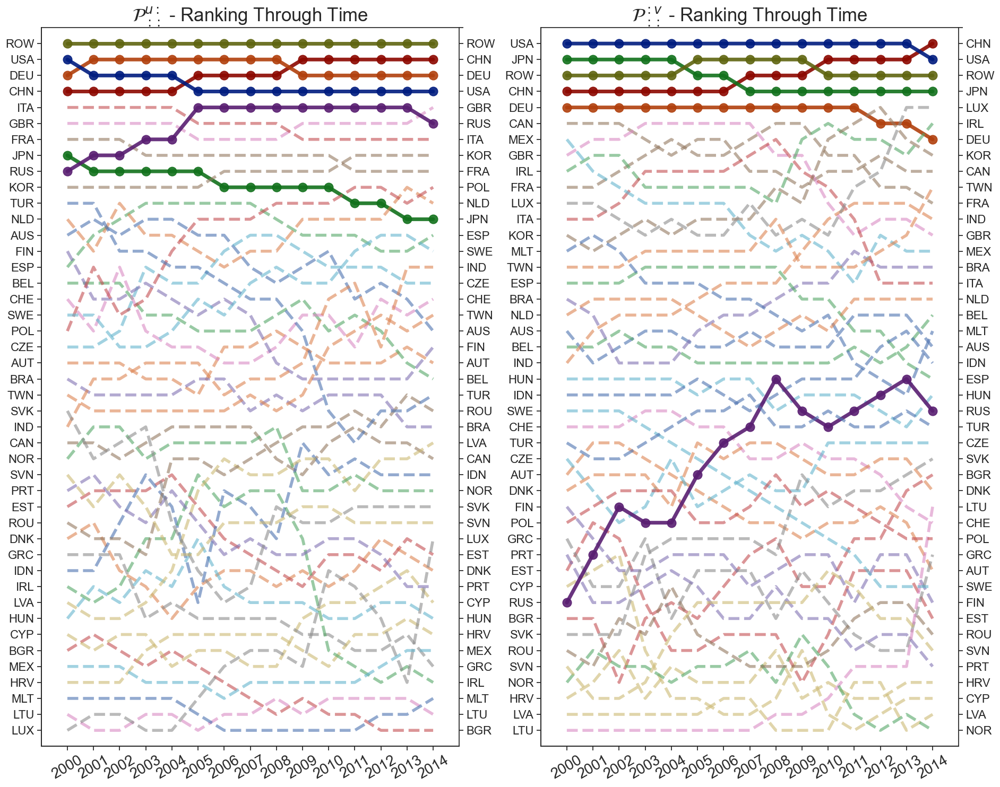

In [35]:
# Visualize the Disturbance Start Input and Output Sensitivity P^{u} and P^{v} Rankings for the period 2000-2014
fig, ax = plt.subplots(1,2, figsize=(19,15))
visualize_rankings(fig, ax, P_u_agg, P_v_agg, title_1 = r"$\mathcal{P}^{u:}_{::}$ - Ranking Through Time", title_2 = r"$\mathcal{P}^{:v}_{::}$ - Ranking Through Time")
plt.tight_layout()

## Disturbance End Input $\mathcal{P}^{::}_{i:}$ \& Output $\mathcal{P}^{::}_{:j}$ Sensitivities

In [36]:
P_agg_i = np.zeros((len(CIOT_data.keys()), N_countries))
P_agg_j = np.zeros((len(CIOT_data.keys()), N_countries))

for t, year in enumerate(CIOT_data.keys()):
    P_agg_i[t] = np.prod(P_agg_ij[t], axis=1)**(1/N_countries)
    P_agg_j[t] = np.prod(P_agg_ij[t], axis=0)**(1/N_countries)

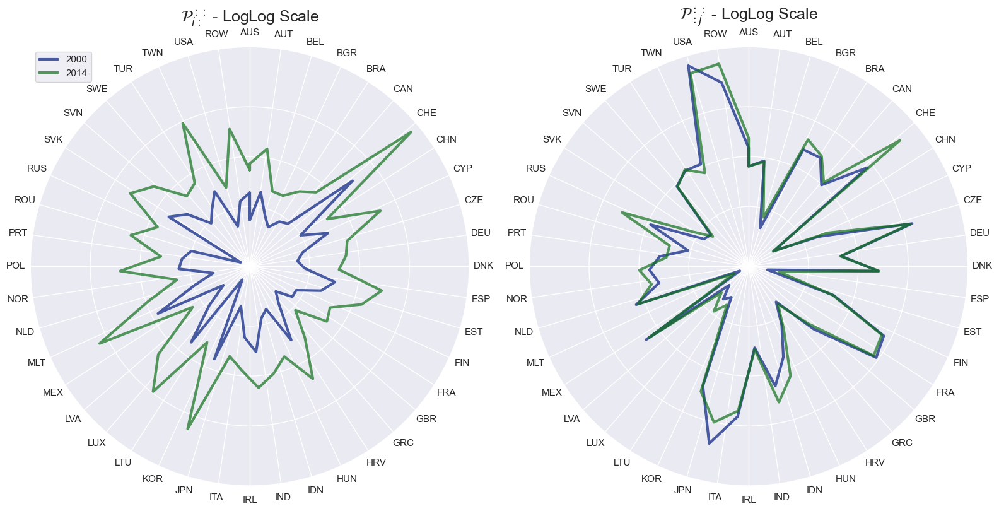

In [37]:
# Visualize the Disturbance End Input and Output Sensitivity P_{i} and P_{j} for the years 2000 and 2014
sns.set_theme()
df_all  = []
for year in ["2000", "2014"]:
    df = pd.DataFrame()
    df["year"] = np.repeat(year, 44)
    df["countries"] = countries
    df["input_sensitivity"] = np.log(np.log(P_agg_i[int(year)-2000]))
    df["output_sensitivity"] = np.log(np.log(P_agg_j[int(year)-2000]))
    df_all.append(df)    
df = pd.concat(df_all)

fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1, projection='polar')
ax2 = fig.add_subplot(1, 2, 2, projection='polar')

for i, (sensitivity, title, ax) in enumerate(
        zip(["input_sensitivity", "output_sensitivity"], [
            r"$\mathcal{P}^{::}_{i:}$ - LogLog Scale",
            r"$\mathcal{P}^{::}_{:j}$ - LogLog Scale"
        ], [ax1, ax2])):
    visualize_polar(fig,
                    ax,
                    title,
                    df,
                    split="year",
                    split_values=["2000", "2014"],
                    data=sensitivity,
                    colors=np.array(col_dark)[[0, 2]])
    if(i==0):
        ax.legend(loc="upper left")
plt.tight_layout()
plt.show()

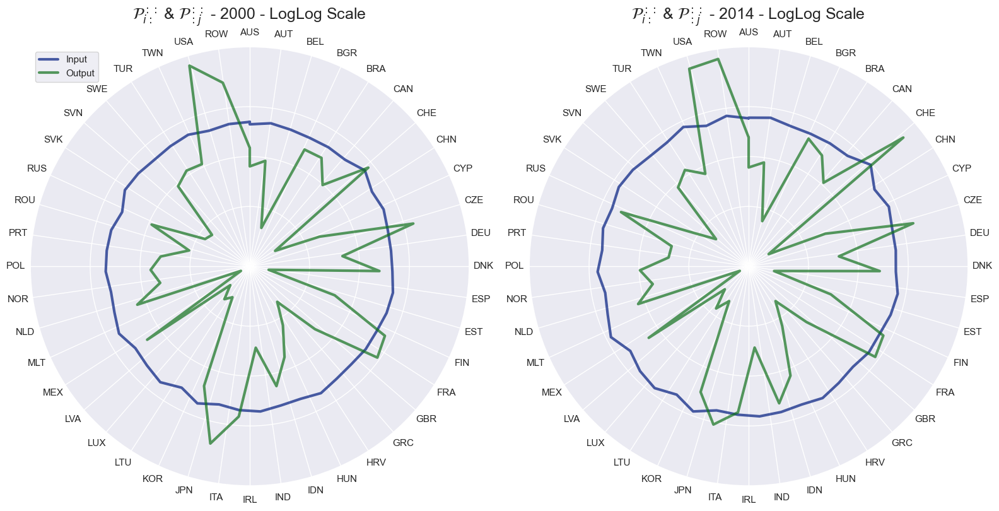

In [38]:
# Visualize the Disturbance End Input and Output Sensitivity P_{i} and P_{j} for the years 2000 and 2014
sns.set_theme()
df_all  = []
for year in ["2000", "2014"]:
    df = pd.DataFrame()
    df["year"] = np.repeat(year, N_countries*2)
    df["countries"] = list(countries) + list(countries)
    df["I/O"] = np.hstack((np.repeat("Input",N_countries), np.repeat("Output",N_countries)))
    df["sensitivity"] = np.hstack((np.log(np.log(P_agg_i[int(year)-2000])), np.log(np.log(P_agg_j[int(year)-2000]))))
    df_all.append(df)
df = pd.concat(df_all)

fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1, projection='polar')
ax2 = fig.add_subplot(1, 2, 2, projection='polar')

for i, (year, ax) in enumerate(
    zip(["2000", "2014"], [ax1, ax2])):
    title = r"$\mathcal{P}^{::}_{i:}$ & " + r"$\mathcal{P}^{::}_{:j}$ - " + year + " - LogLog Scale "
    visualize_polar(fig,
                    ax,
                    title,
                    df[df["year"] == year],
                    split="I/O",
                    split_values=["Input", "Output"],
                    data="sensitivity",
                    colors=np.array(col_dark)[[0, 2]])
    if (i == 0):
        ax.legend(loc="upper left")
plt.tight_layout()
plt.show()

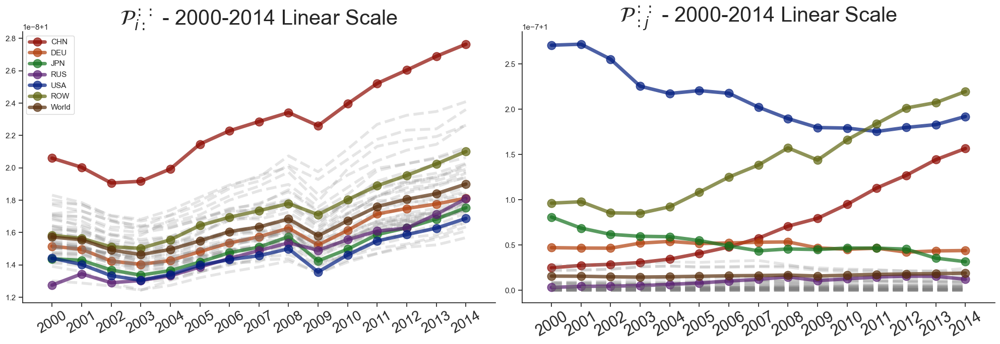

<Figure size 640x480 with 0 Axes>

In [39]:
# Visualize the Disturbance End Input and Output Sensitivity P_{i} and P_{j} for the period 2000-2014
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)

fig, ax = plt.subplots(1,2, figsize=(20,7))
visualize_time_series(fig, ax, P_agg_i, P_agg_j, title_1 = r"$\mathcal{P}^{::}_{i:}$ - 2000-2014 Linear Scale", title_2 = r"$\mathcal{P}^{::}_{:j}$ - 2000-2014 Linear Scale")
plt.tight_layout()
plt.show()

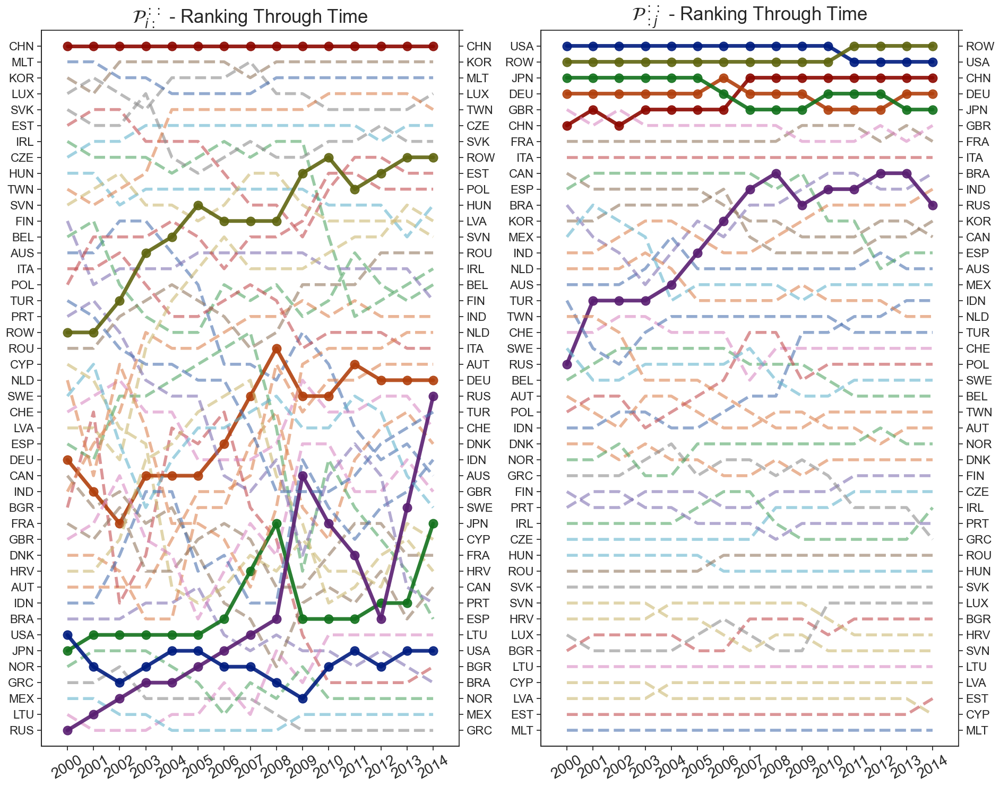

In [40]:
# Visualize the Disturbance Start Input and Output Sensitivity P_{i} and P_{j} Rankings for the period 2000-2014
fig, ax = plt.subplots(1,2, figsize=(19,15))
visualize_rankings(fig, ax, P_agg_i, P_agg_j, title_1 = r"$\mathcal{P}^{::}_{i:}$ - Ranking Through Time", title_2 = r"$\mathcal{P}^{::}_{:j}$ - Ranking Through Time")
plt.tight_layout()

## Disturbance End Fixed Input $\mathcal{P}^{\hat{u}\hat{v}}_{i:}$ \& Output $\mathcal{P}^{\hat{u}\hat{v}}_{:j}$ Sensitivity

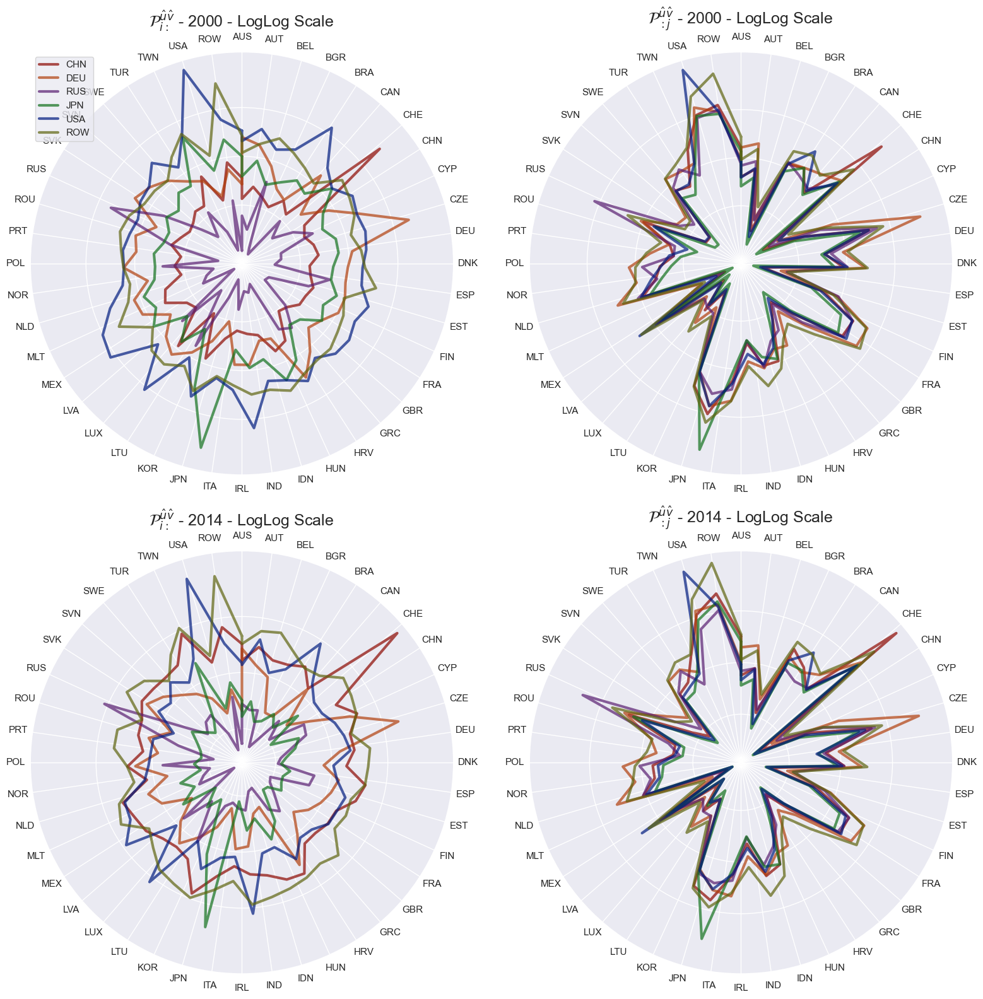

In [41]:
# Visualize the Disturbance End Fixed Input and Output Sensitivity P^{uHat uHat}_{i} and P^{uHat uHat}_{j} for the years 2000 and 2014
# for the countries China, Germany, Russia, Japan, USA, Rest Of World
sns.set_theme()
df_all = []
for year in ["2000", "2014"]:
    for i in countries_OI:
        P_tmp = CIOT_data[year].P[:, i * 44 + i].reshape(44, 44)
        P_Input = np.prod(P_tmp, axis=1)**(1 / N_countries)
        P_Output = np.prod(P_tmp, axis=0)**(1 / N_countries)
        df = pd.DataFrame()
        df["country"] = np.repeat(countries[i], 44)
        df["countries"] = countries
        df["input_sensitivity"] = np.log(np.log(P_Input))
        df["output_sensitivity"] = np.log(np.log(P_Output))
        df["year"] = year
        df_all.append(df)
df = pd.concat(df_all)

fig = plt.figure(figsize=(16, 16))
ax_list = []
for i in range(4):
    ax_list.append(fig.add_subplot(2, 2, i+1, projection='polar'))

i = 0
for year in ["2000", "2014"]:
    for sensitivity in ["input_sensitivity", "output_sensitivity"]:
        if(i%2==0):
            title = r"$\mathcal{P}^{\hat{u}\hat{v}}_{i:}$ - " + year + " - LogLog Scale "
        else:
            title = r"$\mathcal{P}^{\hat{u}\hat{v}}_{:j}$ - " + year + " - LogLog Scale "
            
        visualize_polar(fig,
                        ax_list[i],
                        title,
                        df[df["year"] == year],
                        split="country",
                        split_values=countries[countries_OI],
                        data=sensitivity,
                        colors=[
                            top_country_colors[col]
                            for col in countries[countries_OI]
                        ],
                        rmin=np.min(df[sensitivity]),
                        rmax=np.max(df[sensitivity]))
        if (i == 0):
            ax_list[i].legend(loc="upper left")
        i+=1
        
plt.tight_layout()
plt.show()

## Overall Sensitivity $\mathcal{P}^{::}_{::}$

In [42]:
Z_agg_agg = np.zeros(len(CIOT_data.keys()))
for t, year in enumerate(CIOT_data.keys()):
    Z_agg_agg[t] = np.mean(CIOT_data[year].Z) # Arithmetic Mean

In [43]:
P_agg_agg = np.zeros(len(CIOT_data.keys()))
for t, year in enumerate(CIOT_data.keys()):
    P_agg_agg[t] = np.exp(np.mean(np.log(CIOT_data[year].P))) # Geometric Mean

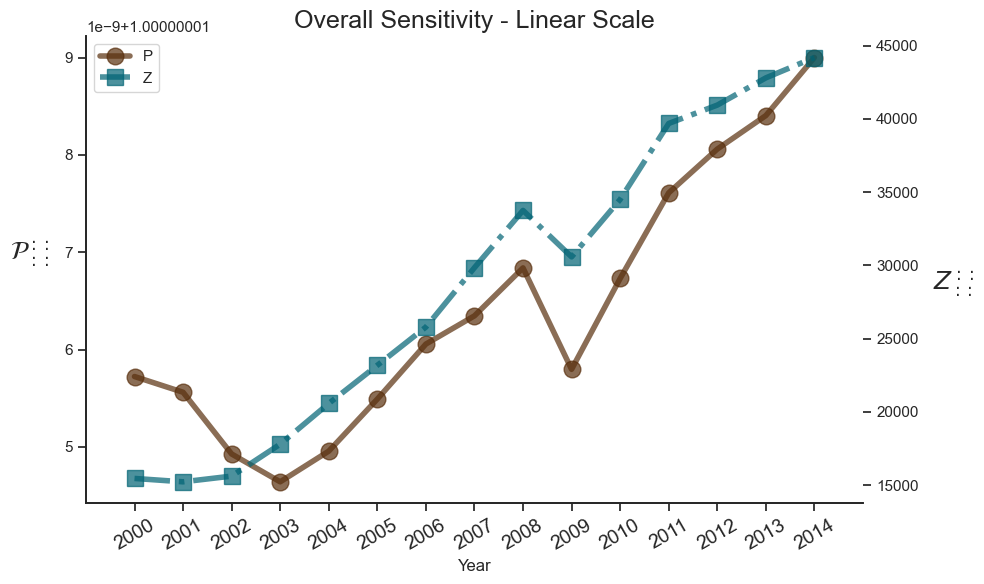

In [44]:
# Visualize the Overall Sensitivity P^{::}_{::} compared to Z^{::}_{::} for the period 2000-2014

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)

fig, ax1 = plt.subplots(1,1, figsize=(10,6))
plt.title("Overall Sensitivity - Linear Scale", fontsize=18)

lns1 = plt.plot(P_agg_agg, "-o", linewidth=4, markersize=12, alpha=0.7, label = "P", color=top_country_colors["WLD"])
ax1.set_xticks(np.arange(15))
ax1.set_xticklabels(np.arange(2000,2015), size=14, rotation=30)

ax1.set_xlabel('Year')
ax1.set_ylabel(r'$\mathcal{P}^{::}_{::}$', fontsize=18, rotation=0, labelpad=25)

ax2 = ax1.twinx()
ax2.set_ylabel(r'$Z^{::}_{::}$', fontsize=18, rotation=0, labelpad=25)
lns2 = ax2.plot(Z_agg_agg, "s-.", linewidth=4, markersize=12, alpha=0.7, label = "Z", color=top_country_colors["WLD2"])

lns = lns1+lns2
labs = [l.get_label() for l in lns]
plt.legend(lns, labs, loc=0)

plt.xlim(-1, 15)
plt.tight_layout()